### LSE Data Analytics Online Career Accelerator 

# DA301:  Advanced Analytics for Organisational Impact

## Assignment template

### Scenario
You are a data analyst working for Turtle Games, a game manufacturer and retailer. They manufacture and sell their own products, along with sourcing and selling products manufactured by other companies. Their product range includes books, board games, video games and toys. They have a global customer base and have a business objective of improving overall sales performance by utilising customer trends. In particular, Turtle Games wants to understand: 
- how customers accumulate loyalty points (Week 1)
- exploring the structure using decision trees (Week 2)
- exploring clusters in customer behaviour (Week 3)
- can social data (e.g. customer reviews) be used in marketing campaigns (Week 4)
- loading, transforming and visualising data in R (Week 5)
- statistical analysis and modelling in R (Week 6)

# Week 1 assignment: Linear regression using Python
The marketing department of Turtle Games prefers Python for data analysis. As you are fluent in Python, they asked you to assist with data analysis of social media data. The marketing department wants to better understand how users accumulate loyalty points. Therefore, you need to investigate the possible relationships between the loyalty points, age, remuneration, and spending scores. Note that you will use this data set in future modules as well and it is, therefore, strongly encouraged to first clean the data as per provided guidelines and then save a copy of the clean data for future use.

## Instructions
1. Load and explore the data.
    1. Create a new DataFrame (e.g. reviews).
    2. Sense-check the DataFrame.
    3. Determine if there are any missing values in the DataFrame.
    4. Create a summary of the descriptive statistics.
2. Remove redundant columns (`language` and `platform`).
3. Change column headings to names that are easier to reference (e.g. `renumeration` and `spending_score`).
4. Save a copy of the clean DataFrame as a CSV file. Import the file to sense-check.
5. Use linear regression and goodness of fit metrics to evaluate possible linear relationships between loyalty points and age/renumeration/spending scores to determine whether these can be used to predict the loyalty points.
    1. Specify the independent and dependent variables.
    2. Create the OLS model.
    3. Extract the estimated parameters, standard errors, and predicted values.
    4. Generate the regression table based on the X coefficient and constant values.
    5. Plot the linear regression and add a regression line.
6. Include your insights and observations.

## 1. Load and explore the data

In [6]:
# Imports
import pandas as pd
import numpy as np
import nltk 
import os 
import sklearn
import statsmodels.api as sm
import warnings
import wordcloud
import textblob

# Visualisation:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.cm as cm

# Import the necessary package.
from statsmodels.formula.api import ols
from statsmodels.stats.diagnostic import het_breuschpagan
from statsmodels.stats.outliers_influence import variance_inflation_factor

from sklearn import datasets 
from sklearn import linear_model
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split 
from sklearn import metrics
from sklearn import tree
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.metrics import classification_report
from sklearn.datasets import load_iris
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.metrics import accuracy_score
from wordcloud import WordCloud

from textblob import TextBlob


from mpl_toolkits.mplot3d import Axes3D

from scipy.spatial.distance import cdist
from scipy.stats import norm

from wordcloud import WordCloud

from nltk.tokenize import word_tokenize
from nltk.probability import FreqDist
from nltk.corpus import stopwords

from textblob import TextBlob

# Import Counter.
from collections import Counter

In [7]:
# Define functions

def plot_sentiment_histogram(data, column, num_bins=15, color='red', title='Histogram of Sentiment Scores'):
    """
    Plots a histogram for the sentiment scores of a given column.

    """
    # Set the plot area
    plt.figure(figsize=(16,9))

    # Define the bars
    n, bins, patches = plt.hist(data[column], num_bins, facecolor=color, alpha=0.6)

    # Set the labels
    plt.xlabel(f'{column} Sentiment Score', fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.title(title, fontsize=20)

    # Show the plot
    plt.show()

# Categorise polarity score
def get_blob_sentiment(score):
    if score > 0:
        return 'Positive'
    elif score == 0:
        return 'Neutral'
    else:
        return 'Negative'


# Categorise subjectivity score 
def get_subjectivity(subjectivity_score):
    if subjectivity_score <= 0.3:
        return 'Low Subjectivity'
    elif subjectivity_score > 0.3 and subjectivity_score <= 0.7:
        return 'Moderate Subjectivity'
    else:
        return 'High Subjectivity'

# Define function to calculate polarity with TEXT
def polarity(text):
    """ Extract polarity and subjectivity score (-1 to +1) for each comment"""
    analysis = TextBlob(text).sentiment
    polarity_score = analysis.polarity
    subjectivity_score = analysis.subjectivity
    return polarity_score, subjectivity_score

# Determine overall sentiment based on compound scores
def get_sentiment_label(compound):
    if compound >= 0.05:
        return 'Positive'
    elif compound <= -0.05:
        return 'Negative'
    else:
        return 'Neutral'

def calculate_avg(df, column_name):
    
    """ Calculates and prints the average polarity score or average subjectivity score for a given column in a DataFrame."""
    
    avg = df[column_name].mean()
    print(f"Average {column_name} score: {avg:.2f}")
    return avg

# Define a user function to calculate subjectivity. 
def generate_subjectivity(comment):
    return TextBlob(comment).sentiment[1]

# Provided function.
def generate_polarity(comment):
    """ Extract polarity score (-1 to +1) for each comment"""
    return TextBlob(comment).sentiment[0]

def plot_qq(residuals):
    
    """ Generates a Q-Q plot for the given residuals."""
    
    sm.qqplot(residuals, fit=True, line='45')
    plt.ylabel("Residual Quartiles")
    plt.xlabel("Normal Quartiles")
    plt.title("Q-Q Plot")
    plt.show()

def generate_wordcloud(text, save_path='summary_wordcloud.png'):
    
    """ Generates and saves a word cloud from the given text."""

    # Create a WordCloud object
    wordcloud = WordCloud(
        width=1600, 
        height=900, 
        background_color='white', 
        colormap='tab10', 
        min_font_size=10
    ).generate(text)

    # Plot the WordCloud image
    plt.figure(figsize=(16, 9), facecolor=None)
    plt.imshow(wordcloud)
    plt.axis('off')
    plt.tight_layout(pad=0)

    # Save the plot
    plt.savefig(save_path)

    # Display the plot
    plt.show()



In [8]:
# Load the CSV file(s) as reviews.
reviews = pd.read_csv('turtle_reviews.csv')

# View the DataFrame.
reviews.head()

,gender,age,remuneration (k£),spending_score (1-100),loyalty_points,education,language,platform,product,review,summary
0,Male,18,12.30,39,210,graduate,EN,Web,453,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...
1,Male,23,12.30,81,524,graduate,EN,Web,466,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...
2,Female,22,13.12,6,40,graduate,EN,Web,254,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless"
3,Female,25,13.12,77,562,graduate,EN,Web,263,Amazing buy! Bought it as a gift for our new d...,Five Stars
4,Female,33,13.94,40,366,graduate,EN,Web,291,As my review of GF9's previous screens these w...,Money trap


In [9]:
# View the last five rows to check if the footer is a metadata
reviews.tail()

,gender,age,remuneration (k£),spending_score (1-100),loyalty_points,education,language,platform,product,review,summary
1995,Female,37,84.46,69,4031,PhD,EN,Web,977,The perfect word game for mixed ages (with Mom...,The perfect word game for mixed ages (with Mom
1996,Female,43,92.66,8,539,PhD,EN,Web,979,Great game. Did not think I would like it whe...,Super fun
1997,Male,34,92.66,91,5614,graduate,EN,Web,1012,Great game for all.........\nKeeps the mind ni...,Great Game
1998,Male,34,98.40,16,1048,PhD,EN,Web,1031,fun game!,Four Stars
1999,Male,32,92.66,8,479,PhD,EN,Web,453,This game is fun. A lot like scrabble without ...,Love this game


In [10]:
print(reviews.shape)

(2000, 11)


In [11]:
# Any duplicates in the df?
reviews.duplicated().sum()

np.int64(0)

In [12]:
# Any missing values?
reviews.isnull().sum()

gender                    0
age                       0
remuneration (k£)         0
spending_score (1-100)    0
loyalty_points            0
education                 0
language                  0
platform                  0
product                   0
review                    0
summary                   0
dtype: int64

* No missing values in the DataFrame

In [14]:
# Explore the data.
reviews.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 11 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   gender                  2000 non-null   object 
 1   age                     2000 non-null   int64  
 2   remuneration (k£)       2000 non-null   float64
 3   spending_score (1-100)  2000 non-null   int64  
 4   loyalty_points          2000 non-null   int64  
 5   education               2000 non-null   object 
 6   language                2000 non-null   object 
 7   platform                2000 non-null   object 
 8   product                 2000 non-null   int64  
 9   review                  2000 non-null   object 
 10  summary                 2000 non-null   object 
dtypes: float64(1), int64(4), object(6)
memory usage: 172.0+ KB


In [15]:
# Basic descriptive statistics.
reviews.describe()

,age,remuneration (k£),spending_score (1-100),loyalty_points,product
count,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,39.495000,48.079060,50.000000,1578.032000,4320.521500
std,13.573212,23.123984,26.094702,1283.239705,3148.938839
min,17.000000,12.300000,1.000000,25.000000,107.000000
25%,29.000000,30.340000,32.000000,772.000000,1589.250000
50%,38.000000,47.150000,50.000000,1276.000000,3624.000000
75%,49.000000,63.960000,73.000000,1751.250000,6654.000000
max,72.000000,112.340000,99.000000,6847.000000,11086.000000


## 2. Drop columns

In [17]:
# Drop unnecessary columns.
reviews.drop(['language', 'platform'], axis=1, inplace=True)

# View column names.
reviews.columns

Index(['gender', 'age', 'remuneration (k£)', 'spending_score (1-100)',
       'loyalty_points', 'education', 'product', 'review', 'summary'],
      dtype='object')

## 3. Rename columns

In [19]:
# Rename the column headers.
reviews.rename(columns={'remuneration (k£)':'income',
                       'spending_score (1-100)':'spending_score'},
                        inplace=True)

# View column names.
reviews.columns

Index(['gender', 'age', 'income', 'spending_score', 'loyalty_points',
       'education', 'product', 'review', 'summary'],
      dtype='object')

## 4. Save the DataFrame as a CSV file

In [21]:
# Create a CSV file as output.
reviews.to_csv('reviews.csv', index=False)

In [22]:
# Import new CSV file with Pandas.
reviews_clean = pd.read_csv('reviews.csv')

# View DataFrame.
reviews_clean.head()

,gender,age,income,spending_score,loyalty_points,education,product,review,summary
0,Male,18,12.30,39,210,graduate,453,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...
1,Male,23,12.30,81,524,graduate,466,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...
2,Female,22,13.12,6,40,graduate,254,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless"
3,Female,25,13.12,77,562,graduate,263,Amazing buy! Bought it as a gift for our new d...,Five Stars
4,Female,33,13.94,40,366,graduate,291,As my review of GF9's previous screens these w...,Money trap


#### Initial data exploration and identification of outliers. 

Text(0.5, 1.0, 'Loyalty Points Distribution')

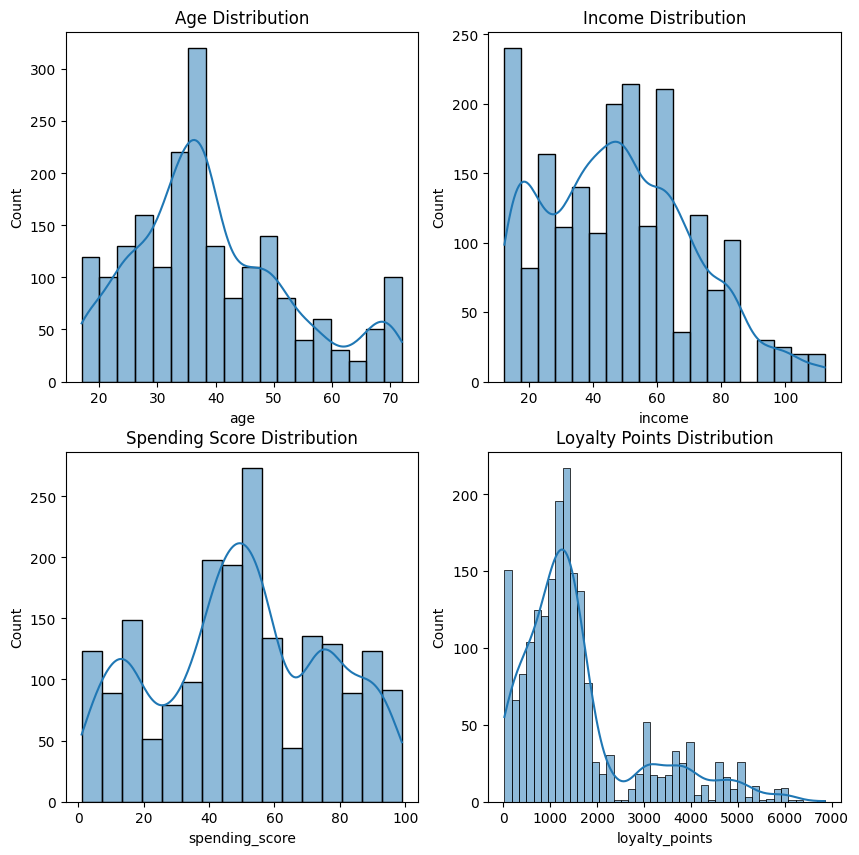

In [24]:
# Visualise the data and check distribution 
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(10, 10))

sns.histplot(data= reviews_clean, x='age', kde=True, ax=ax1)
ax1.set_title('Age Distribution')

sns.histplot(data=reviews_clean, x='income', kde=True, ax=ax2)
ax2.set_title('Income Distribution')

sns.histplot(data=reviews_clean, x='spending_score', kde=True, ax=ax3)
ax3.set_title('Spending Score Distribution')

sns.histplot(data=reviews_clean, x='loyalty_points', kde=True, ax=ax4)
ax4.set_title('Loyalty Points Distribution')

* Age: appears approximately bell-shaped, indicating a somewhat normal distribution, slightly right-skewed (positively skewed). Majority of customers are between 30-40 years old.
* Income: Right-skewed (positively skewed). There seems to be a larger population with lower to moderate income, with fewer high-income customers.
* Spending score: multiple peaks indicating a multimodal distribution. Values are well-distributed between 0 and 100, indicating variation in spending behavior.
* Loyalty points: Highly right-skewed, with a long tail towards higher values. Most customers have low loyalty points (below 1000). A logaritmic or square root transformation might be beneficial here to normalise the data.

In [26]:
# Check for correlation between the numerical variables.
reviews_clean.corr(numeric_only=True)

,age,income,spending_score,loyalty_points,product
age,1.000000,-0.005708,-0.224334,-0.042445,0.003081
income,-0.005708,1.000000,0.005612,0.616065,0.305309
spending_score,-0.224334,0.005612,1.000000,0.672310,-0.001649
loyalty_points,-0.042445,0.616065,0.672310,1.000000,0.183600
product,0.003081,0.305309,-0.001649,0.183600,1.000000


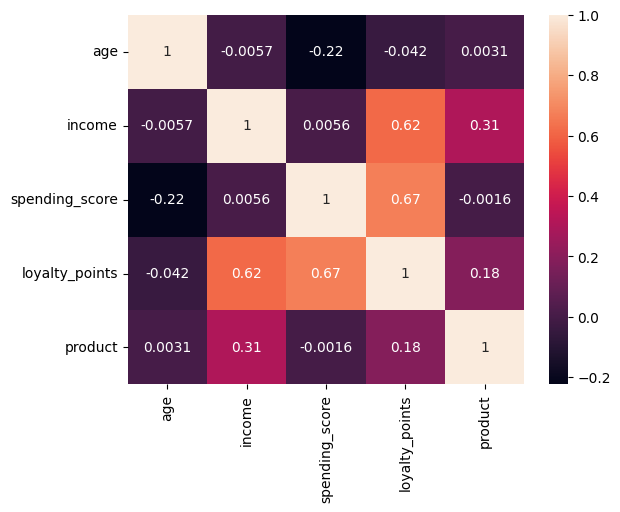

In [27]:
# Visualise the correlation between variables using a heatmap. 
sns.heatmap(reviews_clean.corr(numeric_only=True), annot = True)

# Save the plot.
plt.savefig('Correlation heatmap')

# View the plot.
plt.show() 

* The output shows a stronger relationship between loyalty points and spending score and income.
* Age does not appear to be correlated to loyalty points. 


C:\Users\diana\AppData\Local\Temp\ipykernel_9280\3285212924.py:11: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels, rotation=0)  # Keep labels horizontal


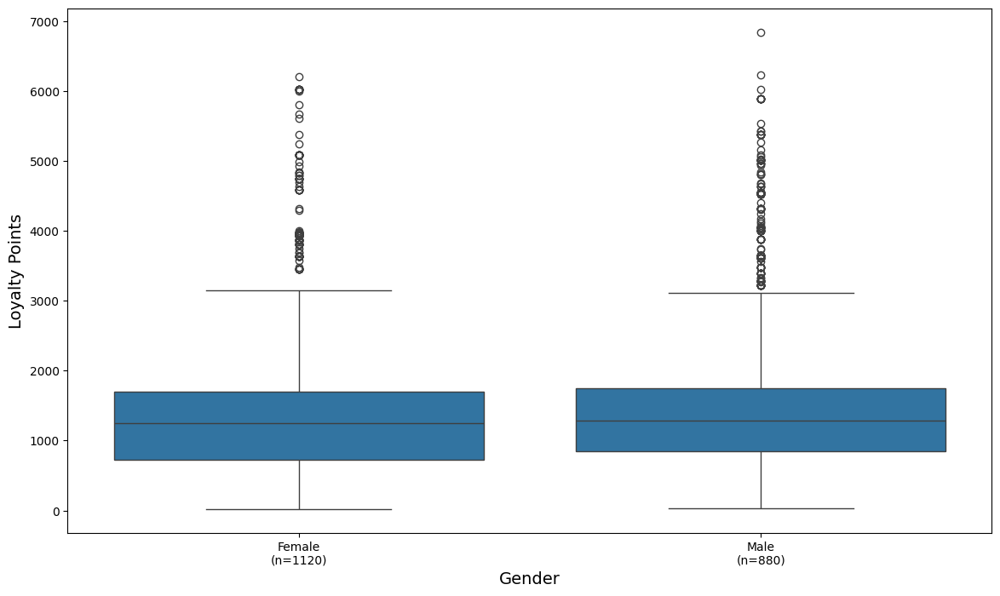

In [29]:
# Create a boxplot using Seaborn of gender versus loyalty points. 
# Create the figure and set the size.
fig, ax = plt.subplots(figsize=(14, 8))

# Create the boxplot.
sns.boxplot(data=reviews_clean, x='gender', y='loyalty_points', ax=ax)

# Add the count of observations for gender to the x-axis labels.
gender_counts = reviews_clean['gender'].value_counts()
labels = [f'{gender}\n(n={count})' for gender, count in zip(gender_counts.index, gender_counts.values)]
ax.set_xticklabels(labels, rotation=0)  # Keep labels horizontal

# Set the x-axis and y-axis labels with adjusted font size.
ax.set_xlabel('Gender', fontsize=14)
ax.set_ylabel('Loyalty Points', fontsize=14)

# Save the plot.
plt.savefig('Gender.png')

# Show the plot.
plt.show()

* The output shows that gender does not appear to have a notable impact on loyalty points.
* This variable will not be explored further. 

In [31]:
# Check the count of each education type. 
reviews_clean['education'].value_counts()

education
graduate        900
PhD             460
postgraduate    400
diploma         190
Basic            50
Name: count, dtype: int64

* The output shows that there are only 50 customers with basic education.
* This is too low to be analysed further.

C:\Users\diana\AppData\Local\Temp\ipykernel_9280\994618934.py:10: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels)


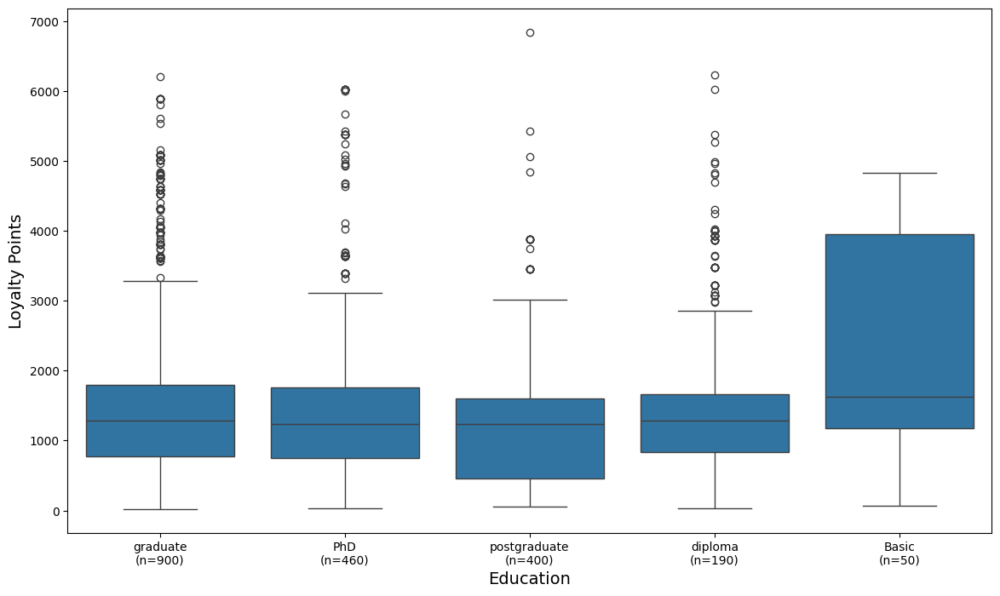

In [33]:
# Create a boxplot using Seaborn of education versus loyalty points. 
# Customers with basic education seem to have a corelation with the loyalty_points, but because of the previous finding we will not analyse further.
fig, ax = plt.subplots()
fig.set_size_inches(14, 8)
sns.boxplot(data=reviews_clean, x='education', y='loyalty_points')

# Add the count of observations for each education type to the x-axis labels.
edu_counts = reviews_clean['education'].value_counts()
labels = [f'{edu}\n(n={count})' for edu, count in zip(edu_counts.index, edu_counts.values)]
ax.set_xticklabels(labels)

# Set the x-axis label and adjust the font size.
ax.set_xlabel('Education', fontsize=14)
ax.set_ylabel('Loyalty Points', fontsize=14)

# Save the plot.
plt.savefig('Education')

# View the plot.
plt.show()

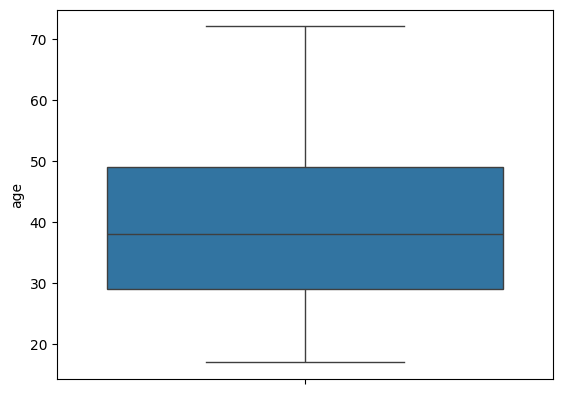

In [34]:
# Create a boxplot using Seaborn to check the age variable for outliers.
fig.set_size_inches(14, 8)
sns.boxplot(reviews_clean['age'])

# Set the x-axis label and adjust the font size.
ax.set_xlabel('Age', fontsize=14)

# View the plot.
plt.show()

* No outliers were detected.

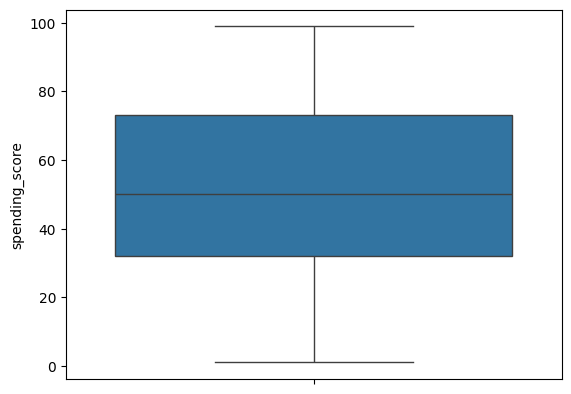

In [36]:
# Create a boxplot using Seaborn to check the spending score variable for outliers.
fig.set_size_inches(14, 8)
sns.boxplot(reviews_clean['spending_score'])

# Set the x-axis label and adjust the font size.
ax.set_xlabel('Spending Score', fontsize=14)

# View the plot.
plt.show()

* No outliers were detected.

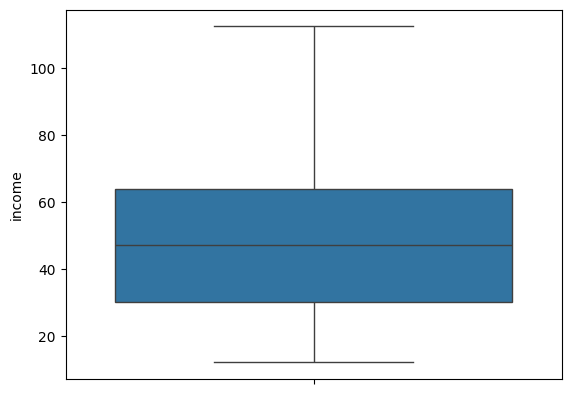

In [38]:
# Create a boxplot using Seaborn to check the income variable for outliers.
fig.set_size_inches(14, 8)
sns.boxplot(reviews_clean['income'])

# Set the x-axis label and adjust the font size.
ax.set_xlabel('Income', fontsize=14)

# View the plot.
plt.show()

* No outliers were detected.

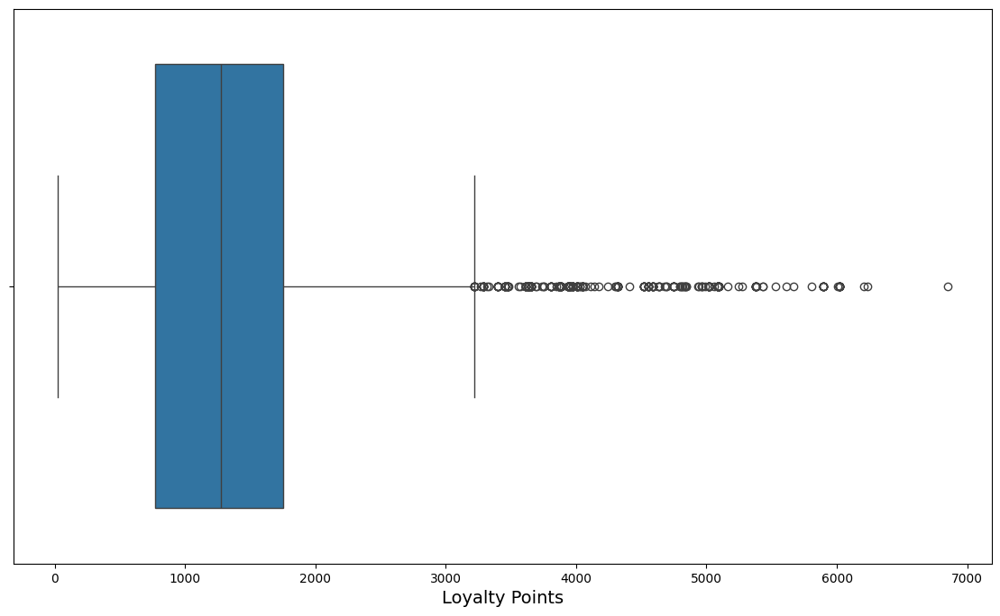

In [40]:
# Create a boxplot using Seaborn to check the loyalty_points variable for outliers.
fig, ax = plt.subplots(figsize=(14, 8))  # Wider plot for horizontal orientation for a better view

# Create the boxplot with loyalty points on the x-axis.
sns.boxplot(x=reviews_clean['loyalty_points'], ax=ax)

# Set the x-axis label and adjust the font size.
ax.set_xlabel('Loyalty Points', fontsize=14)

# Save the plot.
plt.savefig('Loyalty Outliers')

# View the plot.
plt.show()

* Loyalty points present several outliers on the right whisker, suggesting that some customers have significantly higher loyalty points compared to others (right skewed distribution). . Given the objective is to understand factor contributing to this variation outliers won't be removed.

* The correlation matrix for age and loyalty points does not appear to show a relationship. However, the Turtle Games marketing team would like to explore this variable further.

## 5. Linear regression

### 5a) spending vs loyalty

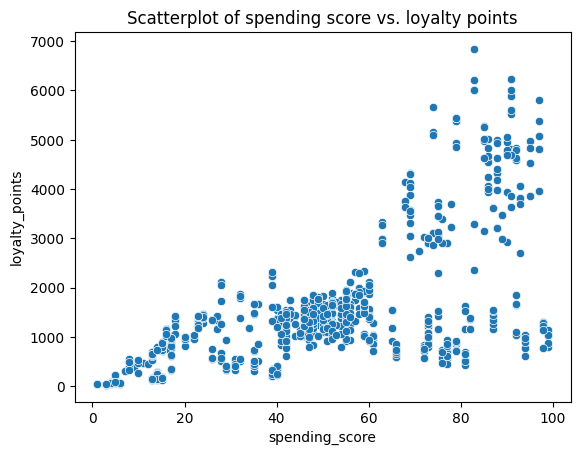

In [45]:
# Visualise relationship between spend and loyalty.
sns.scatterplot(data = reviews_clean, x = 'spending_score', y = 'loyalty_points');
plt.title("Scatterplot of spending score vs. loyalty points")
plt.show()

In [46]:
# Define independent variable.
x = reviews_clean['spending_score']  

# Define dependent variable.
y = reviews_clean['loyalty_points']  

# Create model and print summary of metrics.
f = 'y ~ x'
test1 = ols(f, data = reviews_clean).fit()
test1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.452
Model:                            OLS   Adj. R-squared:                  0.452
Method:                 Least Squares   F-statistic:                     1648.
Date:                Thu, 10 Apr 2025   Prob (F-statistic):          2.92e-263
Time:                        22:12:14   Log-Likelihood:                -16550.
No. Observations:                2000   AIC:                         3.310e+04
Df Residuals:                    1998   BIC:                         3.312e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    -75.0527     45.931     -1.634      0.102    -165.129      15.024
x             33.0617      0.814     40.595      0.000      31.464      34.659
==============================================================================
Omnibus:                      126.554   Durbin-Watson:                   1.191
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              260.528
Skew:                           0.422   Prob(JB):                     2.67e-57
Kurtosis:                       4.554   Cond. No.                         122.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

* R-squared = 0.452 – This means that about 45.2% of the variation in the dependent variable (loyalty_points) is explained by the independent variable (spending_score).
* Adj. R-squared = 0.452 – Since it's very close to the R-squared, it confirms that the model is not overfitting.
* The model is statistically significant.
* The independent variable x is a strong predictor (is significant because p<0.05).
* The R-squared value is decent for a single-variable model.
* The intercept is not statistically significant (p>0.05) — we might consider excluding it.
* Condition Number = 122 – Tests for multicollinearity(>30)

In [48]:
# Extract the estimated parameters.
print("Parameters: ", test1.params) 

# Extract the standard errors.
print("Standard Errors: ", test1.bse)

# Extract the predicted values.
print("Predicted values: ", test1.predict())  

Parameters:  Intercept   -75.052663
x            33.061693
dtype: float64
Standard Errors:  Intercept    45.930554
x             0.814419
dtype: float64
Predicted values:  [1214.35337415 2602.94449102  123.31749662 ... 2933.56142361  453.93442921
  189.44088314]


In [49]:
# Set the X coefficient and the constant to generate the regression table.
y_pred = 33.061693 * reviews_clean['spending_score'] - 75.052663

# View the output.
y_pred

0       1214.353364
1       2602.944470
2        123.317495
3       2470.697698
4       1247.415057
           ...     
1995    2206.204154
1996     189.440881
1997    2933.561400
1998     453.934425
1999     189.440881
Name: spending_score, Length: 2000, dtype: float64

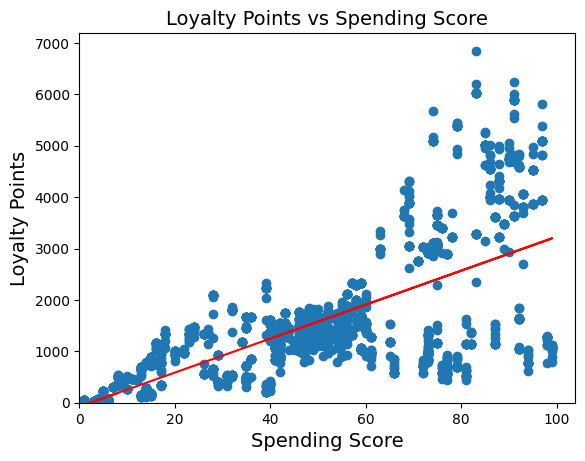

In [50]:
# Plot the graph with a regression line.
plt.scatter('spending_score', 'loyalty_points', data = reviews_clean)
x = reviews_clean['spending_score']

# Plot the regression line (in red).
plt.plot(x, y_pred, color='red')

plt.title("Loyalty Points vs Spending Score", fontsize=14)
plt.xlabel("Spending Score", fontsize=14)
plt.ylabel("Loyalty Points", fontsize=14)

# Set the x and y limits on the axes.
plt.xlim(0)
plt.ylim(0)

# Save the plot.
plt.savefig('Loyalty vs Spending scatter.png')

# View the plot.
plt.show()

* The scatterplot has a cone-like shape which is a sign of heteroscedasticity. We therefore reject the null hypothesis (which assumes homoscedasticity) and conclude that the data are heteroscedastic.

Text(0, 0.5, 'Residuals')

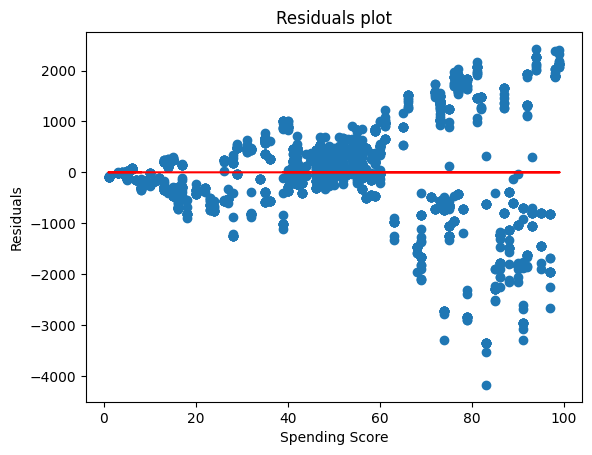

In [52]:
# Residuals are calcualted
residuals = test1.predict() - y  

# Plot the residuals=(y-predict - y-observe) versus the x-variables.
# Ideally, there should be no pattern in this plot
plt.scatter(x, residuals)
plt.plot(x, y - y, color='red')
plt.title("Residuals plot")
plt.xlabel("Spending Score")
plt.ylabel("Residuals")

* We need to apply a transformation (e.g., log or square root) to stabilize the variance because the residual variance increases with the predictor.

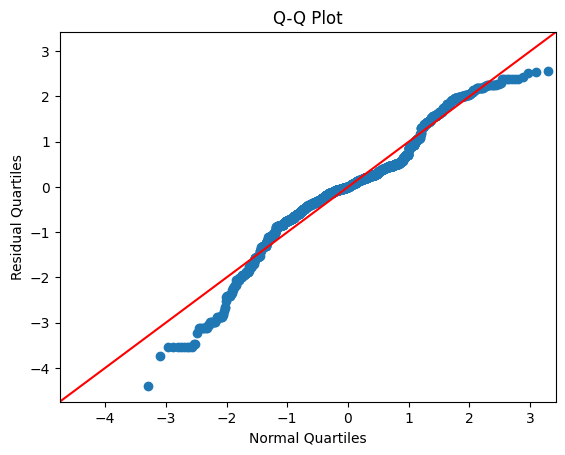

In [54]:
# Plot the quartiles of the residuals versus the quartiles of the N(0,1)
# The fit=True argument first Standardises the observed data (Residuals) before plotting them
plot_qq(residuals)

#### The Breusch-Pagan test function

In [56]:
# Run the Breusch-Pagan test function on the model residuals and x-variables.
test = het_breuschpagan(test1.resid, test1.model.exog)

# Print the results
terms = ['LM stat', 'LM Test p-value', 'F-stat', 'F-test p-value']
print(dict(zip(terms, test)))

{'LM stat': np.float64(629.9823360215914), 'LM Test p-value': np.float64(5.042699614941662e-139), 'F-stat': np.float64(918.7507142907737), 'F-test p-value': np.float64(2.303788792449355e-166)}


* LM stat is high value - strong evidence of heteroscedasticity
* LM Test p-value is extremely small - reject the null hypothesis of homoscedasticity
* F-stat is very large - confirms the presence of heteroscedasticity
* F-test p-value is	essentially zero - very strong evidence of heteroscedasticity
* We therefore reject the null hypothesis (which assumes homoscedasticity) and conclude that the data are heteroscedastic.

#### Limiting Spending_Score to <60 vs Loyalty Points

                            OLS Regression Results                            
Dep. Variable:         loyalty_points   R-squared:                       0.601
Model:                            OLS   Adj. R-squared:                  0.601
Method:                 Least Squares   F-statistic:                     2055.
Date:                Thu, 10 Apr 2025   Prob (F-statistic):          1.74e-274
Time:                        22:12:15   Log-Likelihood:                -10015.
No. Observations:                1367   AIC:                         2.003e+04
Df Residuals:                    1365   BIC:                         2.005e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const            157.8290     22.483      7.

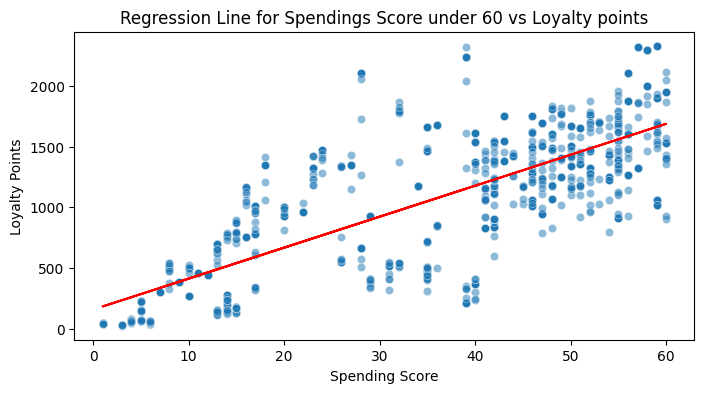

In [59]:
spending_below60 = reviews_clean[reviews_clean['spending_score']<= 60]

# Define independent and dependent variable 
x_sub1 = spending_below60['spending_score']
y_sub1 = spending_below60['loyalty_points']

# Run the OLS regression model 
lr_sub1 = sm.OLS(y_sub1, sm.add_constant(x_sub1)).fit()

# Print the regression results
print(lr_sub1.summary())

# Create a variable to store predicted loyalty points 
y_pred_lr1 = lr_sub1.predict(sm.add_constant(x_sub1))

# Set plot size 
plt.figure(figsize=(8, 4), dpi=100)

# Plot the graph with a regression line.
sns.scatterplot(data=spending_below60 , x= x_sub1, y= y_sub1, alpha=0.5)

# Set labels and title 
plt.title("Regression Line for Spendings Score under 60 vs Loyalty points")
plt.xlabel("Spending Score")
plt.ylabel("Loyalty Points")

# Add Regression line 
plt.plot(x_sub1, y_pred_lr1, color='red')

# Show the plot
plt.show()

The fit of the model has increased significanlty, and heteroskedasticity is not present.

#### Log transform the y variable to reduce heteroscedasticity

In [62]:
# Transform loyalty to natural log loyalty to remove uneven variance (heteroscedasicity)
reviews_clean['log_loyalty_points'] = np.log(reviews_clean['loyalty_points'])

# Visualise the new column
reviews_clean.head()

,gender,age,income,spending_score,loyalty_points,education,product,review,summary,log_loyalty_points
0,Male,18,12.30,39,210,graduate,453,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...,5.347108
1,Male,23,12.30,81,524,graduate,466,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...,6.261492
2,Female,22,13.12,6,40,graduate,254,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless",3.688879
3,Female,25,13.12,77,562,graduate,263,Amazing buy! Bought it as a gift for our new d...,Five Stars,6.331502
4,Female,33,13.94,40,366,graduate,291,As my review of GF9's previous screens these w...,Money trap,5.902633


<Axes: xlabel='spending_score', ylabel='log_loyalty_points'>

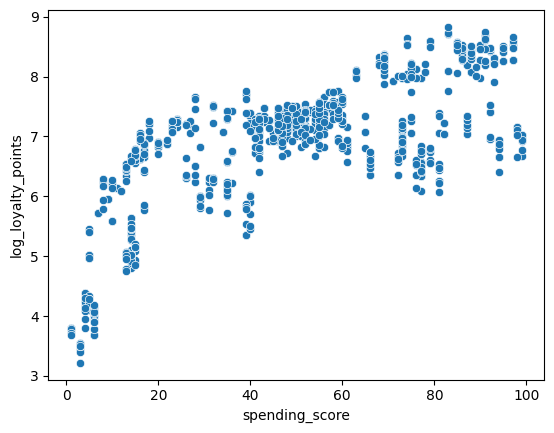

In [63]:
# Visualise relationship between spend and log_loyalty.
sns.scatterplot(data = reviews_clean, x = 'spending_score', y = 'log_loyalty_points')

In [64]:
# Define independent variable.
x = reviews_clean['spending_score']  

# Define dependent variable.
y1 = reviews_clean['log_loyalty_points'] 
f = 'y1 ~ x'
# Fit another model to predict the transformed log_loyalty_points.
test2 = ols(f, data = reviews_clean).fit()
test2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                     y1   R-squared:                       0.519
Model:                            OLS   Adj. R-squared:                  0.518
Method:                 Least Squares   F-statistic:                     2153.
Date:                Thu, 10 Apr 2025   Prob (F-statistic):          1.44e-319
Time:                        22:12:15   Log-Likelihood:                -2146.7
No. Observations:                2000   AIC:                             4297.
Df Residuals:                    1998   BIC:                             4309.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      5.5740      0.034    162.833      0.000       5.507       5.641
x              0.0282      0.001     46.400      0.000       0.027       0.029
==============================================================================
Omnibus:                      247.764   Durbin-Watson:                   0.562
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              344.804
Skew:                          -1.000   Prob(JB):                     1.34e-75
Kurtosis:                       3.366   Cond. No.                         122.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

* After log transformation, the model explains 51.9% of the variation (vs. 45.2% before).
* The increase in R-squared suggests that the log transformation improved the model’s explanatory power.
* The intercept is now statistically significant
* The coefficient for spending_score is now smaller because of the log scale, but p<0.05 so it remains highly significant.


Text(0, 0.5, 'Residuals')

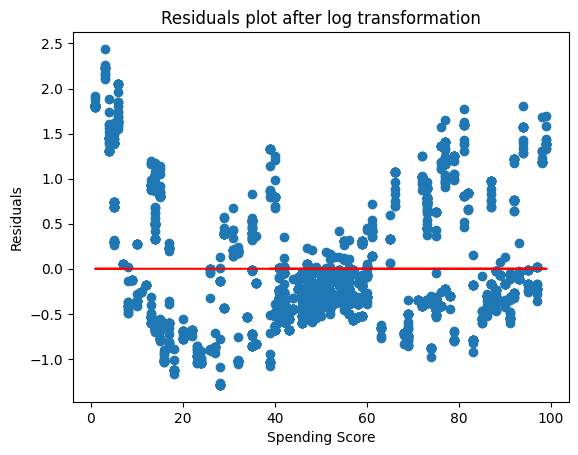

In [66]:
# Residuals are calcualted
residuals2 = test2.predict() - y1  

# Plot the residuals=(y-predict - y-observe) versus the x-variables.
# Ideally, there should be no pattern in this plot
plt.scatter(x, residuals2)
plt.plot(x, y1 - y1, color='red')
plt.title("Residuals plot after log transformation")
plt.xlabel("Spending Score")
plt.ylabel("Residuals")

* The residuals are evenly scattered around the zero line (the model is not systematically over- or under-predicting)
* Reduced spread suggests that the log transformation helped reduce heteroscedasticity.

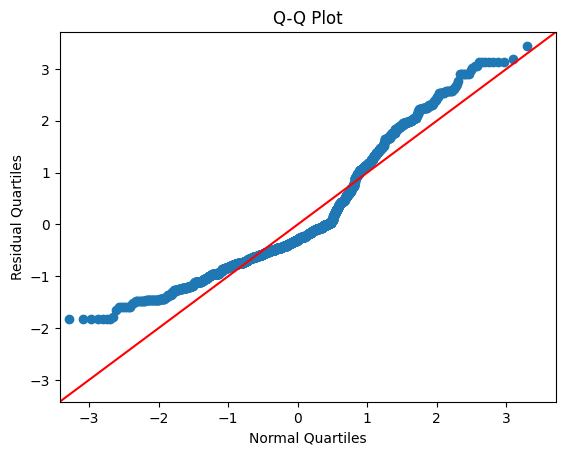

In [68]:
# Plot the quartiles of the residuals versus the quartiles of the N(0,1)
# The fit=True argument first Standardises the observed data (Residuals) before plotting them
plot_qq(residuals2)

In [69]:
# Extract the estimated parameters.
print("Parameters: ", test2.params) 

# Extract the standard errors.
print("Standard Errors: ", test2.bse)

# Extract the predicted values.
print("Predicted values: ", test2.predict())  

Parameters:  Intercept    5.573981
x            0.028163
dtype: float64
Standard Errors:  Intercept    0.034231
x            0.000607
dtype: float64
Predicted values:  [6.67235588 7.85522067 5.74296212 ... 8.13685514 6.02459659 5.79928901]


In [70]:
# Set the X coefficient and the constant to generate the regression table.
y_pred2 = (5.573981) + 0.028163 * reviews_clean['spending_score']

# View the output.
y_pred2

0       6.672338
1       7.855184
2       5.742959
3       7.742532
4       6.700501
          ...   
1995    7.517228
1996    5.799285
1997    8.136814
1998    6.024589
1999    5.799285
Name: spending_score, Length: 2000, dtype: float64

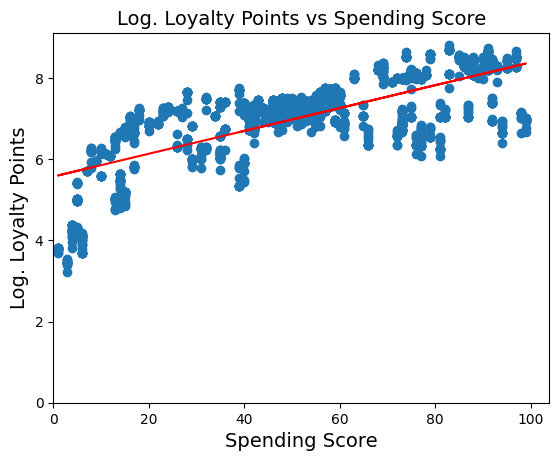

In [71]:
# Plot the graph with a regression line.
plt.scatter('spending_score', 'log_loyalty_points', data = reviews_clean)
x = reviews_clean['spending_score']

# Plot the regression line (in red).
plt.plot(x, y_pred2, color='red')

plt.title("Log. Loyalty Points vs Spending Score", fontsize=14)
plt.xlabel("Spending Score", fontsize=14)
plt.ylabel("Log. Loyalty Points", fontsize=14)

# Set the x and y limits on the axes.
plt.xlim(0)
plt.ylim(0)

# Save the plot.
plt.savefig('Log. Loyalty vs Spending scatter.png')

# View the plot.
plt.show()

#### The Breusch-Pagan test function for the transformed data

In [73]:
# Run the Breusch-Pagan test function on the model residuals and x-variables.
test_log = het_breuschpagan(test2.resid, test2.model.exog)

# Print the results
terms_log = ['LM stat', 'LM Test p-value', 'F-stat', 'F-test p-value']
print(dict(zip(terms_log, test_log)))

{'LM stat': np.float64(92.4511694198562), 'LM Test p-value': np.float64(6.900660585127568e-22), 'F-stat': np.float64(96.83497142492256), 'F-test p-value': np.float64(2.4043577159770164e-22)}


* P-values are still very low, suggesting that heteroscedasticity hasn't been fully eliminated.
* The F-statistic also dropped sharply, indicating that variance in the residuals is now more stable.

### 5b) renumeration vs loyalty

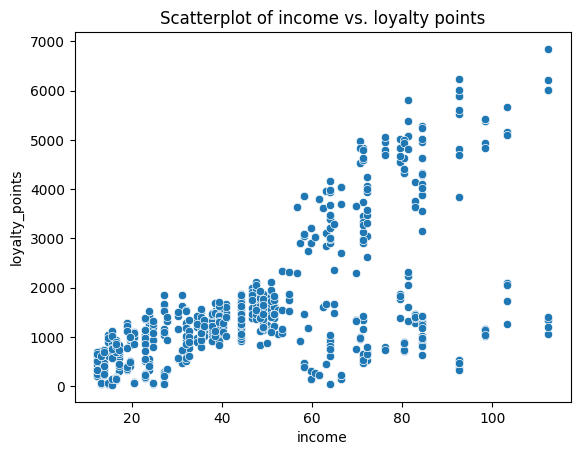

In [76]:
# Visualise relationship between spend and loyalty.
sns.scatterplot(data = reviews_clean, x = 'income', y = 'loyalty_points');
plt.title("Scatterplot of income vs. loyalty points")
plt.show()

In [77]:
# Define independent variable.
x = reviews_clean['income']  

# Define dependent variable.
y = reviews_clean['loyalty_points']  

# Create model and print summary of metrics.
f = 'y ~ x'
test3 = ols(f, data = reviews_clean).fit()
test3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.380
Model:                            OLS   Adj. R-squared:                  0.379
Method:                 Least Squares   F-statistic:                     1222.
Date:                Thu, 10 Apr 2025   Prob (F-statistic):          2.43e-209
Time:                        22:12:16   Log-Likelihood:                -16674.
No. Observations:                2000   AIC:                         3.335e+04
Df Residuals:                    1998   BIC:                         3.336e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    -65.6865     52.171     -1.259      0.208    -168.001      36.628
x             34.1878      0.978     34.960      0.000      32.270      36.106
==============================================================================
Omnibus:                       21.285   Durbin-Watson:                   3.622
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               31.715
Skew:                           0.089   Prob(JB):                     1.30e-07
Kurtosis:                       3.590   Cond. No.                         123.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

* R-squared = 0.380 – This means that about 38% of the variation in the dependent variable (loyalty_points) is explained by the independent variable (income).
* Adj. R-squared = 0.379 – Since it's very close to the R-squared, it confirms that the model is not overfitting.
* The model is statistically significant.
* The independent variable x is a strong predictor (is significant because p<0.05).
* The R-squared value is decent for a single-variable model.
* The intercept is not statistically significant (p>0.05) — we might consider excluding it.
* Condition Number = 123 – Tests for multicollinearity(>30)

In [79]:
# Extract the estimated parameters.
print("Parameters: ", test3.params) 

# Extract the standard errors.
print("Standard Errors: ", test3.bse)

# Extract the predicted values.
print("Predicted values: ", test3.predict())  

Parameters:  Intercept   -65.686513
x            34.187825
dtype: float64
Standard Errors:  Intercept    52.170717
x             0.977925
dtype: float64
Predicted values:  [ 354.82374068  354.82374068  382.85775758 ... 3102.15739671 3298.39551499
 3102.15739671]


In [80]:
# Set the X coefficient and the constant to generate the regression table.
y_pred3 = 34.187825 * reviews_clean['income'] - 65.686513

# View the output.
y_pred3

0        354.823735
1        354.823735
2        382.857751
3        382.857751
4        410.891767
           ...     
1995    2821.817186
1996    3102.157351
1997    3102.157351
1998    3298.395467
1999    3102.157351
Name: income, Length: 2000, dtype: float64

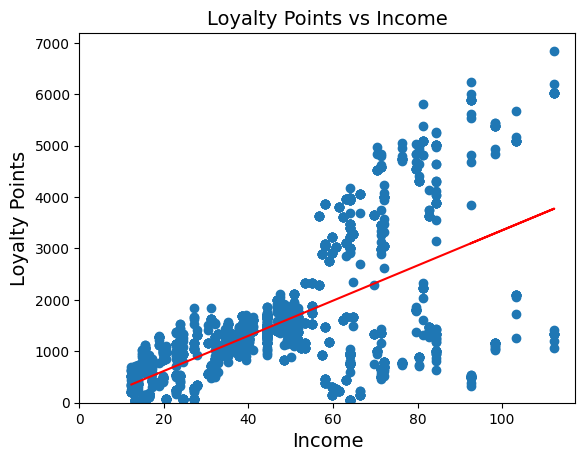

In [81]:
# Plot graph with regression line.
plt.scatter('income', 'loyalty_points', data = reviews_clean)
x = reviews_clean['income']

# Plot the regression line (in red).
plt.plot(x, y_pred3, color='red')

plt.title("Loyalty Points vs Income", fontsize=14)
plt.xlabel("Income", fontsize=14)
plt.ylabel("Loyalty Points", fontsize=14)

# Set the x and y limits on the axes.
plt.xlim(0)
plt.ylim(0)

# Save the plot.
plt.savefig('Loyalty vs Income.png')

# View the plot.
plt.show()

* The scatterplot has a cone-like shape which is a sign of heteroscedasticity. We therefore reject the null hypothesis (which assumes homoscedasticity) and conclude that the data are heteroscedastic.

Text(0, 0.5, 'Residuals')

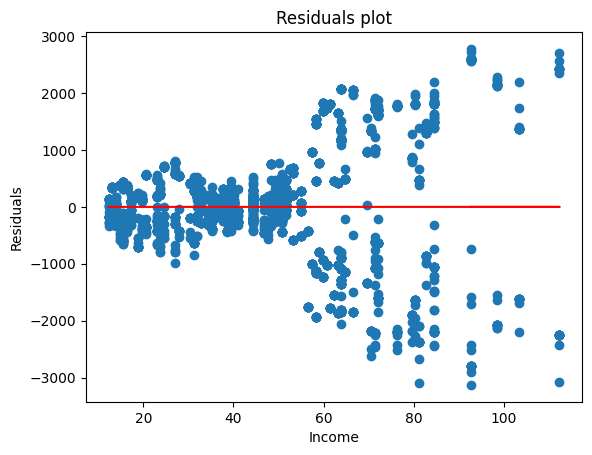

In [83]:
# Residuals are calcualted
residuals3 = test3.predict() - y  

# Plot the residuals=(y-predict - y-observe) versus the x-variables.
# Ideally, there should be no pattern in this plot
plt.scatter(x, residuals3)
plt.plot(x, y - y, color='red')
plt.title("Residuals plot")
plt.xlabel("Income")
plt.ylabel("Residuals")

* We need to apply a transformation (e.g., log or square root) to stabilize the variance because the residual variance increases with the predictor.

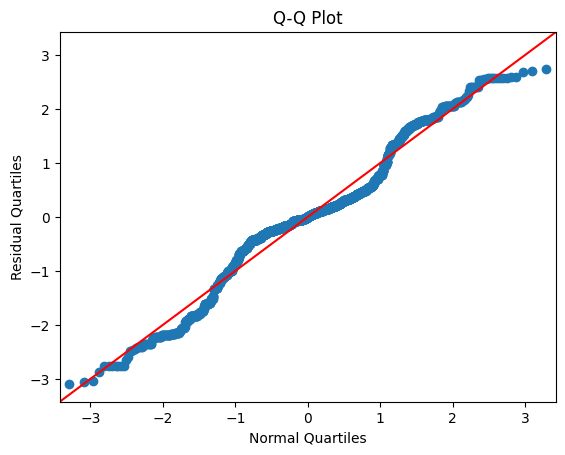

In [85]:
# Plot the quartiles of the residuals versus the quartiles of the N(0,1)
# The fit=True argument first Standardises the observed data (Residuals) before plotting them
plot_qq(residuals3)

#### The Breusch-Pagan test function

In [87]:
# Run the Breusch-Pagan test function on the model residuals and x-variables.
test_log3 = het_breuschpagan(test3.resid, test3.model.exog)

# Print the results
terms3 = ['LM stat', 'LM Test p-value', 'F-stat', 'F-test p-value']
print(dict(zip(terms3, test_log3)))

{'LM stat': np.float64(1038.6445487288279), 'LM Test p-value': np.float64(7.153051772823832e-228), 'F-stat': np.float64(2158.6311344219316), 'F-test p-value': np.float64(3.68e-320)}


* LM stat is extremely high - strong evidence of heteroscedasticity
* LM Test p-value is esentially 0 -  heteroscedasticity is statistically significant
* F-stat is huge — confirms instability in the variance
* F-test p-value is	almost zero — heteroscedasticity is real and severe
* We therefore reject the null hypothesis (which assumes homoscedasticity) and conclude that the data are heteroscedastic.

#### Limiting Income to <55k vs Loyalty Points

                            OLS Regression Results                            
Dep. Variable:         loyalty_points   R-squared:                       0.626
Model:                            OLS   Adj. R-squared:                  0.626
Method:                 Least Squares   F-statistic:                     2153.
Date:                Thu, 10 Apr 2025   Prob (F-statistic):          8.88e-277
Time:                        22:12:17   Log-Likelihood:                -9273.3
No. Observations:                1286   AIC:                         1.855e+04
Df Residuals:                    1284   BIC:                         1.856e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -15.5503     25.333     -0.614      0.5

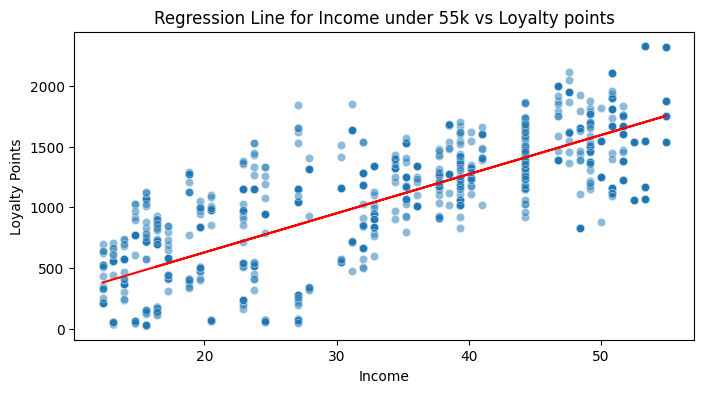

In [90]:
income_below55 = reviews_clean[reviews_clean['income']<= 55]

# Define independent and dependent variable 
x_sub2 = income_below55['income']
y_sub2 = income_below55['loyalty_points']

# Run the OLS regression model 
lr_sub2 = sm.OLS(y_sub2, sm.add_constant(x_sub2)).fit()

# Print the regression results
print(lr_sub2.summary())

# Create a variable to store predicted loyalty points 
y_pred_lr2 = lr_sub2.predict(sm.add_constant(x_sub2))

# Set plot size 
plt.figure(figsize=(8, 4), dpi=100)

# Plot the graph with a regression line.
sns.scatterplot(data=income_below55 , x= x_sub2, y= y_sub2, alpha=0.5)

# Set labels and title 
plt.title("Regression Line for Income under 55k vs Loyalty points")
plt.xlabel("Income")
plt.ylabel("Loyalty Points")

# Add Regression line 
plt.plot(x_sub2, y_pred_lr2, color='red')

# Show the plot
plt.show()

* The model fit this subset best, indicating a stronger linear relationship between income and loyalty points within this group.

#### Log transform the y variable to reduce heteroscedasticity

<Axes: xlabel='income', ylabel='log_loyalty_points'>

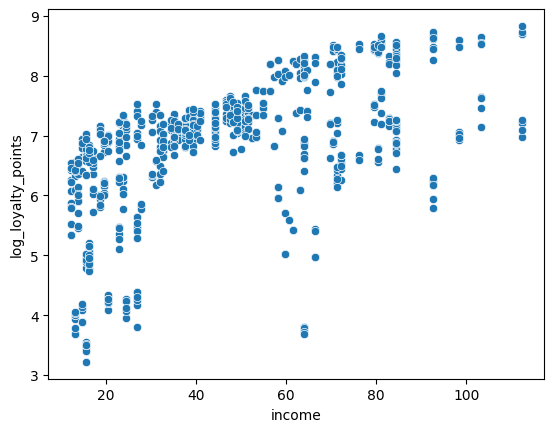

In [93]:
# Visualise relationship between spend and log_loyalty.
sns.scatterplot(data = reviews_clean, x = 'income', y = 'log_loyalty_points')

In [94]:
# Define independent variable.
x = reviews_clean['income']  

# Define dependent variable.
y1 = reviews_clean['log_loyalty_points'] 
f = 'y1 ~ x'

# Fit another model to predict the transformed log_loyalty_points.
test4 = ols(f, data = reviews_clean).fit()
test4.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                     y1   R-squared:                       0.284
Model:                            OLS   Adj. R-squared:                  0.284
Method:                 Least Squares   F-statistic:                     794.3
Date:                Thu, 10 Apr 2025   Prob (F-statistic):          1.98e-147
Time:                        22:12:18   Log-Likelihood:                -2543.1
No. Observations:                2000   AIC:                             5090.
Df Residuals:                    1998   BIC:                             5101.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      5.8505      0.045    131.318      0.000       5.763       5.938
x              0.0235      0.001     28.184      0.000       0.022       0.025
==============================================================================
Omnibus:                      610.463   Durbin-Watson:                   2.844
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1512.287
Skew:                          -1.669   Prob(JB):                         0.00
Kurtosis:                       5.647   Cond. No.                         123.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

* R-squared = 0.284 – This means that about 28.4% of the variation in the dependent variable (loyalty_points) is explained by the independent variable (income).
* Adj. R-squared = 0.284 – Since it's equal to the R-squared, it confirms that the model is not overfitting.
* The model is statistically significant.
* The independent variable x and the interceptor are trong predictors (significant because p<0.05).
* The R-squared value is small, suggesting that the model might not be the best for predicting loyalty_points.
* Condition Number = 123 – Tests for multicollinearity(>30)
* x coef shows that a 1-unit increase in income increases loyalty points by 2.35%

Text(0, 0.5, 'Residuals')

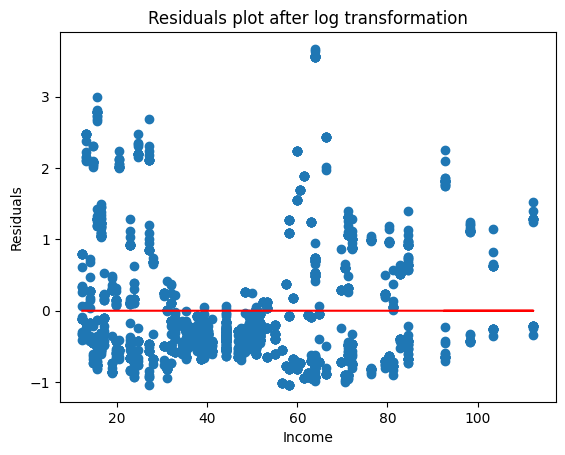

In [96]:
# Residuals are calcualted
residuals4 = test4.predict() - y1  

# Plot the residuals=(y-predict - y-observe) versus the x-variables.
# Ideally, there should be no pattern in this plot
plt.scatter(x, residuals4)
plt.plot(x, y1 - y1, color='red')
plt.title("Residuals plot after log transformation")
plt.xlabel("Income")
plt.ylabel("Residuals")

* Reduced heteroscedasticity
* More consistent variance
* Better fit overall, but some nonlinearity and outliers remain

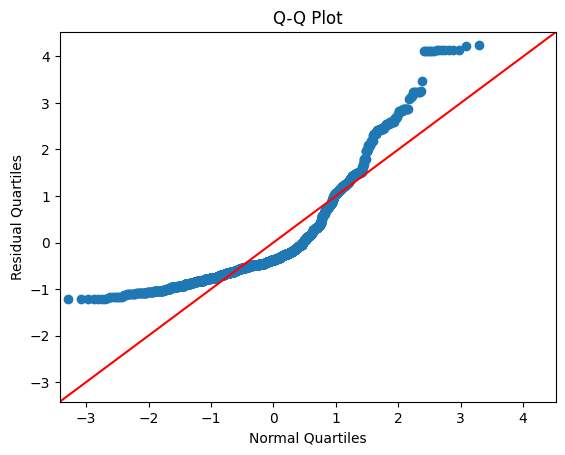

In [98]:
# Plot the quartiles of the residuals versus the quartiles of the N(0,1)
# The fit=True argument first Standardises the observed data (Residuals) before plotting them
plot_qq(residuals4)

In [99]:
# Extract the estimated parameters.
print("Parameters: ", test4.params) 

# Extract the standard errors.
print("Standard Errors: ", test4.bse)

# Extract the predicted values.
print("Predicted values: ", test4.predict())  

Parameters:  Intercept    5.850516
x            0.023537
dtype: float64
Standard Errors:  Intercept    0.044552
x            0.000835
dtype: float64
Predicted values:  [6.14002166 6.14002166 6.15932201 ... 8.0314559  8.16655834 8.0314559 ]


In [100]:
# Set the X coefficient and the constant to generate the regression table.
y_pred4 = (5.850516) + 0.023537 * reviews_clean['income']

# View the output.
y_pred4

0       6.140021
1       6.140021
2       6.159321
3       6.159321
4       6.178622
          ...   
1995    7.838451
1996    8.031454
1997    8.031454
1998    8.166557
1999    8.031454
Name: income, Length: 2000, dtype: float64

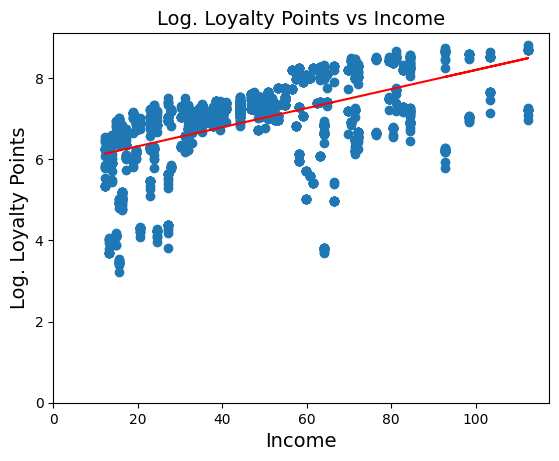

In [101]:
# Plot the graph with a regression line.
plt.scatter('income', 'log_loyalty_points', data = reviews_clean)
x = reviews_clean['income']

# Plot the regression line (in red).
plt.plot(x, y_pred4, color='red')

plt.title("Log. Loyalty Points vs Income", fontsize=14)
plt.xlabel("Income", fontsize=14)
plt.ylabel("Log. Loyalty Points", fontsize=14)

# Set the x and y limits on the axes.
plt.xlim(0)
plt.ylim(0)

# Save the plot.
plt.savefig('Log. Loyalty vs Income.png')

# View the plot.
plt.show()

* The plot shows a clear positive relationship between income and log loyalty points.
* The spread of data points around the red line looks more uniform compared to the original (pre-log) model.
* This suggests that the log transformation has helped in reducing heteroscedasticity — consistent with the Breusch-Pagan test result showing no significant variance pattern.

#### The Breusch-Pagan test function on the transformed data

In [104]:
# Run the Breusch-Pagan test function on the model residuals and x-variables.
test_log4 = het_breuschpagan(test4.resid, test4.model.exog)

# Print the results
terms4 = ['LM stat', 'LM Test p-value', 'F-stat', 'F-test p-value']
print(dict(zip(terms4, test_log4)))

{'LM stat': np.float64(0.04764626018327611), 'LM Test p-value': np.float64(0.8272107748018158), 'F-stat': np.float64(0.04759974789814679), 'F-test p-value': np.float64(0.8273160836310481)}


* The test confirms that the variance of the residuals is now stable.
* No evidence of heteroscedasticity after the log transformation.
* Major improvement over the initial model (where heteroscedasticity was significant).



### 5c) age vs loyalty

<Axes: xlabel='age', ylabel='loyalty_points'>

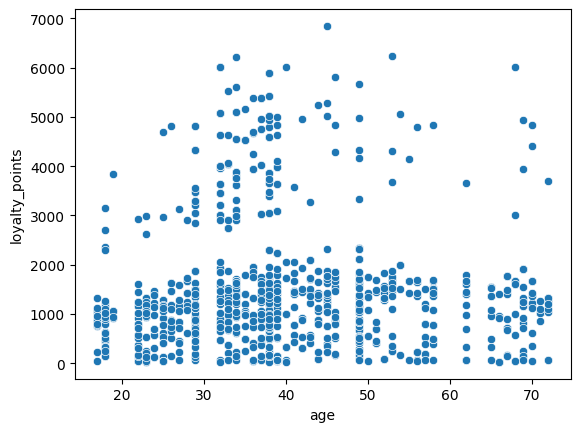

In [107]:
# Visualise relationship between age and loyalty_points.
sns.scatterplot(data = reviews_clean, x = 'age', y = 'loyalty_points')

In [108]:
# Define independent variable.
x = reviews_clean['age']  

# Define dependent variable.
y = reviews_clean['loyalty_points']  

# Create model and print summary of metrics.
f = 'y ~ x'
test5 = ols(f, data = reviews_clean).fit()
test5.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     3.606
Date:                Thu, 10 Apr 2025   Prob (F-statistic):             0.0577
Time:                        22:12:19   Log-Likelihood:                -17150.
No. Observations:                2000   AIC:                         3.430e+04
Df Residuals:                    1998   BIC:                         3.431e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1736.5177     88.249     19.678      0.000    1563.449    1909.587
x             -4.0128      2.113     -1.899      0.058      -8.157       0.131
==============================================================================
Omnibus:                      481.477   Durbin-Watson:                   2.277
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              937.734
Skew:                           1.449   Prob(JB):                    2.36e-204
Kurtosis:                       4.688   Cond. No.                         129.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

* Only 0.2% of the variance in loyalty points is explained by age. This is very low, indicating that age has almost no explanatory power for predicting loyalty points.
* Adjusted R-squared is also very low, confirming that adding more variables would likely not improve the model's predictive ability.
* p-value for is slightly above the typical significance threshold of 0.05, so the relationship is not statistically significant at the 5% level (though it's borderline).
* F-statistic = 3.606, with a p-value of 0.0577 shows that the overall model is not statistically significant at the 5% level, but it's close.
  
* The model has very poor explanatory power and lacks statistical significance, suggesting that age is not a meaningful predictor of loyalty points.
* Checking residuals could help diagnose other issues (e.g., heteroscedasticity), but based on the weak relationship, a different modeling approach might be more useful.

In [110]:
# Extract the estimated parameters.
print("Parameters: ", test5.params) 

# Extract the standard errors.
print("Standard Errors: ", test5.bse)

# Extract the predicted values.
print("Predicted values: ", test5.predict())  

Parameters:  Intercept    1736.517739
x              -4.012805
dtype: float64
Standard Errors:  Intercept    88.248731
x             2.113177
dtype: float64
Predicted values:  [1664.2872467  1644.22322095 1648.2360261  ... 1600.0823643  1600.0823643
 1608.1079746 ]


In [111]:
# Set the X coefficient and the constant to generate the regression table.
y_pred5 =  1736.51773 + (-4.012805)* reviews_clean['age']

# View the output.
y_pred5

0       1664.287240
1       1644.223215
2       1648.236020
3       1636.197605
4       1604.095165
           ...     
1995    1588.043945
1996    1563.967115
1997    1600.082360
1998    1600.082360
1999    1608.107970
Name: age, Length: 2000, dtype: float64

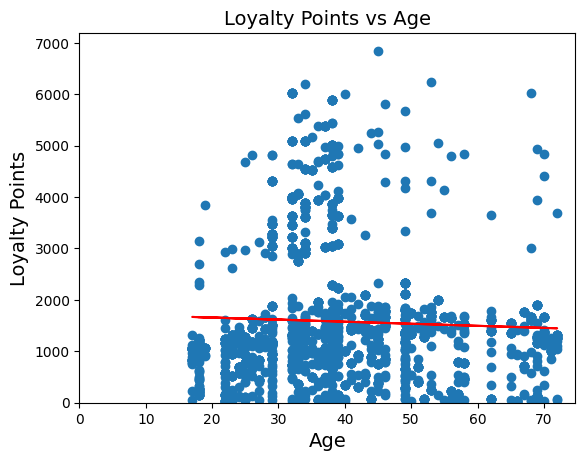

In [112]:
# Plot graph with regression line.
plt.scatter('age', 'loyalty_points', data = reviews_clean)
x = reviews_clean['age']

# Plot the regression line (in red).
plt.plot(x, y_pred5, color='red')

plt.title("Loyalty Points vs Age", fontsize=14)
plt.xlabel("Age", fontsize=14)
plt.ylabel("Loyalty Points", fontsize=14)

# Set the x and y limits on the axes.
plt.xlim(0)
plt.ylim(0)

# Save the plot.
plt.savefig('Loyalty vs Age.png')

# View the plot.
plt.show()

* The scatter plot shows no clear linear pattern between age and loyalty points.
* The low R-squared and the non-significant F-statistic already suggest that a linear model is probably not suitable for this data.

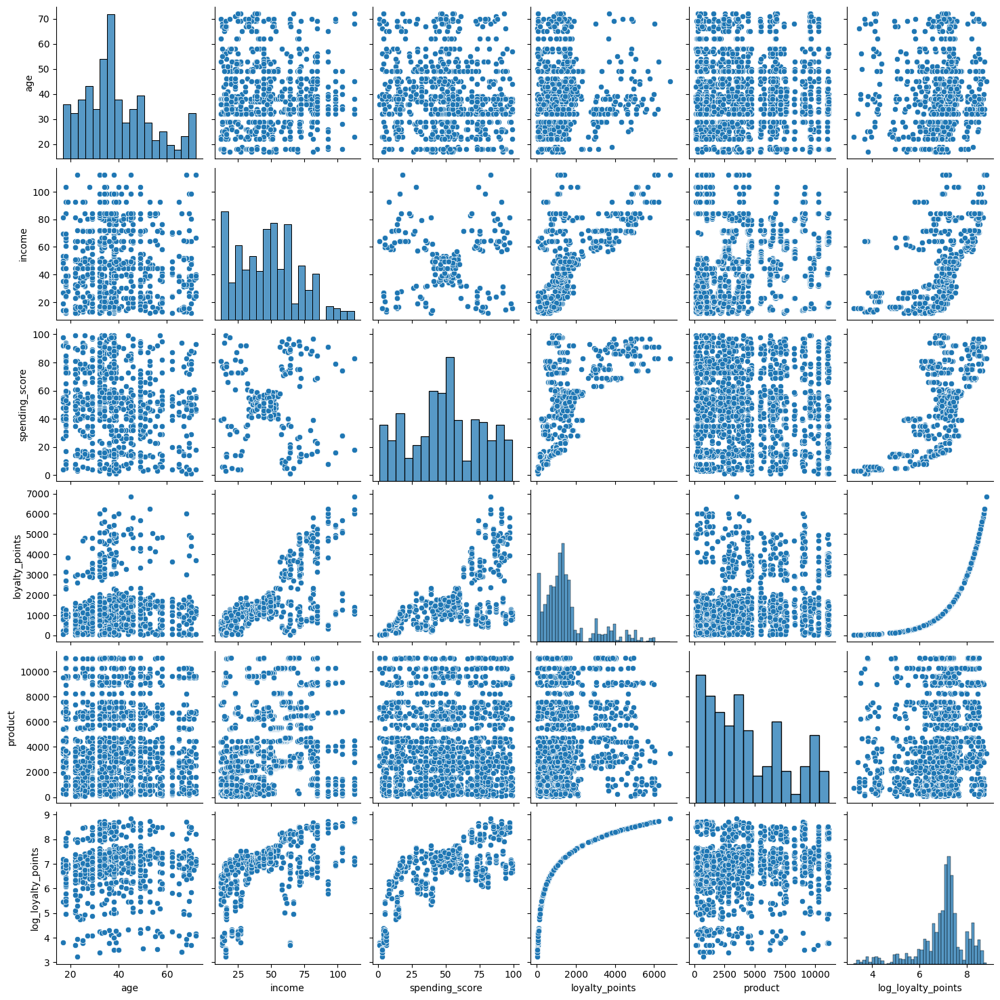

In [114]:
# Plot the scatter plots to see if there might be a linear relation between any other variable and loyalty points.
sns.pairplot(reviews_clean)

## 6. Observations and insights

***Your observations here...***






* There is a significant linear relationship between spending score and loyalty points although it should be noted that loyalty points are awarded based only in part on the amount a customer spends, so there is a connection between these two variables.
* There is a significant linear relationship between income and loyalty points.
* In both of the above cases, there is significant heteroscedasicity in the relationships (uneven variance) and is detected using the Breusch-Pagan test.
* The detrimental effects of this on a linear regression are mitigated by transforming loyalty using its natural logarithm. This makes the variance more even and makes the linear regression more robust.
* Income and spending score do not appear to be correlated, which reduces the chance of multiple colinearity affecting a multiple regression model with these two variables as predictors of loyalty.
* There is no significant linear relationship between age and loyalty points, and the OLS model fitted only explains 0.2% of the variance.
* The others pairs of numerical variables did not have linear regression models fitted as the scatterplots show no signs of a linear relationship.

#### Multiple Linear Regression Model

* The next step is to conduct a multiple linear regression using spending score and income as predictors of loyalty points.

In [120]:
# Define the dependent variable.
y = reviews_clean['loyalty_points'] 

# Define the independent variable.
X = reviews_clean[['spending_score', 'income']] 

In [121]:
# Specify the model.
multi = LinearRegression()  

# Fit the model.
multi.fit(X, y)

LinearRegression()

In [122]:
# Call the predictions for X (array).
multi.predict(X)

array([ 4.57831319e-01,  1.38195101e+03, -1.05713790e+03, ...,
        4.44147048e+03,  2.16956070e+03,  1.71137682e+03], shape=(2000,))

In [123]:
# Checking the value of R-squared, intercept and coefficients.
print("R-squared: ", multi.score(X, y))
print("Intercept: ", multi.intercept_)
print("Coefficients:")

list(zip(X, multi.coef_))

R-squared:  0.8269134701989259
Intercept:  -1700.3050970144366
Coefficients:


[('spending_score', np.float64(32.89269468782095)),
 ('income', np.float64(33.97949882180286))]

* The model explains 82.7% of the variance in loyalty points, which indicates a very strong fit.
* Both spending score and income have a strong, positive, and statistically significant relationship with loyalty points.

In [125]:
# Create train and test data sets.
x_train, x_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.2,
                                                    random_state=42)

In [126]:
# Training the model using the 'statsmodel' OLS library.
# Fit the model with the added constant.
model6 = sm.OLS(y_train, sm.add_constant(x_train)).fit()

# Set the predicted response vector.
y_pred6 = model6.predict(sm.add_constant(x_test)) 

# Call a summary of the model.
print_model = model6.summary()

# Print the summary.
print(print_model)  

                            OLS Regression Results                            
Dep. Variable:         loyalty_points   R-squared:                       0.830
Model:                            OLS   Adj. R-squared:                  0.830
Method:                 Least Squares   F-statistic:                     3895.
Date:                Thu, 10 Apr 2025   Prob (F-statistic):               0.00
Time:                        22:12:25   Log-Likelihood:                -12307.
No. Observations:                1600   AIC:                         2.462e+04
Df Residuals:                    1597   BIC:                         2.464e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const          -1700.3237     39.588    -42.

* R-squared = 0.830 indicates that the model explains 83% of the variance in loyalty points, which indicates a very strong fit.
* Adj. R-squared is essentially the same, confirming that the model is not overfitting despite including two predictors.
* P-values for all coefficients are 0 indicating that all predictors are statistically significant
* For every 1-unit increase in spending score, loyalty points increase by 32.64 (highly significant).
* For every 1-unit increase in income, loyalty points increase by 34.33 (also highly significant).
* F-statistic = 3895 with a p-value = 0.00 indicates that the overall model is highly significant, suggesting a very strong relationship between the predictors and loyalty points.

In [128]:
print(multi.score(x_train, y_train)*100)

82.9782305142594


In [129]:
# Run regression on the train subset.
mlr = LinearRegression()  

mlr.fit(x_train, y_train)

LinearRegression()

In [130]:
# Call the predictions for X in the train set.
y_pred_mlr = mlr.predict(x_train)  

# Print the predictions.
print("Prediction for test set: {}".format(y_pred_mlr)) 

Prediction for test set: [1630.49111009  512.07788432 2146.32624449 ... 1422.83416662 1259.61480693
 1441.17214231]


In [131]:
# Print the R-squared value.
print(mlr.score(x_test, y_test)*100)  

81.44236432529975


* The model explains 81% of the variance. This suggests that spending score and income are both strong predictors of loyalty points.

In [133]:
# Check for multicollinearity.
x_temp = sm.add_constant(x_train)

# Create an empty DataFrame. 
vif = pd.DataFrame()

# Calculate the VIF for each value.
vif['VIF Factor'] = [variance_inflation_factor(x_temp.values,
                                               i) for i in range(x_temp.values.shape[1])]

# Create the feature columns.
vif['features'] = x_temp.columns

# Print the values to one decimal points.
print(vif.round(1))

   VIF Factor        features
0         8.9           const
1         1.0  spending_score
2         1.0          income


* A VIF above 5–10 suggests moderate to high multicollinearity for the intercept term. However, this is not usually a major concern for the constant term.
* VIF = 1 means no multicollinearity for spending score or income. 
* Conclusion: There is no significant multicollinearity between the predictors (spending score and income), so the model coefficients are reliable.

In [135]:
# Determine heteroscedasticity.
f = 'y ~ X'
test = ols(f, data = reviews_clean).fit()

# Run the Breusch-Pagan test function.
test = het_breuschpagan(test.resid, test.model.exog)

# Print the results.
terms = ['LM stat', 'LM Test p-value', 'F-stat', 'F-test p-value']
print(dict(zip(terms, test)))

{'LM stat': np.float64(53.72656673046894), 'LM Test p-value': np.float64(2.1548858465067306e-12), 'F-stat': np.float64(27.563432744521236), 'F-test p-value': np.float64(1.554526362974112e-12)}


* LM stat = 53.73 (>30)  - There is significant evidence of heteroscedasticity (uneven variance in the residuals).
* LM Test p-value = 2.15e-12 - This p-value is extremely small (much less than 0.05), indicating that the test is highly significant.
* F-test p-value = 1.55e-12 → This very small value also indicates that the heteroscedasticity is statistically significant.
* Heteroscedasticity is present and could affect the reliability of standard errors and confidence intervals.
* A possible fix: Try log transformation of the dependent variable (loyalty points)

In [137]:
print(y_test.shape, y_pred6.shape)

(400,) (400,)


In [138]:
# Evaluate the model
# Call the metrics.mean_absolute_error function.  
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred6))  

# Call the metrics.mean_squared_error function.
print('Mean Square Error:', metrics.mean_squared_error(y_test, y_pred6))  

Mean Absolute Error: 429.6636201690913
Mean Square Error: 300944.0917834269


* The model is making moderate prediction errors based on the MAE.
* The high MSE suggests that there may be some large outliers or that the model’s variance is high.

#### Multiple Linear Regression Model on the transformed data (log_loyalty_points)

In [141]:
# Define the dependent variable.
y = reviews_clean['log_loyalty_points'] 

# Define the independent variable.
X = reviews_clean[['spending_score', 'income']] 

In [142]:
# Specify the model.
multi = LinearRegression()  

# Fit the model.
multi.fit(X, y)

LinearRegression()

In [143]:
# Call the predictions for X (array).
multi.predict(X)

array([5.83785743, 7.0158427 , 4.93145226, ..., 9.17347463, 7.2040123 ,
       6.84555135], shape=(2000,))

In [144]:
# Checking the value of R-squared, intercept and coefficients.
print("R-squared: ", multi.score(X, y))
print("Intercept: ", multi.intercept_)
print("Coefficients:")

list(zip(X, multi.coef_))

R-squared:  0.7988505988825917
Intercept:  4.456693665767277
Coefficients:


[('spending_score', np.float64(0.028047268432936808)),
 ('income', np.float64(0.023359373384854557))]

* The log-transformed model explains 79.9% of the variance — slightly lower than the original model but still very strong.
* Slightly lower fit but more stable variance and less impact from outliers.
* Strong linear relationship with percentage increase per unit.

Recommendation:
The original model has a slightly better fit, but the log-transformed model is more robust against variance and outliers.

If the goal is to interpret direct point increases → use the original model.

If the goal is to create a more stable and generalizable model (better error consistency). → use the log-transformed model.

In [147]:
# Create train and test data sets.
x_train, x_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.2,
                                                    random_state=42)

In [148]:
# Training the model using the 'statsmodel' OLS library.
# Fit the model with the added constant.
model7 = sm.OLS(y_train, sm.add_constant(x_train)).fit()

# Set the predicted response vector.
y_pred7 = model7.predict(sm.add_constant(x_test)) 

# Call a summary of the model.
print_model = model7.summary()

# Print the summary.
print(print_model)  

                            OLS Regression Results                            
Dep. Variable:     log_loyalty_points   R-squared:                       0.795
Model:                            OLS   Adj. R-squared:                  0.795
Method:                 Least Squares   F-statistic:                     3102.
Date:                Thu, 10 Apr 2025   Prob (F-statistic):               0.00
Time:                        22:12:26   Log-Likelihood:                -1048.6
No. Observations:                1600   AIC:                             2103.
Df Residuals:                    1597   BIC:                             2119.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const              4.4423      0.035    127.

In [149]:
print(multi.score(x_train, y_train)*100)

79.52272158051734


In [150]:
# Run regression on the train subset.
mlr = LinearRegression()  

mlr.fit(x_train, y_train)

LinearRegression()

In [151]:
# Call the predictions for X in the train set.
y_pred_mlr = mlr.predict(x_train)  

# Print the predictions.
print("Prediction for test set: {}".format(y_pred_mlr)) 

Prediction for test set: [6.86910143 6.15909245 7.65554263 ... 6.90635143 6.76483442 6.78975356]


In [152]:
# Print the R-squared value.
print(mlr.score(x_test, y_test)*100)  

81.42573833960147


* The model explains 81% of the variance. This suggests that spending score and income are both strong predictors of loyalty points.

In [154]:
# Check for multicollinearity.
x_temp = sm.add_constant(x_train)

# Create an empty DataFrame. 
vif = pd.DataFrame()

# Calculate the VIF for each value.
vif['VIF Factor'] = [variance_inflation_factor(x_temp.values,
                                               i) for i in range(x_temp.values.shape[1])]

# Create the feature columns.
vif['features'] = x_temp.columns

# Print the values to one decimal points.
print(vif.round(1))

   VIF Factor        features
0         8.9           const
1         1.0  spending_score
2         1.0          income


* A VIF above 5–10 suggests moderate to high multicollinearity for the intercept term. However, this is not usually a major concern for the constant term.
* VIF = 1 means no multicollinearity for spending score or income. 
* Conclusion: There is no significant multicollinearity between the predictors (spending score and income), so the model coefficients are reliable.

In [156]:
# Evaluate the model
# Call the metrics.mean_absolute_error function.  
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred7))  

# Call the metrics.mean_squared_error function.
print('Mean Square Error:', metrics.mean_squared_error(y_test, y_pred7))  

Mean Absolute Error: 0.33996151779891376
Mean Square Error: 0.1784537550469627


* The log-transformed model has lower absolute and squared errors, indicating that it’s better at handling outliers and producing more consistent predictions.
* The original model explains slightly more variance (higher R²), but the log-transformed model shows better error behavior and improved robustness.

In [158]:
# Determine heteroscedasticity.
f = 'y ~ X'
test = ols(f, data = reviews_clean).fit()

# Run the Breusch-Pagan test function.
test = het_breuschpagan(test.resid, test.model.exog)

# Print the results.
terms = ['LM stat', 'LM Test p-value', 'F-stat', 'F-test p-value']
print(dict(zip(terms, test)))

{'LM stat': np.float64(158.57636939286857), 'LM Test p-value': np.float64(3.6777220720416555e-35), 'F-stat': np.float64(85.98700603541937), 'F-test p-value': np.float64(1.5049803293088836e-36)}


* LM stat ismMuch higher than the original modelb which suggests that heteroscedasticity is more severe in the log-transformed data.
* LM Test p-value is extremely small value (Statistically significant)  suggesting a strong evidence of heteroscedasticity.
* F-stat is much larger than the original model, which confirms the stronger effect.
* F-test p-valueis essentially zero (Highly significant).

Conclusion:
The original model shows clear signs of heteroscedasticity, suggesting that the variance of the residuals increases with the predictors.
The log-transformed model surprisingly exhibits even stronger heteroscedasticity, which might be due to:

       - A nonlinear relationship between the predictors and the log-transformed loyalty points.
       - Outliers or influential points driving the variance pattern.

# Week 2 assignment: Exploring the structure using decision trees.

The team wants you to use decision trees to attempt to better understand the structure found in the data. You need to grow and prune a decision tree regressor and then visualise and interpret the output.
Make sure to comment on the potential usefulness in decision-making processes and your observations regarding the model.

## Instructions
1. Prepare the data for creating your decision tree. 
    1. Import the CSV file you have prepared in Week 1.
    2. Create a new DataFrame with the appropriate columns.
        1. Specify that loyalty points is the target variable (Y) and should be excluded from your input data.
        2. Specify X for the independent variables and y as the dependent variable. Therefore, df\[cols\] will be the independent variables and the column containing loyalty points the dependent variable.
        3. Explore the new DataFrame. 
2. Split the data set into a train and test sets for both X and y at a 70:30 ratio. As previously, random_state=42.
3. Create a decision tree regressor to explore the impact of other features on the loyalty points.
    1. Import the DecisionTreeRegressor class from the sklearn.tree library. 
    2. Create a variable (e.g. regressor) to store the DecisionTreeRegressor() class. (As previously, random_state=42.).
    3. Fit the regressor object to the data set with the fit() function.
    4. Remember to prune your tree using basic pruning strategies and compare the performance before and after applying the pruning strategy.
    5. Plot the final decision tree.
4. Fit a final model and interpret the output.
    1. Justify your selection of pruning strategy implemented and interpret the output.
    2. Evaluate the usefulness of the obtained result and interpret the tree and how it could be used to inform business decisions in the organisation.
5. Summarise (150–200 words) the most important business insights, anything you would like to explore further, and suggested future actions.
 
Back up your work to a safe location. This will allow you to revert to a previous state in the case of making a mistake in the code or deleting a section by mistake. (A simple way of doing this is to save or email a compressed version to yourself at frequent intervals.)


## 1. Load and prepare the data

In [163]:
# Settings for the notebook.
warnings.filterwarnings("ignore")
plt.rcParams['figure.figsize'] = [15, 10]

In [164]:
# Create your new DataFrame.
df = pd.read_csv('reviews.csv')

# Veiw the dataframe.
df.head()


,gender,age,income,spending_score,loyalty_points,education,product,review,summary
0,Male,18,12.30,39,210,graduate,453,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...
1,Male,23,12.30,81,524,graduate,466,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...
2,Female,22,13.12,6,40,graduate,254,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless"
3,Female,25,13.12,77,562,graduate,263,Amazing buy! Bought it as a gift for our new d...,Five Stars
4,Female,33,13.94,40,366,graduate,291,As my review of GF9's previous screens these w...,Money trap


In [165]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   gender          2000 non-null   object 
 1   age             2000 non-null   int64  
 2   income          2000 non-null   float64
 3   spending_score  2000 non-null   int64  
 4   loyalty_points  2000 non-null   int64  
 5   education       2000 non-null   object 
 6   product         2000 non-null   int64  
 7   review          2000 non-null   object 
 8   summary         2000 non-null   object 
dtypes: float64(1), int64(4), object(4)
memory usage: 140.8+ KB


In [166]:
df.isnull().sum()

gender            0
age               0
income            0
spending_score    0
loyalty_points    0
education         0
product           0
review            0
summary           0
dtype: int64

In [167]:
# Drop the columns that are not relevant for this part of the analysis
df.drop(columns=['review', 'summary'], inplace=True)
df.head()

,gender,age,income,spending_score,loyalty_points,education,product
0,Male,18,12.30,39,210,graduate,453
1,Male,23,12.30,81,524,graduate,466
2,Female,22,13.12,6,40,graduate,254
3,Female,25,13.12,77,562,graduate,263
4,Female,33,13.94,40,366,graduate,291


In [168]:
# Encoding the categorical variables
categorical_cols = ['gender', 'education']
df = pd.get_dummies(df, columns=categorical_cols, drop_first=False)
df.head()

,age,income,spending_score,loyalty_points,product,gender_Female,gender_Male,education_Basic,education_PhD,education_diploma,education_graduate,education_postgraduate
0,18,12.30,39,210,453,False,True,False,False,False,True,False
1,23,12.30,81,524,466,False,True,False,False,False,True,False
2,22,13.12,6,40,254,True,False,False,False,False,True,False
3,25,13.12,77,562,263,True,False,False,False,False,True,False
4,33,13.94,40,366,291,True,False,False,False,False,True,False


* Tree-based models don't assume linear relationships between variables, so they are not affected by multicollinearity.
* Keeping all the dummy variables (drop_first=False) allows the model to use all the information and potentially split on any category for better decision-making.

In [170]:
# Checking for null values, as they can throw errors
df.isnull().sum()

age                       0
income                    0
spending_score            0
loyalty_points            0
product                   0
gender_Female             0
gender_Male               0
education_Basic           0
education_PhD             0
education_diploma         0
education_graduate        0
education_postgraduate    0
dtype: int64

In [171]:
# Specify Y.
# Just our target variable
y = df['loyalty_points'] 

# Specify X.
# All features other than our target variable
X = df.drop(columns=['loyalty_points'], axis=1) 

In [172]:
# Review X and Y.
X

,age,income,spending_score,product,gender_Female,gender_Male,education_Basic,education_PhD,education_diploma,education_graduate,education_postgraduate
0,18,12.30,39,453,False,True,False,False,False,True,False
1,23,12.30,81,466,False,True,False,False,False,True,False
2,22,13.12,6,254,True,False,False,False,False,True,False
3,25,13.12,77,263,True,False,False,False,False,True,False
4,33,13.94,40,291,True,False,False,False,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...
1995,37,84.46,69,977,True,False,False,True,False,False,False
1996,43,92.66,8,979,True,False,False,True,False,False,False
1997,34,92.66,91,1012,False,True,False,False,False,True,False
1998,34,98.40,16,1031,False,True,False,True,False,False,False


In [173]:
# Review Y.
y

0        210
1        524
2         40
3        562
4        366
        ... 
1995    4031
1996     539
1997    5614
1998    1048
1999     479
Name: loyalty_points, Length: 2000, dtype: int64

In [174]:
# Keep a list of feature column names
feature_cols = [c for c in X.columns]
feature_cols

['age',
 'income',
 'spending_score',
 'product',
 'gender_Female',
 'gender_Male',
 'education_Basic',
 'education_PhD',
 'education_diploma',
 'education_graduate',
 'education_postgraduate']

## 2. Create train and test data sets.

In [176]:
# Split the data into test and train data.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

## 3. Create Decision tree regressor

In [178]:
# Create your decision tree regressor.
dtr = DecisionTreeRegressor(random_state=42)

# Train Decision Tree Regressor
dtr.fit(X_train, y_train)

# Predict TotalCharges on test data
y_pred = dtr.predict(X_test)

In [179]:
# Evaluate the model.
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mse)  
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"Mean Absolute Error: {mae}")
print(f"R-squared: {r2}")
print(f"Root Mean Squared Error: {rmse}")

Mean Squared Error: 10468.885
Mean Absolute Error: 38.471666666666664
R-squared: 0.9935369152181371
Root Mean Squared Error: 102.31756936127832


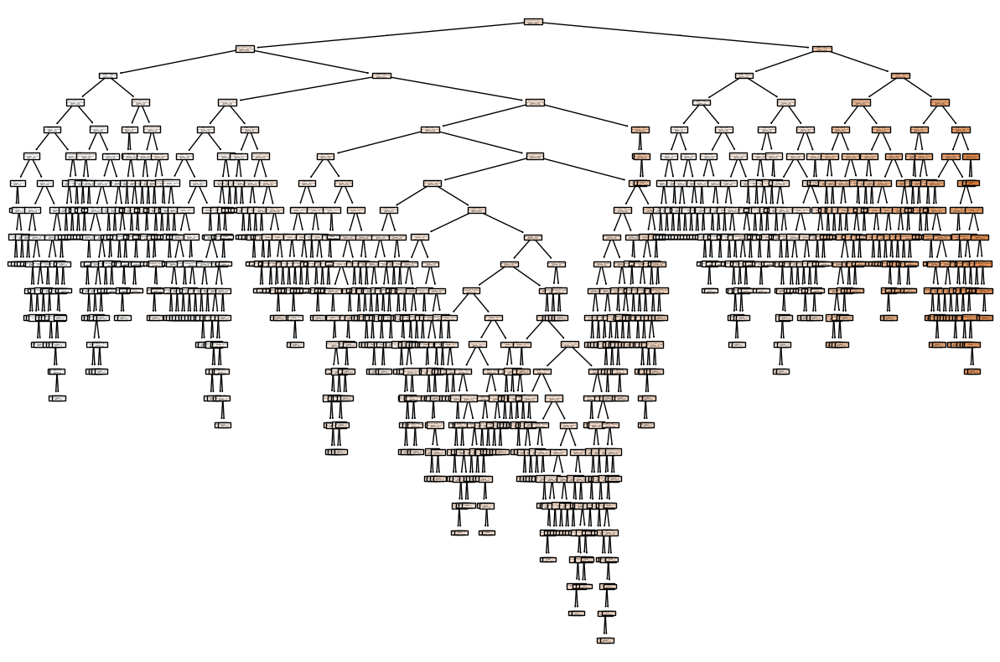

In [180]:
# Visualize the decision tree
plt.figure(figsize=(15, 10))
plot_tree(dtr, feature_names=feature_cols, filled=True)

# Save the image
plt.savefig('drt_initial_plot.png', dpi=300, bbox_inches='tight')

# Print the plot with plt.show()
plt.show()

In [181]:
# Print parameters Depeth and Leaves of the Decision Tree
print(f"Depth is {dtr.get_depth()}")
print(f"No. of Leaves are {dtr.get_n_leaves()}")

Depth is 23
No. of Leaves are 563


* A lower MSE is better - 10,468.885 suggests that, on average, the squared error between predicted and actual values is relatively low — which is good!
* The model’s predictions are off by around 38.47 units on average — that’s pretty accurate on the scale of thr target variable.
* The model explains 99.35% of the variance in the target — this is an exceptionally high fit.
* On average, the model’s predictions are off by about 102.32 units — which is reasonable on the scale of the target.

The high depth and large number of leaves suggest that the tree is complex, which could lead to overfitting — so we want to try reducing the depth to simplify it.

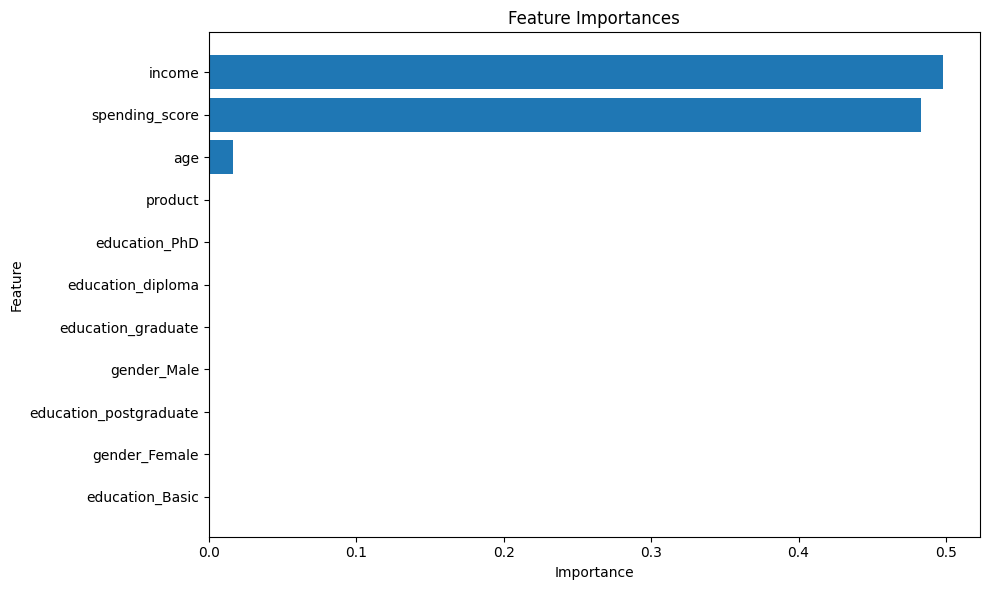

In [184]:
#Extract feature importances
feature_importances = dtr.feature_importances_

#Create a DataFrame to display feature importances
feature_importance_df = pd.DataFrame({'Feature': feature_cols, 'Importance': feature_importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=True)

#Plot feature importances
plt.figure(figsize=(10, 6))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importances')
plt.tight_layout()
plt.show()

0     0.381179
1     0.831866
2     0.914827
3     0.943347
4     0.956710
5     0.964719
6     0.976655
7     0.986795
8     0.989359
9     0.990470
10    0.992479
11    0.992482
12    0.993126
13    0.993335
dtype: float64


<Axes: >

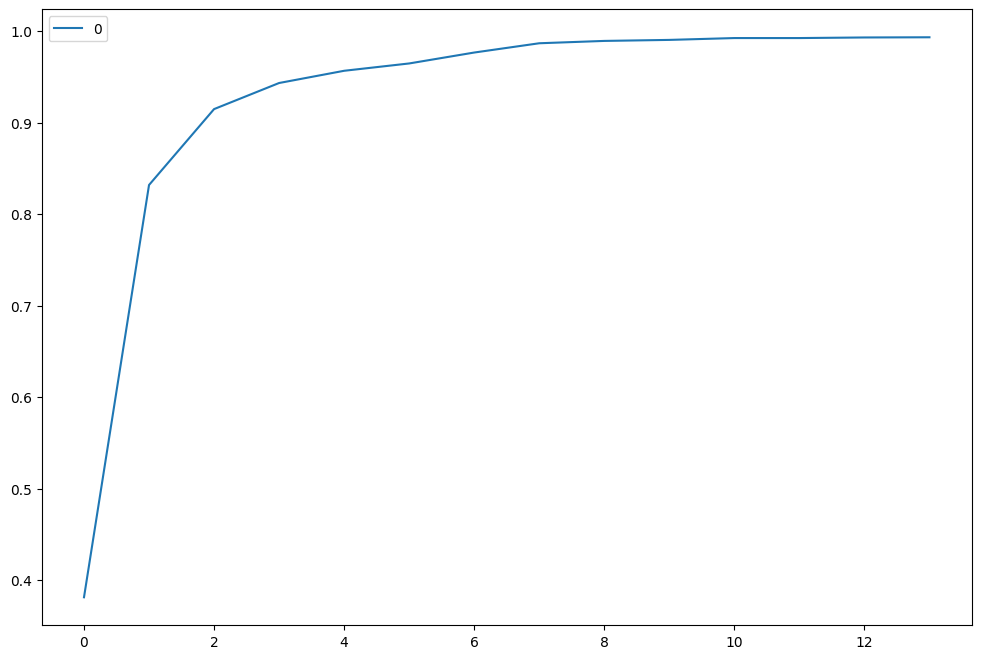

In [185]:
# Check the correct pruning parameters (max_depth)
# List of values to try for max_depth:
depth_range_max = [i for i in range (1,15)]

# List to store the accuracy for each value of max_depth:
accuracy = []
for depth in depth_range_max:
    dtrt = DecisionTreeRegressor(max_depth = depth, random_state = 42)
    dtrt.fit(X_train, y_train)
    score = dtrt.score(X_test, y_test)
    accuracy.append(score)

print(pd.Series(accuracy))

# Plot accuracy values across the range of depth values evaluated
accuracy = pd.DataFrame(accuracy)
accuracy.plot(figsize=(12,8))

In [186]:
# Prune the model.
# Using 10 based on the graph and accuracy score , because after the improvement becomes marginal 
dtr_pruned = DecisionTreeRegressor(max_depth=10, random_state=42)

## 4. Fit and plot final model.

In [188]:
# Fit and plot final model.
dtr_pruned.fit(X_train, y_train)
y_pred_pruned = dtr_pruned.predict(X_test)

In [189]:
# Evaluate the model
mse_pruned = mean_squared_error(y_test, y_pred_pruned)
mae_pruned = mean_absolute_error(y_test, y_pred_pruned)
rmse_pruned = np.sqrt(mse_pruned)
r2_pruned = r2_score(y_test, y_pred_pruned)

print(f"Pruned Model Mean Squared Error: {mse_pruned}")
print(f"Pruned Model Mean Absolute Error: {mae_pruned}")
print(f"Pruned Model R-squared: {r2_pruned}")
print(f"Root Mean Squared Error: {rmse_pruned}")

Pruned Model Mean Squared Error: 15437.31421749669
Pruned Model Mean Absolute Error: 64.48128833461625
Pruned Model R-squared: 0.9904695991414618
Root Mean Squared Error: 124.24698876631453


In [190]:
# Print parameters Depeth and Leaves of the Decision Tree
print(f"Depth is {dtr_pruned.get_depth()}")
print(f"No. of Leaves are {dtr_pruned.get_n_leaves()}")

Depth is 10
No. of Leaves are 322


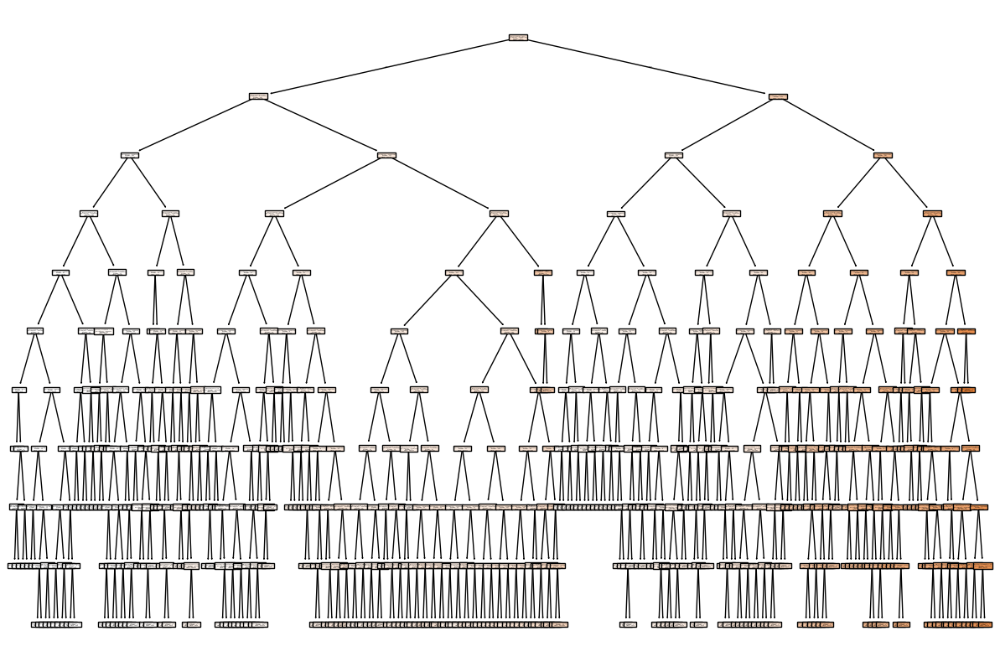

In [191]:
# Visualize the decision tree
plt.figure(figsize=(15, 10))
plot_tree(dtr_pruned, feature_names=feature_cols, filled=True)

# Save the image
plt.savefig('drt_pruned_plot.png', dpi=300, bbox_inches='tight')

# Print the plot with plt.show()
plt.show()

* The MSE increased from 10,468.88 to 15,437.31 after pruning, which is expected after pruning since the tree is less complex.
* The MAE increased from 38.47 to 64.48 — indicating that the model’s average absolute prediction error increased by about 26 units. A small increase in MAE is expected when reducing model complexity — the goal is better generalization, not perfect training accuracy.
* R² dropped slightly from 0.9935 → 0.9905 — but it’s still very high! A drop of 0.3% in R² is totally acceptable if it improves stability and reduces overfitting!
* RMSE increased from 102.32 → 124.25 — so the average size of prediction errors increased by about 22 units. A small increase in RMSE is a sign that the model is no longer overfitting the training data — which is a positive trade-off if it improves performance on new data.

#### Ramdom Forest
##### Pros:
* Reduces overfitting by combining multiple trees.
* More stable + better generalization
* Works particularly well if the data has noisy or complex patterns.
* Higher R² and lower errors are possible.
*  Great for complex data with hidden patterns
* Can handle some degree of missing data automatically.
* It's less sensitive to feature scaling and encoding.
##### Potential Downsides:
* Training a Random Forest is slower than a single tree, especially with large datasets.
* Prediction can also be slower since multiple trees are involved.
* A single decision tree is easy to visualize and interpret.
* A Random Forest is essentially a "black box" — hard to explain the logic behind individual predictions.

In [194]:
# Specify Dependent Variable
rf_y = df['loyalty_points']

# Specify Independent Variables
rf_X = df[feature_cols]

# Split the data training and testing
rf_X_train, rf_X_test, rf_y_train, rf_y_test = train_test_split(rf_X, rf_y,
                                                   test_size=0.3, random_state=10)
# Create a RandomForestRegressor object
rf = RandomForestRegressor(n_estimators=100, max_depth=10, random_state=10)

# Train the model on the training data
rf.fit(rf_X_train, rf_y_train)

RandomForestRegressor(max_depth=10, random_state=10)

In [195]:
# Predict the response for the test data.
rf_y_pred = rf.predict(rf_X_test)

# Evaluate the model
mse_rf = mean_squared_error(rf_y_test, rf_y_pred)
mae_rf = mean_absolute_error(rf_y_test, rf_y_pred)
rmse_rf = np.sqrt(mse_rf)
r2_rf = r2_score(rf_y_test, rf_y_pred)

print(f"Random Forest Model Mean Squared Error: {mse_rf}")
print(f"Random Forest Mean Absolute Error: {mae_rf}")
print(f"Random Forest Model R-squared: {r2_rf}")
print(f"Root Mean Squared Error: {rmse_rf}")

Random Forest Model Mean Squared Error: 7421.831176681972
Random Forest Mean Absolute Error: 41.65937560627396
Random Forest Model R-squared: 0.9950791954139152
Root Mean Squared Error: 86.150050357977


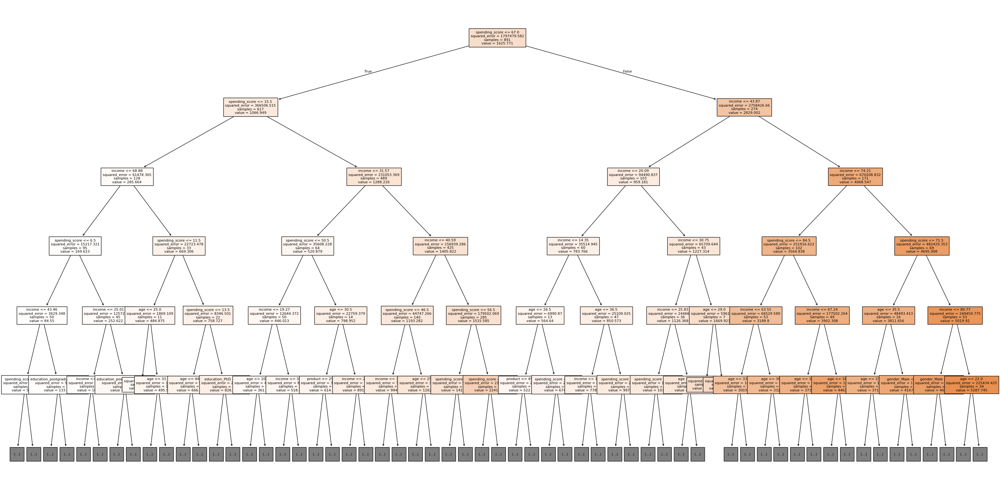

In [196]:
# Plot the decision tree to create the visualisation.
fig, ax = plt.subplots(figsize=(40,20))
tree.plot_tree(rf.estimators_[0], max_depth=5, feature_names=feature_cols, fontsize=8, filled=True)

# Dave the plot
plt.savefig('random_forest.png', dpi=300, bbox_inches='tight')

# Print the plot with plt.show().
plt.show()

In [197]:
# Print parameters Depeth and Leaves of the Random Forest
print(f"Depth is {rf.estimators_[0].get_depth()}")
print(f"No. of Leaves are {rf.estimators_[0].get_n_leaves()}")

Depth is 10
No. of Leaves are 276


* The Random Forest cut the MSE in half — huge improvement! Lower MSE means better overall predictive
* MAE dropped significantly — meaning the average prediction error decreased by about 23 units. A lower MAE means the model is more precise.
* R sqaured increased slightly. The small increase means the Random Forest is better at capturing the overall trend while reducing overfitting.
* RMSE dropped by about 38 units — the Random Forest is making smaller average prediction errors. Random Forest is definitely more precise.

## 5. Discuss: Insights and observations

* Random Forest is better than the pruned Decision Tree Regressor — it reduced MSE, MAE, and RMSE while slightly improving R².
* The model is now more stable and precise, with better generalization potential.
##### Key Insights on Predictors of Loyalty Points:
* Spending Score is the strongest predictor. The root node of the decision tree is based on spending_score, highlighting it as the most influential factor in predicting customer loyalty points. Aslso spending_score appears repeatedly throughout the tree’s splits, reinforcing its importance as a key driver of loyalty_points.
* Income is a secondary influencer. It often appears at the second level of the tree, suggesting that it plays an important but secondary role in predicting loyalty points. 
* Age Has a modest influence. Age appears in some deeper nodes, suggesting that its impact on loyalty points is less direct than spending_score and income.

# Week 3 assignment: Clustering with *k*-means using Python

The marketing department also wants to better understand the usefulness of renumeration and spending scores but do not know where to begin. You are tasked to identify groups within the customer base that can be used to target specific market segments. Use *k*-means clustering to identify the optimal number of clusters and then apply and plot the data using the created segments.

## Instructions
1. Prepare the data for clustering. 
    1. Import the CSV file you have prepared in Week 1.
    2. Create a new DataFrame (e.g. `df3`) containing the `renumeration` and `spending_score` columns.
    3. Explore the new DataFrame. 
2. Plot the renumeration versus spending score.
    1. Create a scatterplot.
    2. Create a pairplot.
3. Use the Silhouette and Elbow methods to determine the optimal number of clusters for *k*-means clustering.
    1. Plot both methods and explain how you determine the number of clusters to use.
    2. Add titles and legends to the plot.
4. Evaluate the usefulness of at least three values for *k* based on insights from the Elbow and Silhoutte methods.
    1. Plot the predicted *k*-means.
    2. Explain which value might give you the best clustering.
5. Fit a final model using your selected value for *k*.
    1. Justify your selection and comment on the respective cluster sizes of your final solution.
    2. Check the number of observations per predicted class.
6. Plot the clusters and interpret the model.

## 1. Load and explore the data

In [203]:
import warnings
warnings.filterwarnings('ignore')

In [204]:
# Load the CSV file(s) as df3
df3 = pd.read_csv('reviews.csv', usecols=['income', 'spending_score'])

# View DataFrame.
print(df3.shape)
df3.head()

(2000, 2)


,income,spending_score
0,12.30,39
1,12.30,81
2,13.12,6
3,13.12,77
4,13.94,40


In [205]:
# Explore the data.
df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 2 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   income          2000 non-null   float64
 1   spending_score  2000 non-null   int64  
dtypes: float64(1), int64(1)
memory usage: 31.4 KB


In [206]:
# Descriptive statistics.
df3.describe()

,income,spending_score
count,2000.000000,2000.000000
mean,48.079060,50.000000
std,23.123984,26.094702
min,12.300000,1.000000
25%,30.340000,32.000000
50%,47.150000,50.000000
75%,63.960000,73.000000
max,112.340000,99.000000


## 2. Plot

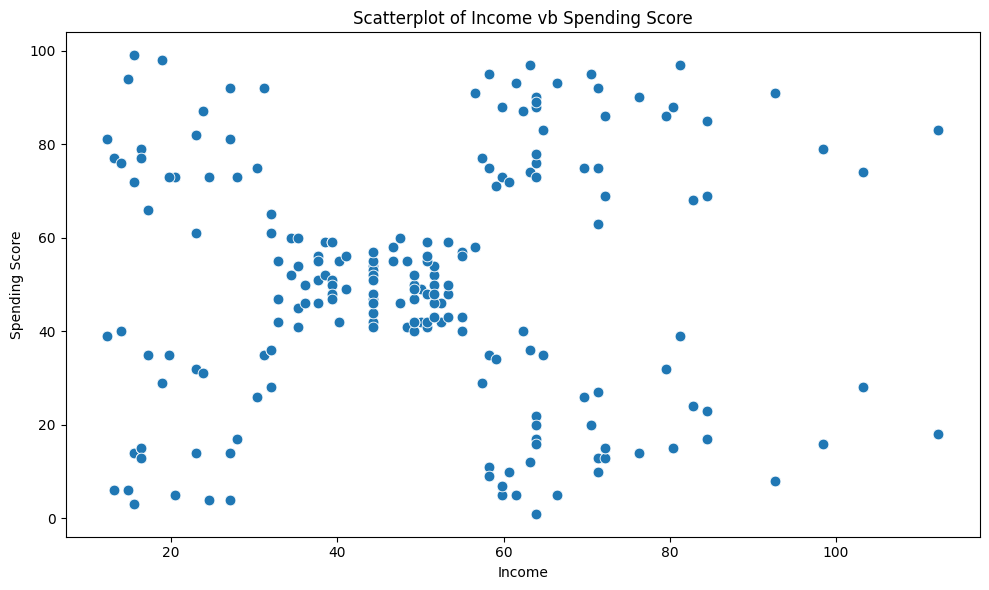

In [208]:
# Create a scatterplot with Seaborn.
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df3, x='income', y='spending_score', s = 60)
plt.xlabel('Income')
plt.ylabel('Spending Score')
plt.title('Scatterplot of Income vb Spending Score')
plt.tight_layout()

# Save the plot.
plt.savefig('Scatter_income_spending.png')

# Print the plot with plt.show().
plt.show()

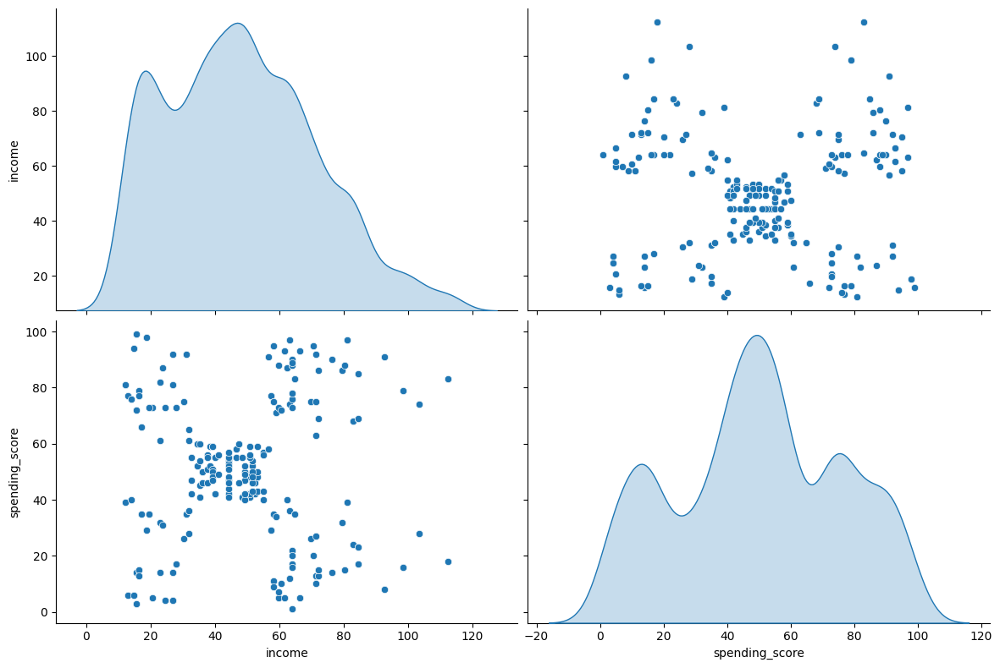

In [209]:
# Create a pairplot with Seaborn.
sns.pairplot(data=df3, diag_kind='kde', height=4, aspect=1.5, palette='Blues')

# Save the plot.
plt.savefig('Pairplot.png')

# Show the chart. 
plt.show() 

## 3. Elbow and silhoutte methods

In [211]:
# Determine the number of clusters: Elbow method.
# Within Cluster Sum of Squared Errors (WSS) 
wcss=[] # Create an empty list to store WSS values

# Let's choose to select a range from 1 to 10 clusters (remember in a for loop, the last value is excluded)
for i in range(1,11):
    # Create a KMeans object with 'i' clusters and set the number of initializations to 10
    km = KMeans(n_clusters=i, n_init=10) 
    km.fit(df3)
    wcss.append(km.inertia_)

wcss

[2430088.5950328,
 1528052.2502757658,
 1006659.3689455048,
 633387.5677305022,
 348507.3568197285,
 302096.8179823201,
 261600.19813482772,
 223801.20350199324,
 182630.76832996684,
 163637.61196495406]

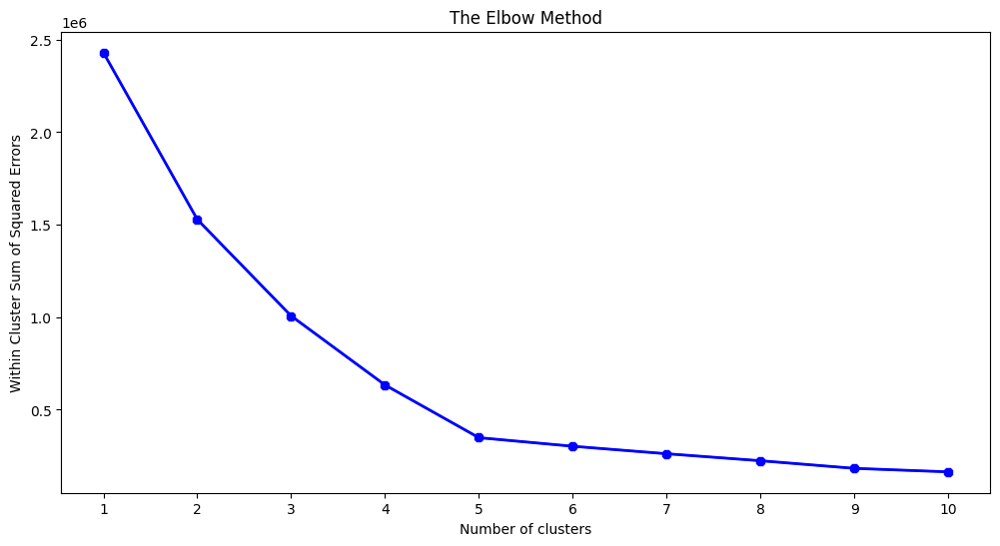

In [212]:
# The elbow curve
plt.figure(figsize=(12,6))
plt.plot(range(1,11),wcss)
plt.plot(range(1,11),wcss, linewidth=2, color="blue", marker ="8")
plt.xticks(np.arange(1,11,1))

plt.title("The Elbow Method")
plt.xlabel("Number of clusters")
plt.ylabel("Within Cluster Sum of Squared Errors")
plt.savefig('elbow.png')
plt.show()

* The Elbow Method plot indicates that the optimal k value is 5, as this is where a subtle bend appears in the graph. Additionally, the scatterplots above strongly support the presence of 5 distinct clusters of data points.

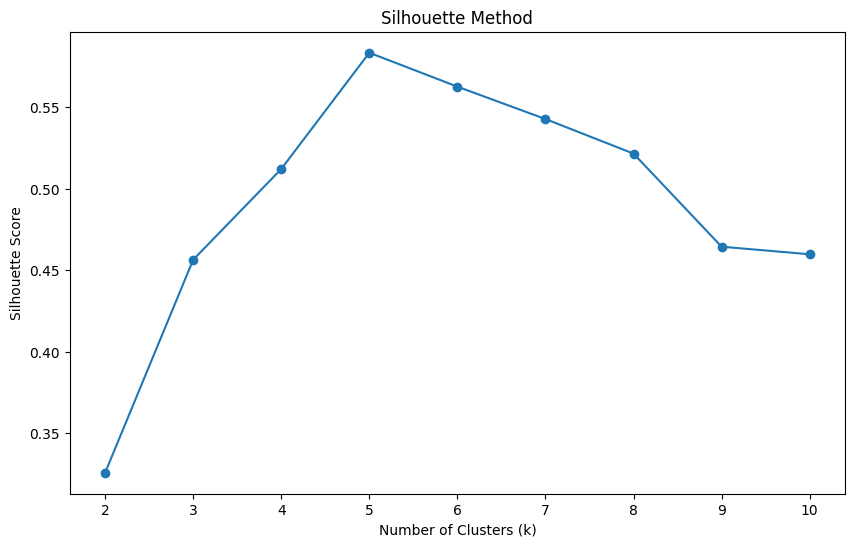

In [214]:
# Determine the number of clusters: Silhouette method.
# Create an empty list to store silhouette scores
silhouette_scores = []

# Loop through different values of k
for k in range(2, 11):
    km = KMeans(n_clusters=k, n_init=10, random_state=42)
    km.fit(df3)
    y_pred = km.predict(df3)
    
    silhouette_avg = silhouette_score(df3, y_pred)
    silhouette_scores.append(silhouette_avg)

# Plot the silhouette scores
plt.figure(figsize=(10, 6))
plt.plot(range(2, 11), silhouette_scores, marker='o')
plt.title('Silhouette Method')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.xticks(range(2, 11))
plt.show()

* The elbow and silhouette methods were used to determine the optimal number of clusters for the for K-means clustering, with both indicating that 5 was the optimal number of clusters. 


#### 4. Evaluate k-means model at different values of *k* (k=4, k=5, k=6)

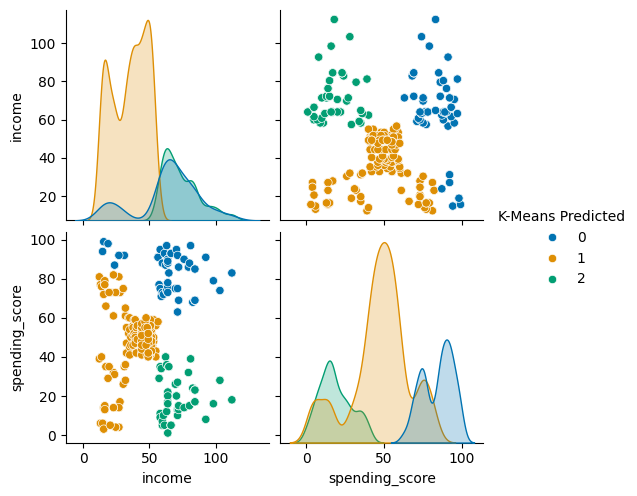

In [217]:
# Use three clusters.
kmeans = KMeans(n_clusters = 3, 
                max_iter = 15000,
                init='k-means++',
                random_state=42).fit(df3)

clusters = kmeans.labels_

df3['K-Means Predicted'] = clusters

# Plot the predicted.
sns.pairplot(df3,
             hue='K-Means Predicted',
             diag_kind= 'kde',
            palette='colorblind')

In [218]:
# Check the number of observations per predicted class using five clusters.
df3['K-Means Predicted'].value_counts()

K-Means Predicted
1    1220
0     429
2     351
Name: count, dtype: int64

* The output shows that the first cluster (n=1220) is a lot larger than the rest. 

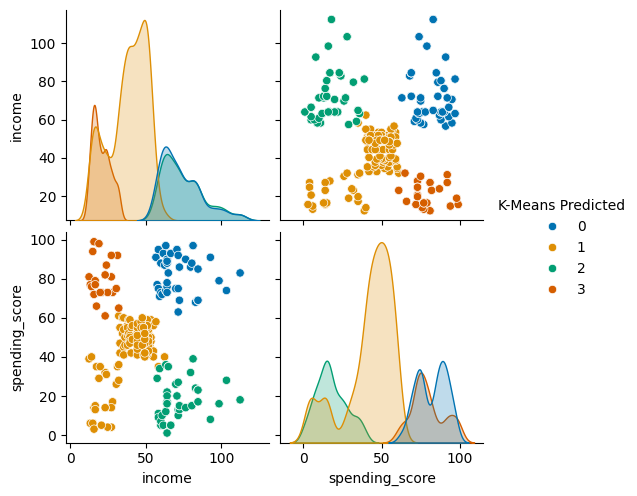

In [220]:
# Use four clusters.
kmeans = KMeans(n_clusters = 4, 
                max_iter = 15000,
                init='k-means++',
                random_state=42).fit(df3)

clusters = kmeans.labels_

df3['K-Means Predicted'] = clusters

# Plot the predicted.
sns.pairplot(df3,
             hue='K-Means Predicted',
             diag_kind= 'kde',
            palette='colorblind');

In [221]:
# Check the number of observations per predicted class using four clusters.
df3['K-Means Predicted'].value_counts()

K-Means Predicted
1    1038
0     356
2     337
3     269
Name: count, dtype: int64

* The output shows that the first cluster (n=1038) is still significantly larger than the rest. 

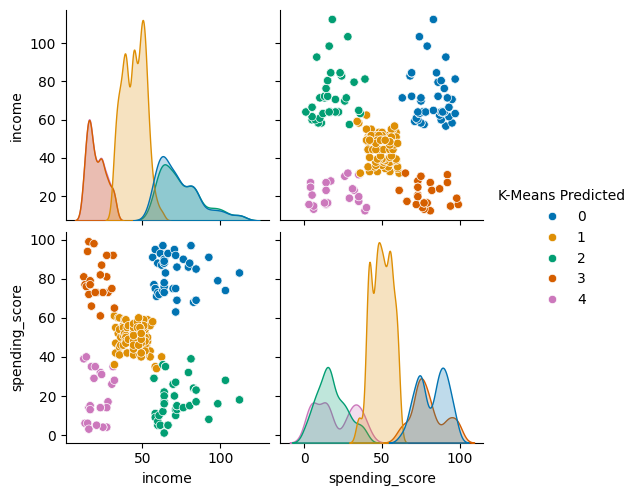

In [223]:
# Use four clusters.
kmeans = KMeans(n_clusters = 5, 
                max_iter = 15000,
                init='k-means++',
                random_state=42).fit(df3)

clusters = kmeans.labels_

df3['K-Means Predicted'] = clusters

# Plot the predicted.
sns.pairplot(df3,
             hue='K-Means Predicted',
             diag_kind= 'kde',
            palette='colorblind')

In [224]:
# Check the number of observations per predicted class using five clusters.
df3['K-Means Predicted'].value_counts()

K-Means Predicted
1    774
0    356
2    330
4    271
3    269
Name: count, dtype: int64

* The output shows that the clusters are grouped reasonably well.
* Most customers sit in the average of income and spending score.  

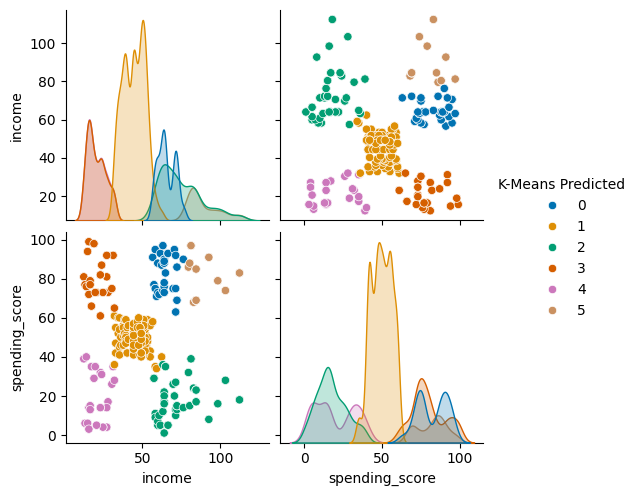

In [226]:
# Use three clusters.
kmeans = KMeans(n_clusters = 6, 
                max_iter = 15000,
                init='k-means++',
                random_state=42).fit(df3)

clusters = kmeans.labels_

df3['K-Means Predicted'] = clusters

# Plot the predicted.
sns.pairplot(df3,
             hue='K-Means Predicted',
             diag_kind= 'kde',
            palette='colorblind')

In [227]:
# Check the number of observations per predicted class using five clusters.
df3['K-Means Predicted'].value_counts()

K-Means Predicted
1    774
2    330
4    271
3    269
0    238
5    118
Name: count, dtype: int64

* The output shows that the last cluster (n=118) is significantly smaller than the rest. 

## 5. Fit final model and justify your choice

* The best model based on the scatterplots, Elbow Method and Silhouette Method is one using five clusters (k=5)

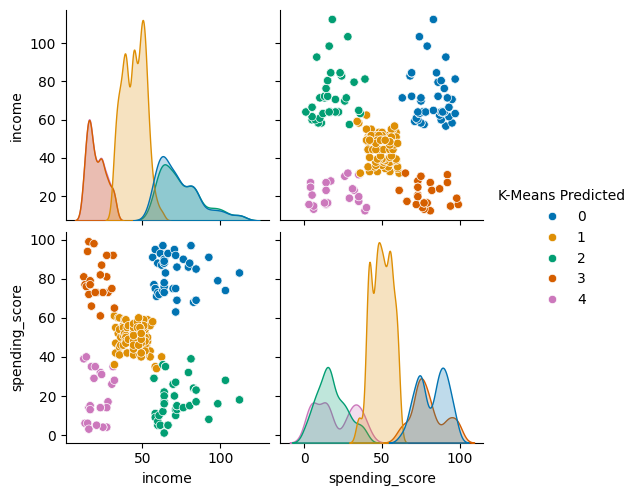

In [231]:
# Apply the final model.
# Five clusters.
kmeans = KMeans(n_clusters = 5, 
                max_iter = 15000,
                init='k-means++',
                random_state=42).fit(df3)

clusters = kmeans.labels_

df3['K-Means Predicted'] = clusters

# Plot the predicted.
sns.pairplot(df3,
             hue='K-Means Predicted',
             diag_kind= 'kde',
            palette='colorblind');

plt.savefig('clusters.png')
plt.show()

In [232]:
# Check the number of observations per predicted class.
df3['K-Means Predicted'].value_counts()

K-Means Predicted
1    774
0    356
2    330
4    271
3    269
Name: count, dtype: int64

## 6. Plot and interpret the clusters

In [234]:
# View the DataFrame.
df3

,income,spending_score,K-Means Predicted
0,12.30,39,4
1,12.30,81,3
2,13.12,6,4
3,13.12,77,3
4,13.94,40,4
...,...,...,...
1995,84.46,69,0
1996,92.66,8,2
1997,92.66,91,0
1998,98.40,16,2


In [235]:
df3["K-Means Predicted"].unique()

array([4, 3, 1, 0, 2], dtype=int32)

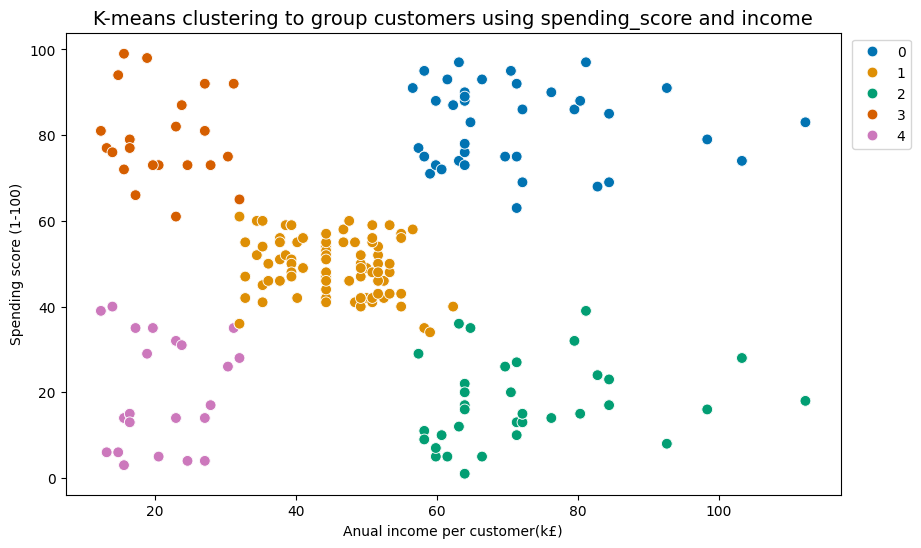

In [236]:
# Visualising the clusters.
# Set plot size.
plt.figure(figsize=(10, 6))

# Create a scatterplot.
sns.scatterplot(x='income' , 
                y ='spending_score',
                data=df3,
                hue='K-Means Predicted',
                palette='colorblind',
                legend='full',
                s = 60)
plt.xlabel('Anual income per customer(k£)', fontsize=10)
plt.ylabel('Spending score (1-100)', fontsize=10)
plt.title('K-means clustering to group customers using spending_score and income', fontsize=14)

# Format the legend. 
plt.legend(bbox_to_anchor=(1.1,1))

plt.savefig('clusters5.png')

plt.show()

## 7. Discuss: Insights and observations

The data points distinctly form five separate clusters, with both the Elbow and Silhouette methods indicating that 5 is the optimal k value for the K-Means model:
* The scatterplot validates that these five groups create well-defined, non-overlapping clusters.
* This analysis suggests that customers can be segmented based on their income and spending score. These clusters could be further explored using additional data, such as natural language processing of their reviews and analyzing the types of products they purchase.

#### Analyze the Segments

**Segment 0: 'High Income - High Spending  (Blue)'**

Annual Income: 55k to 85k, Spending Score: 60-100

Possible Behaviors:
Likely premium shoppers or brand-loyal customers.
Customers in this segment have a higher income and a high spending score.
They could be considered high-value customers who are willing to spend on various products and experiences.
Luxury items, personalized shopping experiences, and premium products might be of interest to this segment.
Marketing efforts focusing on exclusivity, premium quality, and unique offerings could resonate well.
Loyalty programs that provide exclusive access and benefits might engage this segment.




**Segment 1: 'Mid Income - Moderate Spending (Orange)'**

Annual Income: 30k to 55k, Spending Score: 40-60

Possible Behaviors:
Likely practical buyers balancing income and expenses.
This segment represents customers with moderate income and a balanced spending score.
They might be practical shoppers who look for value and utility in their purchases.
They might make considered buying decisions, comparing options before making a purchase.
Marketing messages highlighting affordability, quality, and convenience could appeal to this segment.
Offering mid-range products with a good balance of features might attract their interest.

**Segment 2: 'High Income - Low Spending (Green)'**

Annual Income: 55k to 85k, Spending Score: 0-40

Possible Behaviors:
May prefer savings over spending or shop selectively.
Customers in this segment have a relatively higher income, but their spending score is lower. This could suggest that they are more conservative spenders.
They might prioritize saving or investing their money rather than indulging in luxury purchases.
Marketing strategies targeting value, quality, and long-term benefits might resonate well with this segment.
Offering loyalty programs or discounts for long-term savings might attract their attention.

**Segment 3: 'Low Income - High Spending (Red)'**

Annual Income: 10k to 35k, Spending Score: 60-100

Possible Behaviors:
Could represent young or aspirational shoppers willing to spend despite lower incomes.
This segment includes customers with lower incomes but high spending scores.
It could represent younger customers or individuals who prioritize spending on certain items despite budget constraints.
Marketing strategies that emphasize affordability, discounts, and budget-friendly options might appeal.
Offering flexible payment options, sale events, and value bundles could attract this segment.

**Segment 4: 'Low Income - Low Spending (Purple)'**

Annual Income: 10k to 35k, Spending Score: 5-40

Possible Behaviors:
Likely price-sensitive or occasional shoppers.
Customers in this segment have lower incomes and relatively lower spending scores.
They might be more cautious spenders who focus on essentials and necessary items.
Marketing efforts that highlight cost-saving options, basic necessities, and essential products could resonate.
Offering budget-friendly items, economical bundles, and discounts might attract this segment.
Opportunities to improve their in-store experience might encourage them to spend more.

In [240]:
# Append predicted clusters on review data
reviews_clean['label']= df3["K-Means Predicted"]

# Create descriptive marketing labels 
marketing_labels = {
    0: 'High Income - High Spending ',
    1: 'Mid Income - Moderate Spending',
    2: 'High Income - Low Spending ',
    3: 'Low Income - High Spending',
    4: 'Low Income - Low Spending'}

# Create a new column with descriptive names, replace label values with map function 
reviews_clean['marketing_labels'] = reviews_clean.label.map(marketing_labels)

# Create a copy
df_segments = reviews_clean.copy()

# Display the first few rows of the modified DataFrame
df_segments.head()

,gender,age,income,spending_score,loyalty_points,education,product,review,summary,log_loyalty_points,label,marketing_labels
0,Male,18,12.30,39,210,graduate,453,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...,5.347108,4,Low Income - Low Spending
1,Male,23,12.30,81,524,graduate,466,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...,6.261492,3,Low Income - High Spending
2,Female,22,13.12,6,40,graduate,254,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless",3.688879,4,Low Income - Low Spending
3,Female,25,13.12,77,562,graduate,263,Amazing buy! Bought it as a gift for our new d...,Five Stars,6.331502,3,Low Income - High Spending
4,Female,33,13.94,40,366,graduate,291,As my review of GF9's previous screens these w...,Money trap,5.902633,4,Low Income - Low Spending


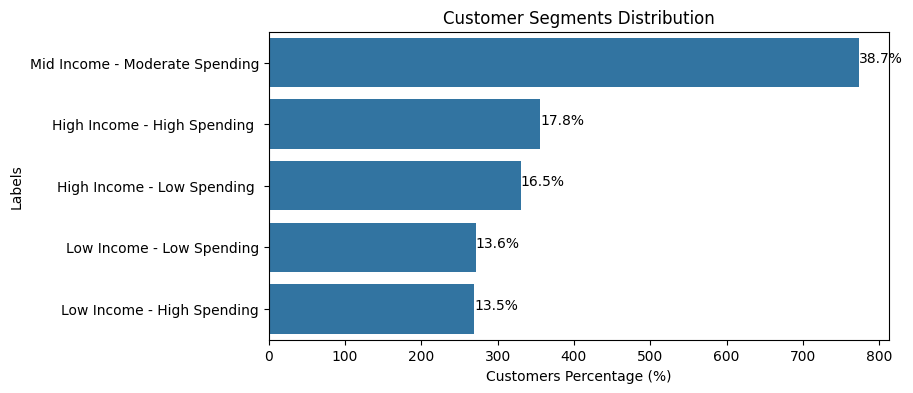

<Figure size 1500x1000 with 0 Axes>

In [615]:
# Create countplot to display marketing label distribution
plt.figure(figsize=(8, 4))
ax = sns.countplot(y=df_segments['marketing_labels'], order=df_segments['marketing_labels'].value_counts().index)

# Annotate the bars with percentages
total = df_segments['marketing_labels'].count()
for p in ax.patches:
    percentage = f'{(p.get_width() / total) * 100:.1f}%'
    x = p.get_x() + p.get_width() + 0.02
    y = p.get_y() + p.get_height() / 2
    ax.annotate(percentage, (x, y))

# Set title and labels
plt.title('Customer Segments Distribution')
plt.ylabel('Labels')
plt.xlabel('Customers Percentage (%)')

plt.show()
plt.tight_layout()

* Nearly half of the customers who purchased a product and left a review exhibited balanced spending habits and moderate incomes. A significant portion of high earners displayed diverse spending patterns, ranging from conservative to extravagant (including luxury spenders and savvy shoppers). This presents a valuable opportunity.

Next we'll analyze the average and standard deviation of age and loyalty points to determine whether incorporating additional numerical variables can further refine our segmentation.

In [244]:
# Remove unnecessary columns
df_segments.drop(columns=['review','summary','label'], inplace=True)

# View df 
df_segments.head()

,gender,age,income,spending_score,loyalty_points,education,product,log_loyalty_points,marketing_labels
0,Male,18,12.30,39,210,graduate,453,5.347108,Low Income - Low Spending
1,Male,23,12.30,81,524,graduate,466,6.261492,Low Income - High Spending
2,Female,22,13.12,6,40,graduate,254,3.688879,Low Income - Low Spending
3,Female,25,13.12,77,562,graduate,263,6.331502,Low Income - High Spending
4,Female,33,13.94,40,366,graduate,291,5.902633,Low Income - Low Spending


In [245]:
# Group by the labeled clusters by average loyalty points and age.
cluster_attributes_stats = df_segments.groupby('marketing_labels').agg({
    'loyalty_points': ['mean', 'std'],
    'age': ['mean', 'std']}).reset_index()

#View the output 
cluster_attributes_stats

marketing_labels loyalty_points                    age  \
                                            mean         std       mean   
0    High Income - High Spending     3988.238764  898.409322  35.592697   
1     High Income - Low Spending      911.760606  545.849379  40.666667   
2      Low Income - High Spending     971.944238  296.173785  31.602230   
3       Low Income - Low Spending     275.059041  198.236064  43.505535   
4  Mid Income - Moderate Spending    1420.382429  322.530608  42.129199   

              
         std  
0   7.299612  
1  11.357594  
2  10.731534  
3  13.961553  
4  15.721916

* This reinforces our regression and decision tree findings, showing that variations in spending score and income explain positive shifts in loyalty points—luxury shoppers (high income, high spending) tend to have the highest loyalty points.

* It also confirms that clustering by loyalty points offers little additional business insight.

* Meanwhile, the average age of ~40 with low variability suggests age is not a key differentiator across segments.

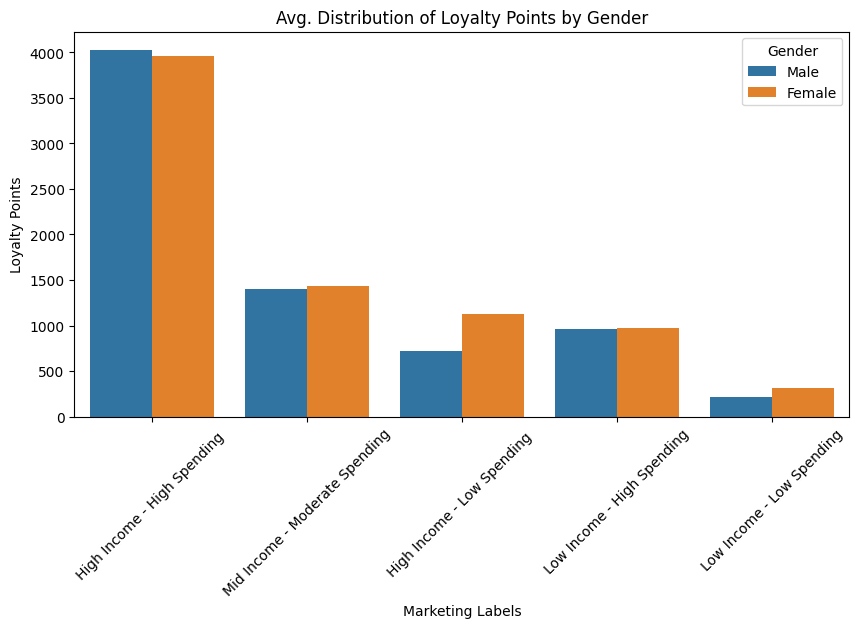

In [247]:
#Look at loyalty points distribution by gender 
avg_cluster_attributes = df_segments.groupby(['marketing_labels', 'gender']).agg({'loyalty_points': 'mean', 'age': 'mean'}) \
    .reset_index() \
    .sort_values(by='loyalty_points', ascending=False)

# View df
avg_cluster_attributes 

# Plot distribution of loyalty points on customer segments  by gender 
#Define size
plt.figure(figsize=(10, 5))

ax = sns.barplot(data= avg_cluster_attributes, x = 'marketing_labels', y='loyalty_points', hue ='gender')
plt.xticks(rotation=45) 

# Set title, labels and legend
ax.set_title('Avg. Distribution of Loyalty Points by Gender')
ax.set_xlabel('Marketing Labels')
ax.set_ylabel('Loyalty Points')
legend = ax.legend(title='Gender')

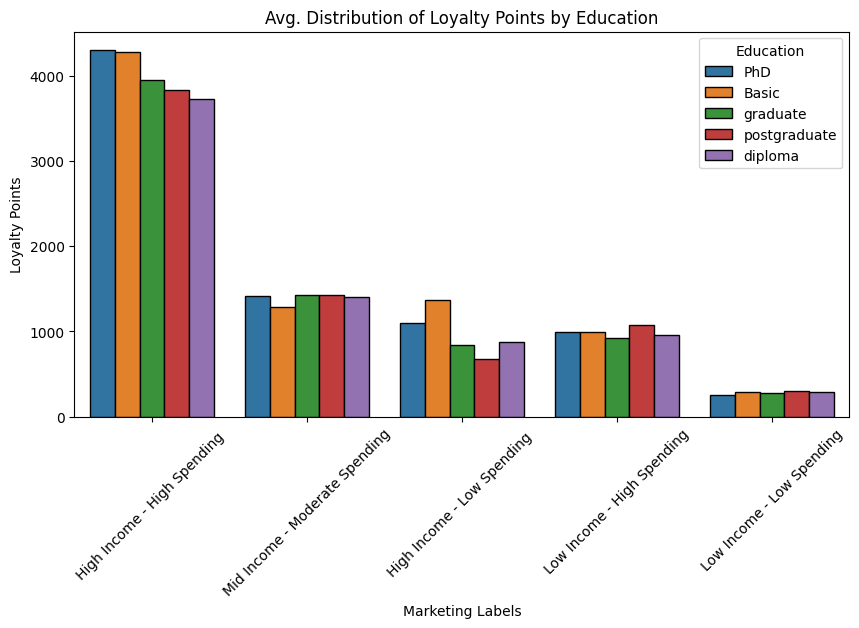

In [248]:
# Create df grouping marketings segments by education divided by avg loyalty points
avg_edu_loyalty_by_cluster= df_segments.groupby(['marketing_labels','education'])['loyalty_points'].mean()\
    .reset_index() \
    .sort_values(by='loyalty_points', ascending=False)

# Plot distribution of loyalty points on customer segments  by education 
#Define size
plt.figure(figsize=(10, 5))

ax = sns.barplot(data= avg_edu_loyalty_by_cluster, x = 'marketing_labels', y='loyalty_points', hue ='education', edgecolor = 'black')
plt.xticks(rotation=45) 

# Set title,labels and legend
ax.set_title('Avg. Distribution of Loyalty Points by Education')
ax.set_xlabel('Marketing Labels')
ax.set_ylabel('Loyalty Points')
legend = ax.legend(title='Education')

* Customer segments by Education doesn't show specific patterns in loyalty.

#### Apply SVR model

In [251]:
import pandas as pd
import numpy as np
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score

# Select relevant features
X = reviews_clean[['spending_score', 'income']]  # Independent variables
y = reviews_clean['loyalty_points']  # Dependent variable

# Normalize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Train the SVR model
svr = SVR(kernel='rbf', C=1.0, epsilon=0.1)
svr.fit(X_train, y_train)

# Make predictions
y_pred = svr.predict(X_test)

# Evaluate model performance
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print("Mean Squared Error:", mse)
print("R-squared:", r2)


Mean Squared Error: 1441148.2471936087
R-squared: 0.11131984794377492


* SVR model's R² = 0.11, meaning it explains only 11% of the variation in loyalty_points.
* Compared to your Decision Tree Regressor (R² = 0.99) and Random Forest (also 0.11), SVR is underperforming.

Mean Squared Error: 0.022206764899956277
R-squared: 0.9768862100002215


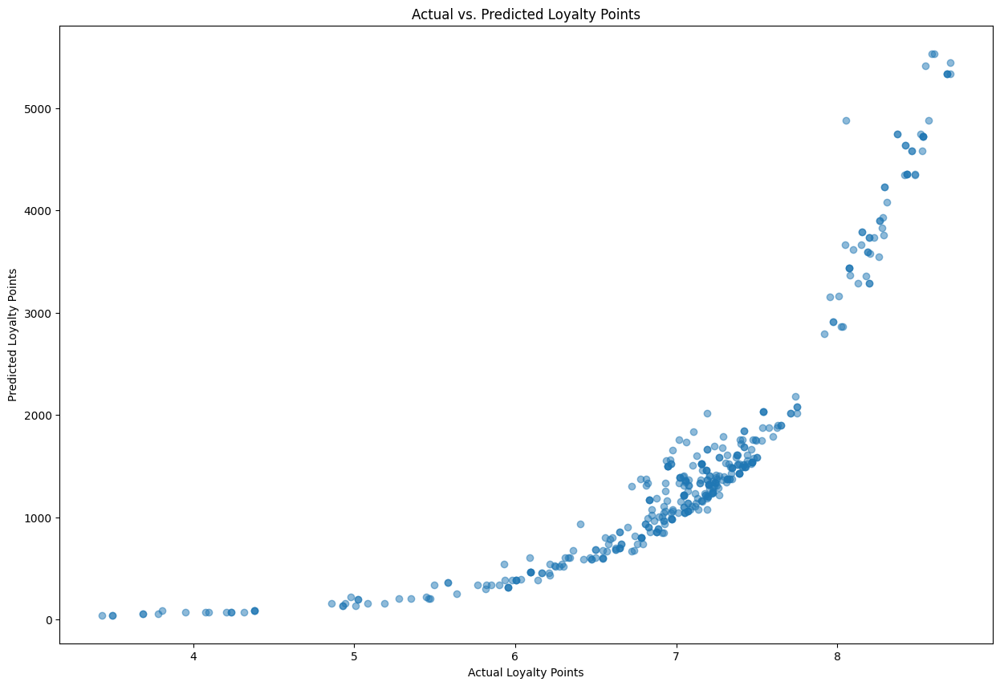

In [619]:
# Select relevant features
X = reviews_clean[['spending_score', 'income']]  
y = reviews_clean['log_loyalty_points']  

# Normalize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Train the SVR model
svr = SVR(kernel='rbf', C=1.0, epsilon=0.1)
svr.fit(X_train, y_train)

# Make predictions
y_pred_log = svr.predict(X_test)

# Evaluate model performance
mse = mean_squared_error(y_test, y_pred_log)
r2 = r2_score(y_test, y_pred_log)

y_pred_actual = np.expm1(y_pred_log)

print("Mean Squared Error:", mse)
print("R-squared:", r2)

plt.scatter(y_test, y_pred_actual, alpha=0.5)
plt.xlabel("Actual Loyalty Points")
plt.ylabel("Predicted Loyalty Points")
plt.title("Actual vs. Predicted Loyalty Points")
plt.show()

* R² jumped from 0.11 to 0.98 after applying the log transformation—this means the model is now explaining almost all the variability in loyalty_points.

# Week 4 assignment: NLP using Python
Customer reviews were downloaded from the website of Turtle Games. This data will be used to steer the marketing department on how to approach future campaigns. Therefore, the marketing department asked you to identify the 15 most common words used in online product reviews. They also want to have a list of the top 20 positive and negative reviews received from the website. Therefore, you need to apply NLP on the data set.

## Instructions
1. Load and explore the data. 
    1. Sense-check the DataFrame.
    2. You only need to retain the `review` and `summary` columns.
    3. Determine if there are any missing values.
2. Prepare the data for NLP
    1. Change to lower case and join the elements in each of the columns respectively (`review` and `summary`).
    2. Replace punctuation in each of the columns respectively (`review` and `summary`).
    3. Drop duplicates in both columns (`review` and `summary`).
3. Tokenise and create wordclouds for the respective columns (separately).
    1. Create a copy of the DataFrame.
    2. Apply tokenisation on both columns.
    3. Create and plot a wordcloud image.
4. Frequency distribution and polarity.
    1. Create frequency distribution.
    2. Remove alphanumeric characters and stopwords.
    3. Create wordcloud without stopwords.
    4. Identify 15 most common words and polarity.
5. Review polarity and sentiment.
    1. Plot histograms of polarity (use 15 bins) for both columns.
    2. Review the sentiment scores for the respective columns.
6. Identify and print the top 20 positive and negative reviews and summaries respectively.
7. Include your insights and observations.

## 1. Load and explore the data

In [257]:
# Load the data set as df3.
df4=pd.read_csv('reviews.csv')

# View DataFrame.
df4.head()

,gender,age,income,spending_score,loyalty_points,education,product,review,summary
0,Male,18,12.30,39,210,graduate,453,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...
1,Male,23,12.30,81,524,graduate,466,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...
2,Female,22,13.12,6,40,graduate,254,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless"
3,Female,25,13.12,77,562,graduate,263,Amazing buy! Bought it as a gift for our new d...,Five Stars
4,Female,33,13.94,40,366,graduate,291,As my review of GF9's previous screens these w...,Money trap


In [258]:
# Explore data set.
print(df4.info())
df4.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   gender          2000 non-null   object 
 1   age             2000 non-null   int64  
 2   income          2000 non-null   float64
 3   spending_score  2000 non-null   int64  
 4   loyalty_points  2000 non-null   int64  
 5   education       2000 non-null   object 
 6   product         2000 non-null   int64  
 7   review          2000 non-null   object 
 8   summary         2000 non-null   object 
dtypes: float64(1), int64(4), object(4)
memory usage: 140.8+ KB
None


,age,income,spending_score,loyalty_points,product
count,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,39.495000,48.079060,50.000000,1578.032000,4320.521500
std,13.573212,23.123984,26.094702,1283.239705,3148.938839
min,17.000000,12.300000,1.000000,25.000000,107.000000
25%,29.000000,30.340000,32.000000,772.000000,1589.250000
50%,38.000000,47.150000,50.000000,1276.000000,3624.000000
75%,49.000000,63.960000,73.000000,1751.250000,6654.000000
max,72.000000,112.340000,99.000000,6847.000000,11086.000000


In [259]:
# Keep necessary columns. Drop unnecessary columns.
df4 = df4.drop(columns=['gender', 'age', 'income','spending_score', 'loyalty_points', 'education','product'])

# View DataFrame.
df4.head()

,review,summary
0,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...
1,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...
2,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless"
3,Amazing buy! Bought it as a gift for our new d...,Five Stars
4,As my review of GF9's previous screens these w...,Money trap


In [260]:
# Determine if there are any missing values.
df4.isnull().sum()

review     0
summary    0
dtype: int64

In [261]:
# Determine if there are any duplicates in df4.
print("Number of duplicate rows:",df4.duplicated().sum())

Number of duplicate rows: 18


In [262]:
# View duplicates in df4.
df4["is_duplicate"] = df4.duplicated(keep=False)
print(df4[df4["is_duplicate"]])

                                review     summary  is_duplicate
48                             love it  Five Stars          True
55                              Great!  Five Stars          True
94                               great  Five Stars          True
294                               Good  Five Stars          True
326                            love it  Five Stars          True
371                             Great!  Five Stars          True
408                              great  Five Stars          True
416                            love it  Five Stars          True
430                            Love it  Five Stars          True
702                        Love these!  Five Stars          True
810                         great game  Five Stars          True
811                         great game  Five Stars          True
933                            Awesome  Five Stars          True
959                            Love it  Five Stars          True
1006                     

* I have decided to keep the duplicates, as they are generic and could have been written by different customers.

## 2. Prepare the data for NLP
### 2a) Change to lower case and join the elements in each of the columns respectively (review and summary)

In [265]:
# Review: Change all to lower case and join with a space.
df4['review'] = df4['review'].apply(lambda x: " ".join(x.lower() for x in x.split()))
df4['review'].head()

0    when it comes to a dm's screen, the space on t...
1    an open letter to galeforce9*: your unpainted ...
2    nice art, nice printing. why two panels are fi...
3    amazing buy! bought it as a gift for our new d...
4    as my review of gf9's previous screens these w...
Name: review, dtype: object

In [266]:
# Summary: Change all to lower case and join with a space.
df4['summary'] = df4['summary'].apply(lambda x: " ".join(x.lower() for x in x.split()))
df4['summary'].head()

0    the fact that 50% of this space is wasted on a...
1    another worthless dungeon master's screen from...
2                      pretty, but also pretty useless
3                                           five stars
4                                           money trap
Name: summary, dtype: object

### 2b) Replace punctuation in each of the columns respectively (review and summary)

In [268]:
# Import the module to remove punctuation.
import re

# Replace all the punctuations in review column.
df4['review'] = [re.sub('[^\w\s]+', '', s) for s in df4['review'].tolist()]

# View output.
df4['review'].head()

0    when it comes to a dms screen the space on the...
1    an open letter to galeforce9 your unpainted mi...
2    nice art nice printing why two panels are fill...
3    amazing buy bought it as a gift for our new dm...
4    as my review of gf9s previous screens these we...
Name: review, dtype: object

In [269]:
# Replace all the puncuations in summary column.
df4['summary'] = [re.sub('[^\w\s]+', '', s) for s in df4['summary'].tolist()]

# View output.
df4['summary'].head()

0    the fact that 50 of this space is wasted on ar...
1    another worthless dungeon masters screen from ...
2                       pretty but also pretty useless
3                                           five stars
4                                           money trap
Name: summary, dtype: object

### 2c) Drop duplicates in both columns

In [271]:
# Drop duplicates in both columns.
df4[['review', 'summary']].duplicated().sum()

# As mentioned on line 449, I decided not to drop the duplicates because they were generic and some had different punctuation and cases,\
# suggesting different users.

np.int64(39)

## 3. Tokenise and create wordclouds

In [273]:
# Create new DataFrame (copy DataFrame).
df_sentiment = df4.drop(columns=['is_duplicate'])

# View DataFrame.
df_sentiment.head()

,review,summary
0,when it comes to a dms screen the space on the...,the fact that 50 of this space is wasted on ar...
1,an open letter to galeforce9 your unpainted mi...,another worthless dungeon masters screen from ...
2,nice art nice printing why two panels are fill...,pretty but also pretty useless
3,amazing buy bought it as a gift for our new dm...,five stars
4,as my review of gf9s previous screens these we...,money trap


In [274]:
# Apply tokenisation to both columns.
df_sentiment['review_tokens'] = df_sentiment['review'].apply(word_tokenize)
df_sentiment['summary_tokens'] = df_sentiment['summary'].apply(word_tokenize)

# View DataFrame.
df_sentiment.head()

,review,summary,review_tokens,summary_tokens
0,when it comes to a dms screen the space on the...,the fact that 50 of this space is wasted on ar...,"[when, it, comes, to, a, dms, screen, the, spa...","[the, fact, that, 50, of, this, space, is, was..."
1,an open letter to galeforce9 your unpainted mi...,another worthless dungeon masters screen from ...,"[an, open, letter, to, galeforce9, your, unpai...","[another, worthless, dungeon, masters, screen,..."
2,nice art nice printing why two panels are fill...,pretty but also pretty useless,"[nice, art, nice, printing, why, two, panels, ...","[pretty, but, also, pretty, useless]"
3,amazing buy bought it as a gift for our new dm...,five stars,"[amazing, buy, bought, it, as, a, gift, for, o...","[five, stars]"
4,as my review of gf9s previous screens these we...,money trap,"[as, my, review, of, gf9s, previous, screens, ...","[money, trap]"


In [275]:
# Put all the review tokens into one list.
# Define an empty list of tokens.
all_review_tokens = []

for i in range(df_sentiment.shape[0]):
    # Add each token to the list.
    all_review_tokens = all_review_tokens + df_sentiment['review_tokens'][i]
    
# Print the length of the list of review tokens.
print("There are",len(all_review_tokens),"review tokens.")

There are 112202 review tokens.


In [276]:
# Filter out tokens that are neither alphabets nor numbers.
all_review_tokens = [word for word in all_review_tokens if word.isalnum()]

print("There are",len(all_review_tokens),"review tokens.")

There are 112194 review tokens.


In [277]:
# Convert list of tokens into a string variable.
# Define an empty string variable.
review_tokens_string = ''

for value in all_review_tokens:
    # Add each filtered token word to the string.
    review_tokens_string = review_tokens_string + value + ' '

In [278]:
# Review: Create a word cloud.
wordcloud = WordCloud(width = 1600, height = 900, 
                background_color ='white', 
                colormap='plasma',
                stopwords = 'none',
                min_font_size = 10).generate(review_tokens_string)

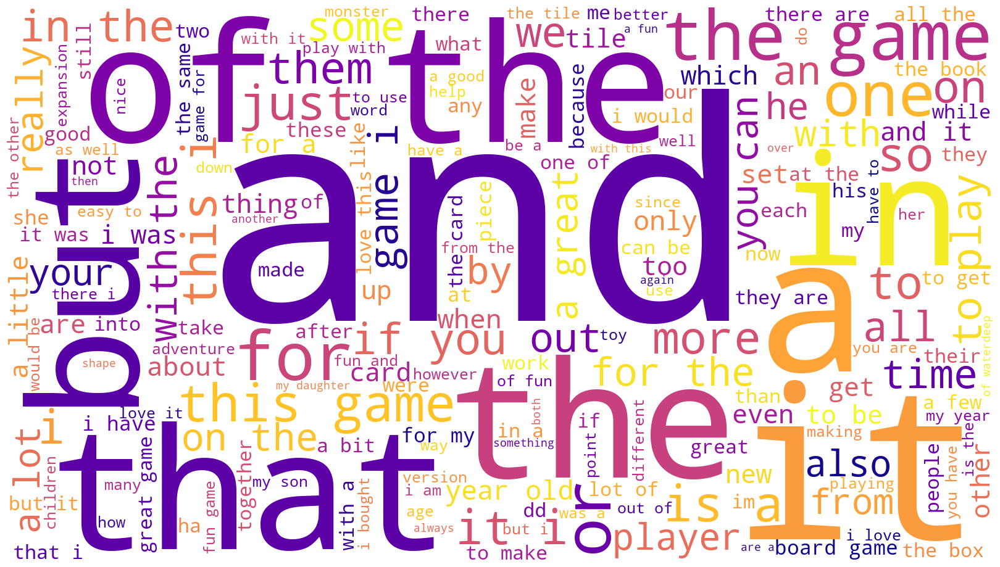

In [279]:
# Review: Plot the WordCloud image.
plt.figure(figsize = (16, 9), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis('off') 
plt.tight_layout(pad = 0) 
plt.show()

* The wordcloud image for the review column shows a large number of prominent stopwords, such as 'the', 'and', 'that', 'it', and 'of'.

In [281]:
# Put all the summary tokens into one list.
# Define an empty list of tokens.
all_summary_tokens = []

for i in range(df_sentiment.shape[0]):
    # Add each token to the list.
    all_summary_tokens = all_summary_tokens + df_sentiment['summary_tokens'][i]
    
# Print the length of the list of review tokens.
print("There are",len(all_summary_tokens),"summary tokens.")

There are 9359 summary tokens.


In [282]:
# Filter out tokens that are neither alphabets nor numbers.
all_summary_tokens = [word for word in all_summary_tokens if word.isalnum()]

print("There are",len(all_summary_tokens),"summary tokens.")

There are 9359 summary tokens.


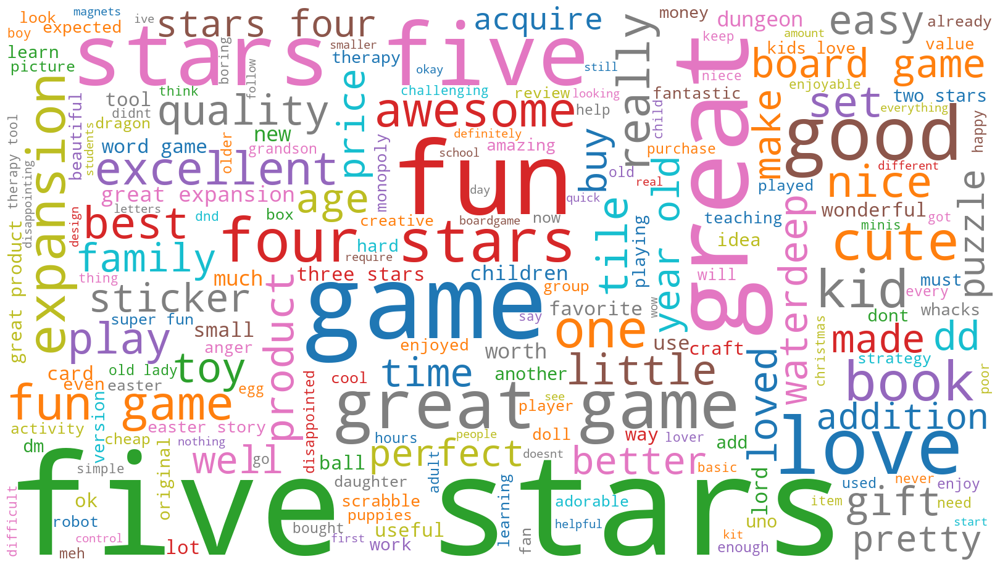

In [283]:
# Convert list of tokens into a string variable.
# Define an empty string variable.
summary_tokens_string = ''

for value in all_summary_tokens:
    # Add each filtered token word to the string.
    summary_tokens_string = summary_tokens_string + value + ' '

generate_wordcloud(summary_tokens_string, 'summary_tokens_wordcloud.png')

* The wordcloud image for the review column shows a large number of prominent stopwords, such as 'five', 'stars', 'and', 'the', and 'fun'.
* The stop words are less predominant mainly because the summary has less text.

## 4. Frequency distribution and polarity
### 4a) Create frequency distribution

In [286]:
# Determine the frequency distribution.
distribution_review = FreqDist(all_review_tokens)

# Preview data.
distribution_review

FreqDist({'the': 5452, 'and': 3234, 'to': 3164, 'a': 3161, 'of': 2488, 'i': 2091, 'it': 2090, 'is': 1782, 'this': 1776, 'game': 1685, ...})

In [287]:
# Determine the frequency distribution for summary tokens.
distribution_summary = FreqDist(all_summary_tokens)

# Preview data.
distribution_summary

FreqDist({'stars': 466, 'five': 381, 'game': 319, 'great': 295, 'the': 261, 'a': 240, 'for': 232, 'fun': 218, 'to': 192, 'and': 168, ...})

In [288]:
# The 20 most common review tokens. 
# Add corresponding frequency counts using Counter class. 
counts_review = pd.DataFrame(Counter(distribution_review).most_common(20),
                      columns=['Word', 'Frequency']).set_index('Word')

# Preview data.
counts_review

,Frequency
Word,
the,5452
and,3234
to,3164
a,3161
of,2488
i,2091
it,2090
is,1782
this,1776


* The resulting frequency distribution of the review column confirms that 19 out of the top 20 words by distribution are stopwords. For example, 'the' appears 5,452 times and 'and' appears 3,234 times.  

### 4b) Remove stopwords

* Non-alphanumeric words were removed using the isalnum() method, at line 250 and 256

In [292]:
# Remove all the stopwords
# Download the stopword list.
# nltk.download ('stopwords')
from nltk.corpus import stopwords

# Create a set of English stopwords.
english_stopwords = set(stopwords.words('english'))

In [293]:
# Create a list of all_review_tokens without stopwords.
review_no_sw = [x for x in all_review_tokens if x.lower() not in english_stopwords]

# Calculate the frequency distribution of review tokens without stopwords.
distribution_review2 = FreqDist(review_no_sw)

# Preview data.
distribution_review2

FreqDist({'game': 1685, 'great': 596, 'fun': 553, 'one': 530, 'play': 502, 'like': 414, 'love': 331, 'really': 319, 'get': 319, 'cards': 301, ...})

In [294]:
# Create a filtered list of all_summary_tokens without stopwords.
summary_no_sw = [x for x in all_summary_tokens if x.lower() not in english_stopwords]

# Re-calculate the frequency distribution of review tokens without stopwords.
distribution_summary2 = FreqDist(summary_no_sw)

# Preview data.
distribution_summary2

FreqDist({'stars': 466, 'five': 381, 'game': 319, 'great': 295, 'fun': 218, 'love': 93, 'good': 92, 'four': 58, 'like': 54, 'expansion': 52, ...})

### 4c) Create wordcloud without stopwords

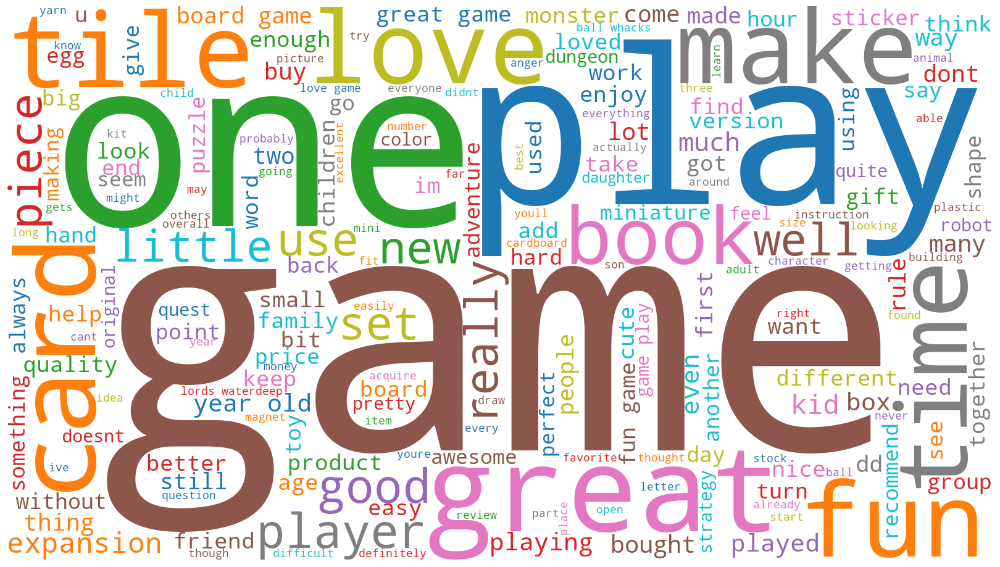

In [296]:
# Define an empty string variable.
review_tokens_string = ''

for value in review_no_sw:
    # Add each filtered token word to the string.
    review_tokens_string = review_tokens_string + value + ' '

generate_wordcloud(review_tokens_string, 'review_tokens_wordcloud.png')

*  We can see that words like 'game,' 'great,' and 'play' are the most prominent in the review column, after removing the stop words. 

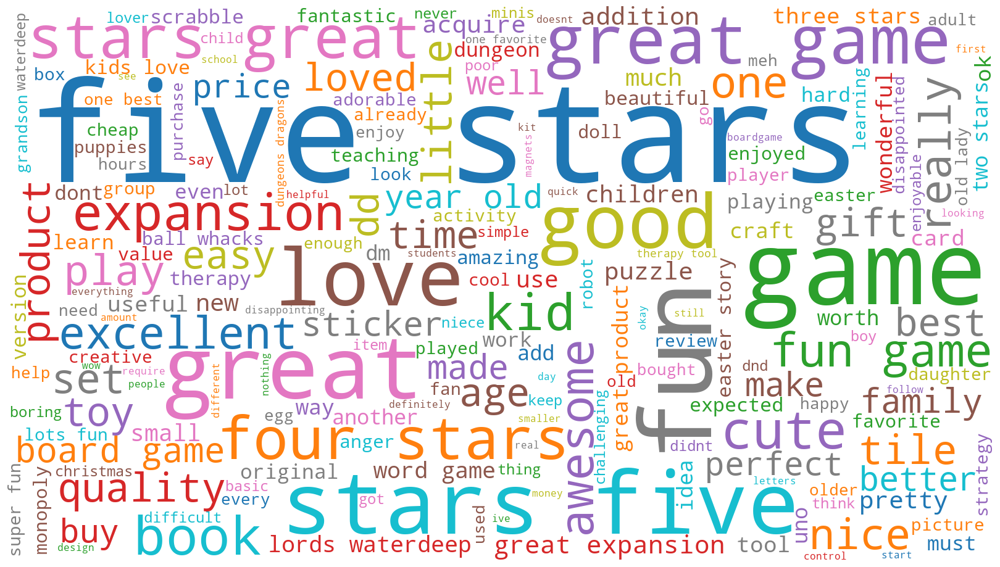

In [298]:
# Define an empty string variable.
summary_tokens_string = ''

for value in summary_no_sw:
    # Add each filtered token word to the string.
    summary_tokens_string = summary_tokens_string + value + ' '

generate_wordcloud(summary_tokens_string, 'summary_tokens_wordcloud.png')

### 4d) Identify 15 most common words and polarity

In [300]:
# Determine the 15 most common words.
# Generate a DataFrame from Counter.
review_counts = pd.DataFrame(Counter(review_no_sw).most_common(15),
                      columns=['Word', 'Frequency']).set_index('Word')

# Preview data.
review_counts

,Frequency
Word,
game,1685
great,596
fun,553
one,530
play,502
like,414
love,331
really,319
get,319


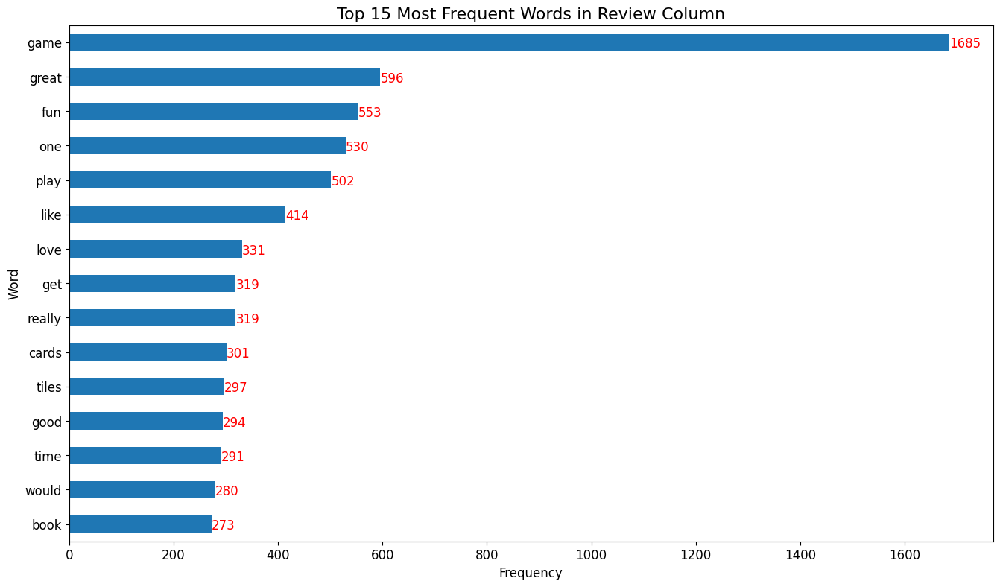

In [301]:
# Sort the DataFrame into descending order. 
review_counts = review_counts.sort_values(by='Frequency', ascending=True)
# Create a horizontal barchart.
ax = review_counts.plot(kind='barh', figsize=(16, 9), fontsize=12, legend=None)

# Set the labels.
ax.set_xlabel('Frequency', fontsize=12)
ax.set_ylabel('Word', fontsize=12)
ax.set_title("Top 15 Most Frequent Words in Review Column", fontsize=16)

# Draw the bar labels.
for i in ax.patches:
    ax.text(i.get_width() + 0.1, i.get_y() + 0.1, str(round((i.get_width()), 2)),
            fontsize=12, color='red')

# Save the plot.
plt.savefig('Review freq.png')   

# See the plot. 
plt.show()

In [302]:
# Determine the 15 most common words in summary tokens without stopwords.
# Generate a DataFrame from Counter.
summary_counts = pd.DataFrame(Counter(summary_no_sw).most_common(15),
                      columns=['Word', 'Frequency']).set_index('Word')

# Preview data.
summary_counts

,Frequency
Word,
stars,466
five,381
game,319
great,295
fun,218
love,93
good,92
four,58
like,54


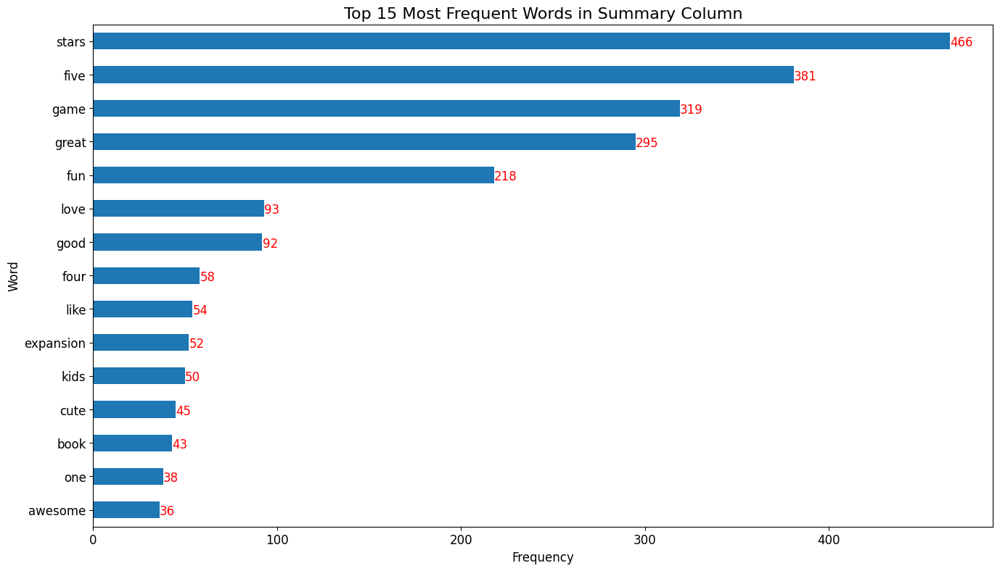

In [303]:
# Sort the DataFrame into descending order. 
summary_counts = summary_counts.sort_values(by='Frequency', ascending=True)

# Create a horizontal barchart.
ax = summary_counts.plot(kind='barh', figsize=(16, 9), fontsize=12, legend=None)

# Set the labels.
ax.set_xlabel('Frequency', fontsize=12)
ax.set_ylabel('Word', fontsize=12)
ax.set_title("Top 15 Most Frequent Words in Summary Column", fontsize=16)

# Draw the bar labels.
for i in ax.patches:
    ax.text(i.get_width() + 0.1, i.get_y() + 0.1, str(round((i.get_width()), 2)),
            fontsize=12, color='red')

# Save the plot.
plt.savefig('Summary_freq.png')   

# See the plot. 
plt.show()

* The most frequent words in both summary and reviews are all positive - this suggests that customers feel very positive about Turtle Game's products.

#### The sentiment polarity o the 15 most common words used

In [306]:
# Use sentiment.polarity method from TextBlob in the review column. 
# Sentiment polarity of each word appended to a list of dictionaries called word_polarity_rv. 
rv_wordcounts = Counter(review_no_sw)
top_rv = dict(rv_wordcounts.most_common(15))
word_polarity_rv = []
for word in top_rv:
    polarity = TextBlob(word).sentiment.polarity
    word_polarity_rv.append({'word': word, 'polarity': polarity})

# Create a Dataframe from the list of dictionaries. 
top15review = pd.DataFrame(word_polarity_rv)

# View the Dataframe.
print(top15review)

      word  polarity
0     game      -0.4
1    great       0.8
2      fun       0.3
3      one       0.0
4     play       0.0
5     like       0.0
6     love       0.5
7   really       0.2
8      get       0.0
9    cards       0.0
10   tiles       0.0
11    good       0.7
12    time       0.0
13   would       0.0
14    book       0.0


*  The polarity of the top 15 words in the review column was analyzed using a for loop along with the '.sentiment.polarity' method from TextBlob. The results were stored in a list of dictionaries, which was then converted into a DataFrame. Notably, the word "game" has a negative polarity of -0.4. Among the words with the highest positive polarity are "great" (0.8), "good" (0.7), and "love" (0.5). Interestingly, more than half of the 15 most frequently used words (9 out of 15) have a neutral polarity of 0.0.

In [308]:
# Use sentiment.polarity method from TextBlob. 
# Sentiment polarity of each word appended to a list of dictionaries called word_polarity_sm. 
# Dictionary created of top 15 most common words using most_common() method from Counter class.
sm_wordcounts = Counter(summary_no_sw)
top_sm = dict(sm_wordcounts.most_common(15))
word_polarity_sm = []
for word in top_sm:
    polarity = TextBlob(word).sentiment.polarity
    word_polarity_sm.append({'word': word, 'polarity': polarity})

# Create a Dataframe from the list of dictionaries
top15summ = pd.DataFrame(word_polarity_sm)

# View the Dataframe.
print(top15summ)

         word  polarity
0       stars       0.0
1        five       0.0
2        game      -0.4
3       great       0.8
4         fun       0.3
5        love       0.5
6        good       0.7
7        four       0.0
8        like       0.0
9   expansion       0.0
10       kids       0.0
11       cute       0.5
12       book       0.0
13        one       0.0
14    awesome       1.0


* The polarity of the top 15 words in the summary column was analyzed using a for loop and the '.sentiment.polarity' method from TextBlob. The results were stored in a list of dictionaries and converted into a DataFrame. Once again, the word "game" has a negative polarity of -0.4. The words with the highest positive polarity include "awesome" (1.0), "great" (0.8), "good" (0.7), "cute" (0.5), and "love" (0.5). More than half of the 15 most common words (8 out of 15) have a neutral polarity of 0.0, including the two most frequently occurring terms, "stars" and "five."

## 5. Review polarity and sentiment: Plot histograms of polarity (use 15 bins) and sentiment scores for the respective columns.

In [311]:
# Determine polarity of both columns. 
df_sentiment['review_polarity'] = df_sentiment['review'].apply(generate_polarity)
df_sentiment['summary_polarity'] = df_sentiment['summary'].apply(generate_polarity)

# View output.
df_sentiment.head()

,review,summary,review_tokens,summary_tokens,review_polarity,summary_polarity
0,when it comes to a dms screen the space on the...,the fact that 50 of this space is wasted on ar...,"[when, it, comes, to, a, dms, screen, the, spa...","[the, fact, that, 50, of, this, space, is, was...",-0.036111,0.15
1,an open letter to galeforce9 your unpainted mi...,another worthless dungeon masters screen from ...,"[an, open, letter, to, galeforce9, your, unpai...","[another, worthless, dungeon, masters, screen,...",0.035952,-0.80
2,nice art nice printing why two panels are fill...,pretty but also pretty useless,"[nice, art, nice, printing, why, two, panels, ...","[pretty, but, also, pretty, useless]",0.116640,0.00
3,amazing buy bought it as a gift for our new dm...,five stars,"[amazing, buy, bought, it, as, a, gift, for, o...","[five, stars]",0.578788,0.00
4,as my review of gf9s previous screens these we...,money trap,"[as, my, review, of, gf9s, previous, screens, ...","[money, trap]",-0.316667,0.00


In [312]:
# Apply the generate_subjectivity user defined function to both columns. 
df_sentiment['review_subjectivity'] = df_sentiment['review'].apply(generate_subjectivity)
df_sentiment['summary_subjectivity'] = df_sentiment['summary'].apply(generate_subjectivity)

# View output.
df_sentiment.head()

,review,summary,review_tokens,summary_tokens,review_polarity,summary_polarity,review_subjectivity,summary_subjectivity
0,when it comes to a dms screen the space on the...,the fact that 50 of this space is wasted on ar...,"[when, it, comes, to, a, dms, screen, the, spa...","[the, fact, that, 50, of, this, space, is, was...",-0.036111,0.15,0.486111,0.500000
1,an open letter to galeforce9 your unpainted mi...,another worthless dungeon masters screen from ...,"[an, open, letter, to, galeforce9, your, unpai...","[another, worthless, dungeon, masters, screen,...",0.035952,-0.80,0.442976,0.900000
2,nice art nice printing why two panels are fill...,pretty but also pretty useless,"[nice, art, nice, printing, why, two, panels, ...","[pretty, but, also, pretty, useless]",0.116640,0.00,0.430435,0.733333
3,amazing buy bought it as a gift for our new dm...,five stars,"[amazing, buy, bought, it, as, a, gift, for, o...","[five, stars]",0.578788,0.00,0.784848,0.000000
4,as my review of gf9s previous screens these we...,money trap,"[as, my, review, of, gf9s, previous, screens, ...","[money, trap]",-0.316667,0.00,0.316667,0.000000


Why use subjectivity in addition to polarity?

Understanding sentiment context → A review might be very positive ("I love this game!"), but if it’s also highly subjective, it means the review is personal rather than a universal fact.

Identifying trustworthy reviews → Low-subjectivity reviews may be more factual and reliable, while high-subjectivity ones might be more emotional or exaggerated.

Comparing factual vs. opinion-heavy reviews → If most reviews are highly subjective, they might reflect personal preferences rather than an objective evaluation of the product.

If you find that highly subjective reviews also have extreme polarity (either very positive or very negative), it may indicate that users are emotionally driven in their reviews.

If reviews with neutral polarity also have low subjectivity, it suggests that the reviews are more balanced and factual.

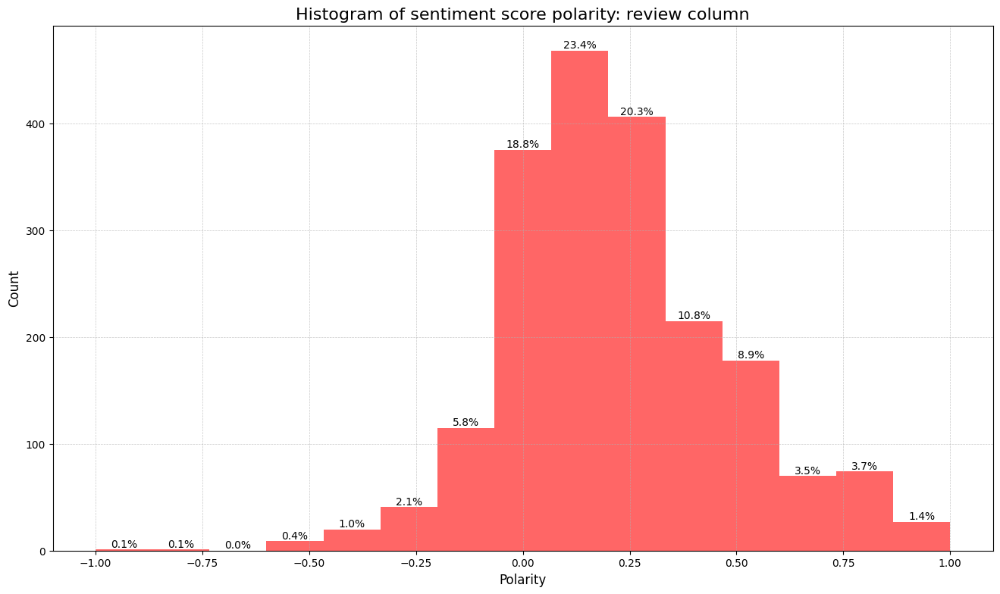

In [314]:
# Review: Create a histogram plot with bins = 15.
# Histogram of polarity

# Set the number of bins
num_bins = 15

# Set the plot area
plt.figure(figsize=(16,9))

# Define the bars.
n, bins, patches = plt.hist(df_sentiment['review_polarity'], num_bins, facecolor='red', alpha=0.6)

# Add percentage labels to each bar.
bin_centers = 0.5 * (bins[:-1] + bins[1:])
for i, bin in enumerate(bins[:-1]):
    plt.text(bin_centers[i], n[i], f'{n[i]/len(df_sentiment)*100:.1f}%', ha='center', va='bottom', fontsize=10)
    
# Set the labels
plt.xlabel('Polarity', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Histogram of sentiment score polarity: review column', fontsize=16)

# Enable grid
plt.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)
   
# Save the plot.
plt.savefig('Review polarity histogram.png')

plt.show()

In [315]:
# Calculate the average polarity score for review.
avg_review_polarity = calculate_avg(df_sentiment, 'review_polarity')

Average review_polarity score: 0.22


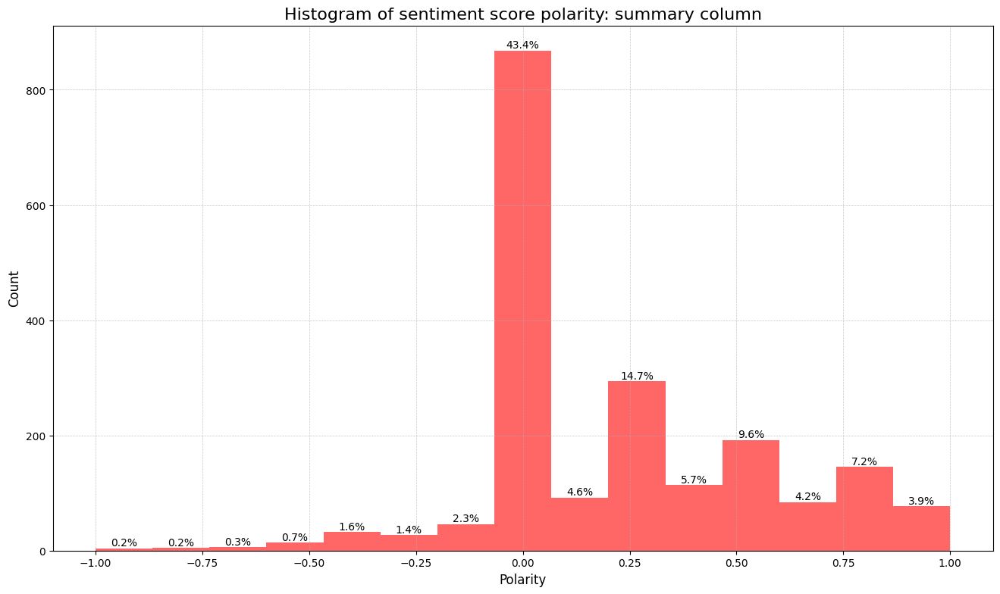

In [316]:
# Summary: Create a histogram plot with bins = 15.
# Histogram of polarity

# Set the number of bins
num_bins = 15

# Set the plot area
plt.figure(figsize=(16,9))

# Define the bars.
n, bins, patches = plt.hist(df_sentiment['summary_polarity'], num_bins, facecolor='red', alpha=0.6)

# Add percentage labels to each bar.
bin_centers = 0.5 * (bins[:-1] + bins[1:])
for i, bin in enumerate(bins[:-1]):
    plt.text(bin_centers[i], n[i], f'{n[i]/len(df_sentiment)*100:.1f}%', ha='center', va='bottom', fontsize=10)
    
# Set the labels
plt.xlabel('Polarity', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Histogram of sentiment score polarity: summary column', fontsize=16)

# Enable grid
plt.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)
   
# Save the plot.
plt.savefig('Summary polarity histogram.png')

plt.show()

In [317]:
# Calculate the average polarity score for summary.
avg_summary_polarity = calculate_avg(df_sentiment, 'summary_polarity')

Average summary_polarity score: 0.22


* The majority of polarity scores for reviews were positive 
* The average polarity score for summaries was 0.22.
* The text blob polarity analysis shows that most reviews and summaries are positive.* 
Thet 'five stars review' - it is rated as neutral when it should be positive, therefore neutral reviews are over-represented.

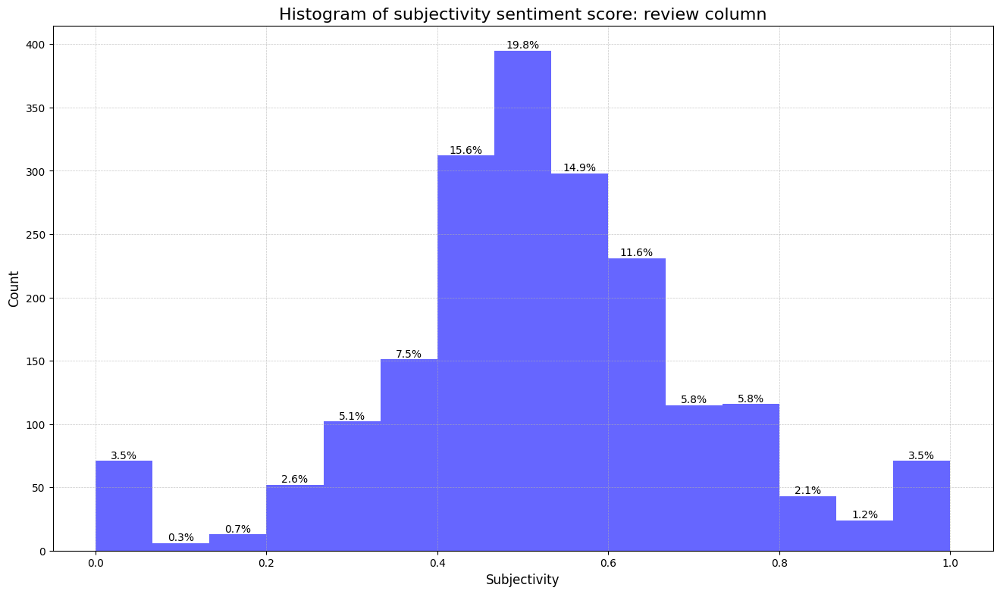

In [319]:
# Create a histogram of sentiment subjectivity for review. 
# Create a histogram plot with bins = 15.

# Set the number of bins
num_bins = 15

# Set the plot area
plt.figure(figsize=(16,9))

# Define the bars.
n, bins, patches = plt.hist(df_sentiment['review_subjectivity'], num_bins, facecolor='blue', alpha=0.6)

# Add percentage labels to each bar.
bin_centers = 0.5 * (bins[:-1] + bins[1:])
for i, bin in enumerate(bins[:-1]):
    plt.text(bin_centers[i], n[i], f'{n[i]/len(df_sentiment)*100:.1f}%', ha='center', va='bottom', fontsize=10)
    
# Set the labels
plt.xlabel('Subjectivity', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Histogram of subjectivity sentiment score: review column', fontsize=16)

# Enable grid
plt.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)
   
# Save the plot.
plt.savefig('Review subjectivity histogram.png')

plt.show()

In [320]:
# Calculate the average subjectivity score for the review column.
avg_review_subjectivity = calculate_avg(df_sentiment, 'review_subjectivity')

Average review_subjectivity score: 0.52


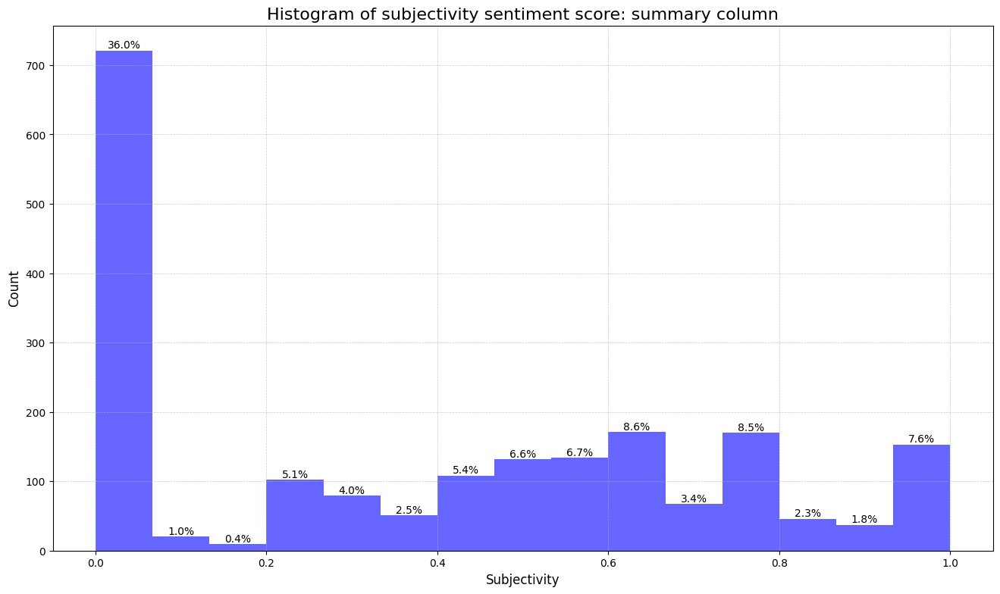

In [321]:
# Create a histogram of sentiment subjectivity for summary. 
# Create a histogram plot with bins = 15.

# Set the number of bins
num_bins = 15

# Set the plot area
plt.figure(figsize=(16,9))

# Define the bars.
n, bins, patches = plt.hist(df_sentiment['summary_subjectivity'], num_bins, facecolor='blue', alpha=0.6)

# Add percentage labels to each bar.
bin_centers = 0.5 * (bins[:-1] + bins[1:])
for i, bin in enumerate(bins[:-1]):
    plt.text(bin_centers[i], n[i], f'{n[i]/len(df_sentiment)*100:.1f}%', ha='center', va='bottom', fontsize=10)
    
# Set the labels
plt.xlabel('Subjectivity', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Histogram of subjectivity sentiment score: summary column', fontsize=16)

# Enable grid
plt.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)
   
# Save the plot.
plt.savefig('Summary subjectivity histogram.png')

plt.show()

In [322]:
# Calculate the average subjectivity score for the summary column.
avg_summary_subjectivity = calculate_avg(df_sentiment, 'summary_subjectivity')

Average summary_subjectivity score: 0.38


* Regarding subjectivity, the review column showed a fairly even distribution of scores, reflected in an average subjectivity score of 0.52. In contrast, the summary column contained a higher proportion of fact-based text (subjectivity score of 0.0), leading to a lower average subjectivity score of 0.39. This reduced subjectivity in summaries is likely due to their concise and factual nature.

Because the polarity sentiment analysis reveals that neutral reviews are over-represented, this may indicate that the sentiment analysis method isn't capturing subtle emotional cues effectively.
* I should use a different sentiment analysis tool  because TextBlob is simple but may not always capture nuanced sentiment.I am considering to try a different analysis tool: VADER (best for for short text)

##### Review colum histograms inights

1. Polarity Sentiment Score Histogram (Red)
* The majority of reviews have a positive polarity score (~70% are above 0).

* A significant portion (~19%) is neutral (close to 0).

* Very few reviews are strongly negative (less than 10% have a polarity below -0.25).

* Most positive reviews have polarity scores below 0.5, meaning that while they lean positive, they aren't extremely enthusiastic.

* The distribution is right-skewed, indicating an overall positive sentiment but with a moderate level of enthusiasm.

Insights & Actions:

* Since most positive reviews are weakly positive, it suggests that customers find the product or service decent but not overwhelmingly great.

* The high proportion of neutral reviews may indicate ambiguous or factual statements rather than strong opinions. A more refined sentiment model (e.g., aspect-based sentiment analysis) could help differentiate these cases.

* If we want to understand what makes reviews lean towards negative or neutral, conducting topic modeling or keyword analysis on neutral/negative reviews could be helpful.

2. Subjectivity Sentiment Score Histogram (Blue)
* The subjectivity scores are fairly evenly distributed, but with a peak around 0.4 - 0.5.

* There is a notable percentage of fully objective reviews (subjectivity = 0), suggesting that many reviews contain factual statements.

* The average subjectivity is around 0.52, meaning the reviews are a mix of fact-based and opinion-based content.

* A small percentage of reviews have very high subjectivity (close to 1), indicating some extremely opinionated or personal reviews.

Insights & Actions:

* Since a significant portion of reviews is factual, they might include neutral product descriptions or reports of experiences rather than emotional reactions.

* The high subjectivity spread suggests a mix of both detailed opinionated reviews and short, fact-based ones. Segmenting the data based on review length might show more patterns.

* If the goal is to gauge customer sentiment beyond just polarity, analyzing the content of highly subjective reviews could provide insights into customer emotions.

Final Takeaways
* Customers generally have a positive but not extremely enthusiastic opinion of the product.

* A high proportion of neutral reviews may indicate a need for better differentiation between weakly positive, neutral, and weakly negative sentiments.

* The balance between subjective and objective reviews suggests a mix of personal experiences and factual statements, which may require further categorization for deeper insights.

#### Sentiment analysis using Vader

In [328]:
# Load a data set with the 2 columns with original capitalisation and punctuation.
df_vader = reviews_clean[['review', 'summary']]

# View DataFrame.
df_vader.head(10)

,review,summary
0,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...
1,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...
2,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless"
3,Amazing buy! Bought it as a gift for our new d...,Five Stars
4,As my review of GF9's previous screens these w...,Money trap
5,Grandson loves,Five Stars
6,"I have bought many gm screens over the years, ...",Best gm screen ever
7,Came in perfect condition.,Five Stars
8,Could be better but its still great. I love th...,Great but could be even better
9,My review will mirror others in that this kind...,Another missed opportunity. Not a value add t...


In [329]:
# Import the vader lexicon and vader class.
# nltk.download('vader_lexicon')
from nltk.sentiment.vader import SentimentIntensityAnalyzer

# Create a variable to store the sia.
sia = SentimentIntensityAnalyzer()

In [330]:
# Calculate compound, positive, neutral and negative scores for review.
df_vader['review_compound'] = [sia.polarity_scores(x)['compound'] for x in df_vader['review']]
df_vader['review_neg'] = [sia.polarity_scores(x)['neg'] for x in df_vader['review']]
df_vader['review_neutral'] = [sia.polarity_scores(x)['neu'] for x in df_vader['review']]
df_vader['review_pos'] = [sia.polarity_scores(x)['pos'] for x in df_vader['review']]

# Visualise the 4 new columns
df_vader[['review','review_compound','review_neg','review_neutral','review_pos']].head()

,review,review_compound,review_neg,review_neutral,review_pos
0,"When it comes to a DM's screen, the space on t...",-0.7406,0.109,0.856,0.035
1,An Open Letter to GaleForce9*:\n\nYour unpaint...,0.9433,0.092,0.703,0.205
2,"Nice art, nice printing. Why two panels are f...",0.6939,0.122,0.723,0.155
3,Amazing buy! Bought it as a gift for our new d...,0.8997,0.000,0.477,0.523
4,As my review of GF9's previous screens these w...,-0.6808,0.203,0.797,0.000


In [331]:
# Calculate compound, positive, neutral and negative scores for summary.
df_vader['summary_compound'] = [sia.polarity_scores(x)['compound'] for x in df_vader['summary']]
df_vader['summary_neg'] = [sia.polarity_scores(x)['neg'] for x in df_vader['summary']]
df_vader['summary_neutral'] = [sia.polarity_scores(x)['neu'] for x in df_vader['summary']]
df_vader['summary_pos'] = [sia.polarity_scores(x)['pos'] for x in df_vader['summary']]

# Visualise the 4 new columns
df_vader[['summary','summary_compound','summary_neg','summary_neutral','summary_pos']].head()

,summary,summary_compound,summary_neg,summary_neutral,summary_pos
0,The fact that 50% of this space is wasted on a...,-0.0711,0.138,0.735,0.126
1,Another worthless Dungeon Master's screen from...,-0.4404,0.326,0.674,0.000
2,"pretty, but also pretty useless",0.4019,0.306,0.165,0.529
3,Five Stars,0.0000,0.000,1.000,0.000
4,Money trap,-0.3182,0.697,0.303,0.000


In [332]:
# Create a copy of df_sentiment
df_vader_updated = df_vader.copy()

# Apply sentiment labeling functions to create new columns
df_vader_updated['vader_sentiment_review'] = df_vader_updated['review_compound'].apply(get_sentiment_label)
df_vader_updated['vader_sentiment_summary'] = df_vader_updated['summary_compound'].apply(get_sentiment_label)

# Display the updated DataFrame
df_vader_updated.head()

,review,summary,review_compound,review_neg,review_neutral,review_pos,summary_compound,summary_neg,summary_neutral,summary_pos,vader_sentiment_review,vader_sentiment_summary
0,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...,-0.7406,0.109,0.856,0.035,-0.0711,0.138,0.735,0.126,Negative,Negative
1,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...,0.9433,0.092,0.703,0.205,-0.4404,0.326,0.674,0.000,Positive,Negative
2,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless",0.6939,0.122,0.723,0.155,0.4019,0.306,0.165,0.529,Positive,Positive
3,Amazing buy! Bought it as a gift for our new d...,Five Stars,0.8997,0.000,0.477,0.523,0.0000,0.000,1.000,0.000,Positive,Neutral
4,As my review of GF9's previous screens these w...,Money trap,-0.6808,0.203,0.797,0.000,-0.3182,0.697,0.303,0.000,Negative,Negative


* Vader Sentiment Analysis struggle to detect five-star ratings as positive comments, while wrongly labeling row 3 as neutral.     This suggests that neutral summary comments might be overrepresented.

##### Visualise Sentiment - Review vs Summary

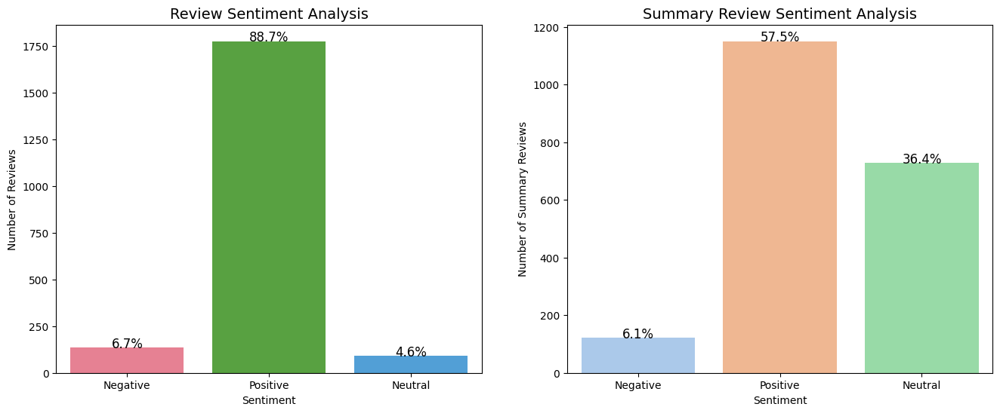

In [335]:
# Set the figure size and create subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Create Countplot to display review sentiment
sns.countplot(x='vader_sentiment_review', data=df_vader_updated, palette= 'husl', ax=ax1)

# Set title and labels for ax1
ax1.set_title('Review Sentiment Analysis', fontsize=14)
ax1.set_xlabel('Sentiment')
ax1.set_ylabel('Number of Reviews')

# Annotate countplot for ax1
total_reviews = len(df_vader_updated['vader_sentiment_review'])
for p in ax1.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height() / total_reviews)
    x = p.get_x() + p.get_width() / 2
    y = p.get_height()
    ax1.annotate(percentage, (x, y), ha='center', fontsize=12)

# Create Countplot to display summary review sentiment
sns.countplot(x='vader_sentiment_summary', data=df_vader_updated, palette='pastel' ,ax=ax2)

# Set title and labels for ax2
ax2.set_title('Summary Review Sentiment Analysis', fontsize=14)
ax2.set_xlabel('Sentiment')
ax2.set_ylabel('Number of Summary Reviews')

# Annotate countplot for ax2
total_summary_reviews = len(df_vader_updated['vader_sentiment_summary'])
for p in ax2.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height() / total_summary_reviews)
    x = p.get_x() + p.get_width() / 2
    y = p.get_height()
    ax2.annotate(percentage, (x, y), ha='center', fontsize=12)

plt.show()

* The VADER sentiment analysis of summary reviews identified a greater proportion of neutral sentiment compared to full reviews. This difference could be attributed to the concise nature of summary reviews, which may result in a more neutral tone. In contrast, full reviews provide more detailed and expressive content, leading to a stronger positive sentiment.

In [337]:
# Create Subset 
df_vader_text = df_vader_updated[['review', 'summary','vader_sentiment_review', 'vader_sentiment_summary']]

In [338]:
# Call the function and create two columns with polarity and subjectivity data. 
#df_vader_text[['review_polarity', 'review_subjectivity']] = df_vader_text['review']\
#.apply(polarity).apply(pd.Series)

#df_vader_text.head()
# Apply TextBlob sentiment analysis directly using lambda
df_vader_text['review_polarity'] = df_vader_text['review'].apply(lambda x: TextBlob(x).sentiment.polarity)
df_vader_text['review_subjectivity'] = df_vader_text['review'].apply(lambda x: TextBlob(x).sentiment.subjectivity)

# Display first few rows
df_vader_text.head()

,review,summary,vader_sentiment_review,vader_sentiment_summary,review_polarity,review_subjectivity
0,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...,Negative,Negative,-0.036111,0.486111
1,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...,Positive,Negative,0.035952,0.442976
2,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless",Positive,Positive,0.116640,0.430435
3,Amazing buy! Bought it as a gift for our new d...,Five Stars,Positive,Neutral,0.628788,0.784848
4,As my review of GF9's previous screens these w...,Money trap,Negative,Negative,-0.316667,0.316667


In [339]:
# Categorise polarity score  
df_vader_text['sentiment_labels_blob']= df_vader_text['review_polarity'].apply(get_blob_sentiment)
 
# Call the functions to obtain polarity and subjectivy score category columns
df_vader_text['sentiment_labels_blob']= df_vader_text['review_polarity'].apply(get_blob_sentiment)
df_vader_text['subjectivity_labels_blob']= df_vader_text['review_subjectivity'].apply(get_blob_sentiment)

df_vader_text.head()

,review,summary,vader_sentiment_review,vader_sentiment_summary,review_polarity,review_subjectivity,sentiment_labels_blob,subjectivity_labels_blob
0,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...,Negative,Negative,-0.036111,0.486111,Negative,Positive
1,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...,Positive,Negative,0.035952,0.442976,Positive,Positive
2,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless",Positive,Positive,0.116640,0.430435,Positive,Positive
3,Amazing buy! Bought it as a gift for our new d...,Five Stars,Positive,Neutral,0.628788,0.784848,Positive,Positive
4,As my review of GF9's previous screens these w...,Money trap,Negative,Negative,-0.316667,0.316667,Negative,Positive


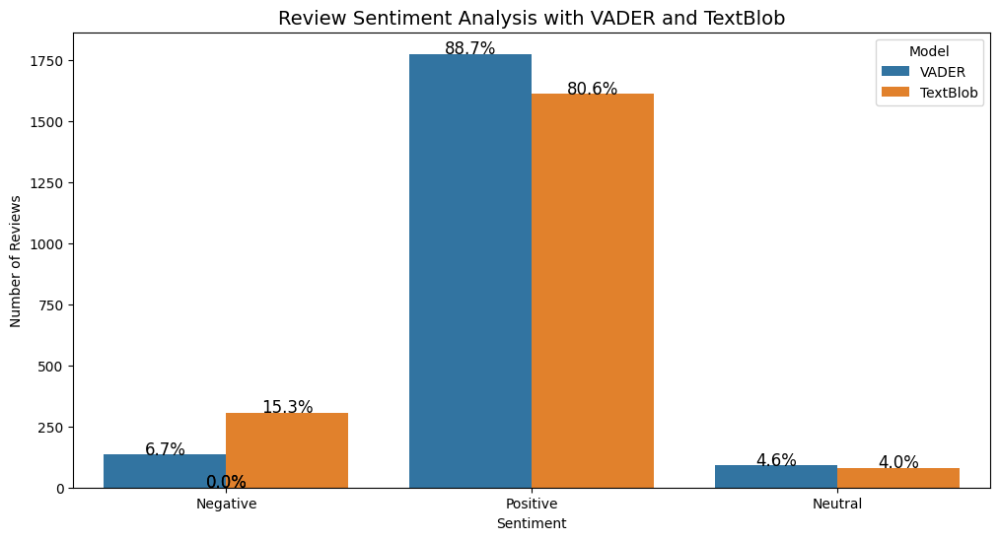

In [340]:
# Set the figure size
plt.figure(figsize=(12, 6))

# Melt the DataFrame to have a single column for sentiments and another for the model type
df_melted = df_vader_text.melt(value_vars=['vader_sentiment_review', 'sentiment_labels_blob'], 
                                      var_name='Model', 
                                      value_name='Sentiment')

# Create a Countplot with hue to display review sentiment
sns.countplot(x='Sentiment', hue='Model', data=df_melted)

# Set title and labels
plt.title('Review Sentiment Analysis with VADER and TextBlob', fontsize=14)
plt.xlabel('Sentiment')
plt.ylabel('Number of Reviews')

# Annotate countplot
for p in plt.gca().patches:
    height = p.get_height()
    model = 'vader_sentiment_review' if 'VADER' in p.get_label() else 'sentiment_labels_blob'
    total_reviews = len(df_melted[df_melted['Model'] == model])
    percentage = '{:.1f}%'.format(100 * height / total_reviews)
    x = p.get_x() + p.get_width() / 2
    y = p.get_height()
    plt.annotate(percentage, (x, y), ha='center', fontsize=12)

plt.legend(title='Model',labels=['VADER', 'TextBlob'])

# Save fig.
plt.savefig('Review Sentiment Analysis with VADER and TextBlob.png')

# Show plot
plt.show()

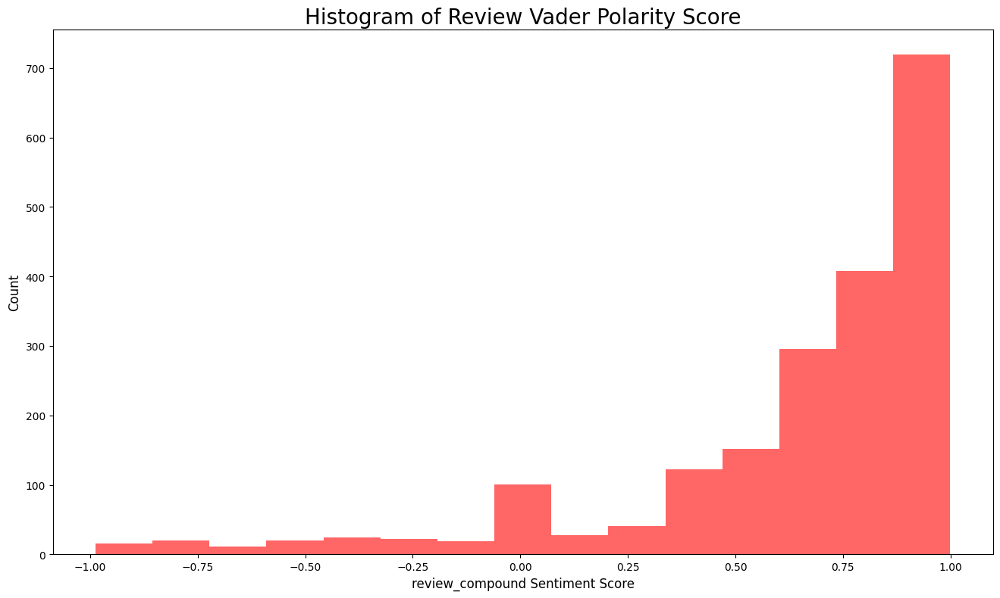

In [341]:
plot_sentiment_histogram(df_vader, 'review_compound', num_bins=15, color='red', title='Histogram of Review Vader Polarity Score')

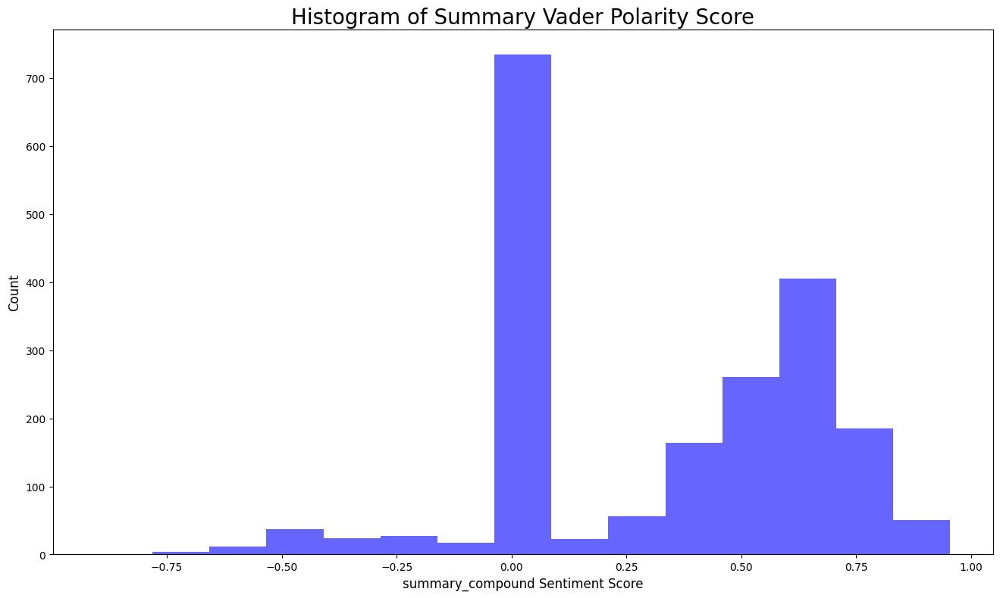

In [342]:
plot_sentiment_histogram(df_vader, 'summary_compound', num_bins=15, color='blue', title='Histogram of Summary Vader Polarity Score')

In [343]:
# See how many records have 'Five Star' comments.
df_vader[df_vader['summary'] == 'Five Stars'].shape[0]

378

In [344]:
df_vader[df_vader['summary'] == 'Five Stars']

,review,summary,review_compound,review_neg,review_neutral,review_pos,summary_compound,summary_neg,summary_neutral,summary_pos
3,Amazing buy! Bought it as a gift for our new d...,Five Stars,0.8997,0.0,0.477,0.523,0.0,0.0,1.0,0.0
5,Grandson loves,Five Stars,0.5719,0.0,0.213,0.787,0.0,0.0,1.0,0.0
7,Came in perfect condition.,Five Stars,0.5719,0.0,0.448,0.552,0.0,0.0,1.0,0.0
10,Works very well,Five Stars,0.3384,0.0,0.455,0.545,0.0,0.0,1.0,0.0
15,Very fun game for my family,Five Stars,0.5563,0.0,0.582,0.418,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...
1972,OK,Five Stars,0.2960,0.0,0.000,1.000,0.0,0.0,1.0,0.0
1973,Great quick entertaining game. Love it!,Five Stars,0.9098,0.0,0.207,0.793,0.0,0.0,1.0,0.0
1976,It is great!!!,Five Stars,0.7163,0.0,0.287,0.713,0.0,0.0,1.0,0.0
1985,"such a fun game, our families favorite",Five Stars,0.7430,0.0,0.388,0.612,0.0,0.0,1.0,0.0


* I will remove the 'Five Stars' rows from the summary and I will replot the hystogram to check how much it's afftected

In [346]:
df5 = df_vader.loc[df_vader['summary'] != 'Five Stars']

# View the DataFrame
df5[['summary']].head(20)

,summary
0,The fact that 50% of this space is wasted on a...
1,Another worthless Dungeon Master's screen from...
2,"pretty, but also pretty useless"
4,Money trap
6,Best gm screen ever
8,Great but could be even better
9,Another missed opportunity. Not a value add t...
11,Love the map!
12,Not a general DM screen
13,Very weak game


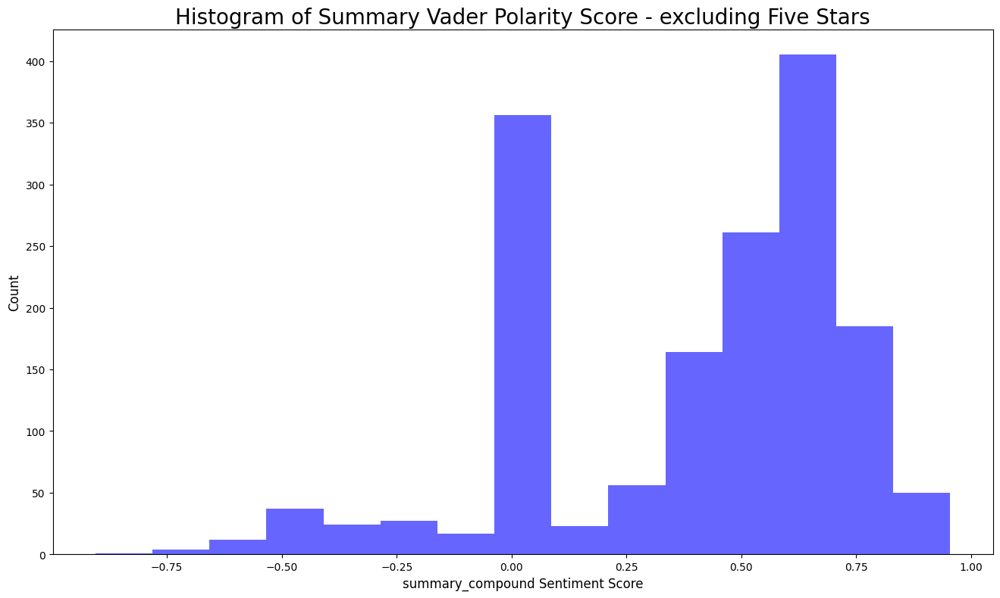

In [347]:
plot_sentiment_histogram(df5, 'summary_compound', num_bins=15, color='blue', title='Histogram of Summary Vader Polarity Score - excluding Five Stars')

Because after the hystogram plot things are still not clear about the neutral summary rows, I will look more in detail at the text

In [349]:
for summary in df5[df5['summary_compound'] == 0]['summary'].tolist():
    print(summary)

Not a general DM screen
Fell completely flat...
Buckley was a card mommer
Not enough product
Four Stars
Four Stars
Three Stars
tiny book
Just sticker at a premium
Tiny
Worked for a trip, Only a few pages
Four Stars
Should be a buck at Dollar Store!
Small book
Four Stars
robot
One Star
Won't keep them occupied for long
Smaller than thought
Size is off
This is a little sticker book for a little kid?
Hours of entertaintment.
Robot Time
Stickers
Smallest Activity book EVER
Small sized...
Lots of fun...
Not as advertised
Smaller than life.
Robot
Junk
Eh
My five year old grandson, my wife, and ...
Two Stars
I have always been able to draw what i saw ...
Box wasn't new
Four Stars
INCOMPLETE KIT!
Incomplete
Four Stars
Pom Pom Puppies
Four Stars
Would not buy again.
Four Stars
Two Stars
Three Stars
Kids from 4-11 used these on a family vacation. ...
Three Stars
Two Stars
Four Stars
Four Stars
Four Stars
3 stars
Four Stars
Four Stars
Too complicated for children to do on their own!
Klutz Pom-Pom

* Looking the summary reviews with a compound sentiment score of 0 reveals that many could be interpreted by a human as either positive (e.g., Five Stars) or negative (e.g., Would not buy again). This highlights the limitations of sentiment analysis, particularly when using the VADER Sentiment Analyzer.

##### To check the accuracy of the snetiment analysis I will look at the relationship between review and summary compound scores

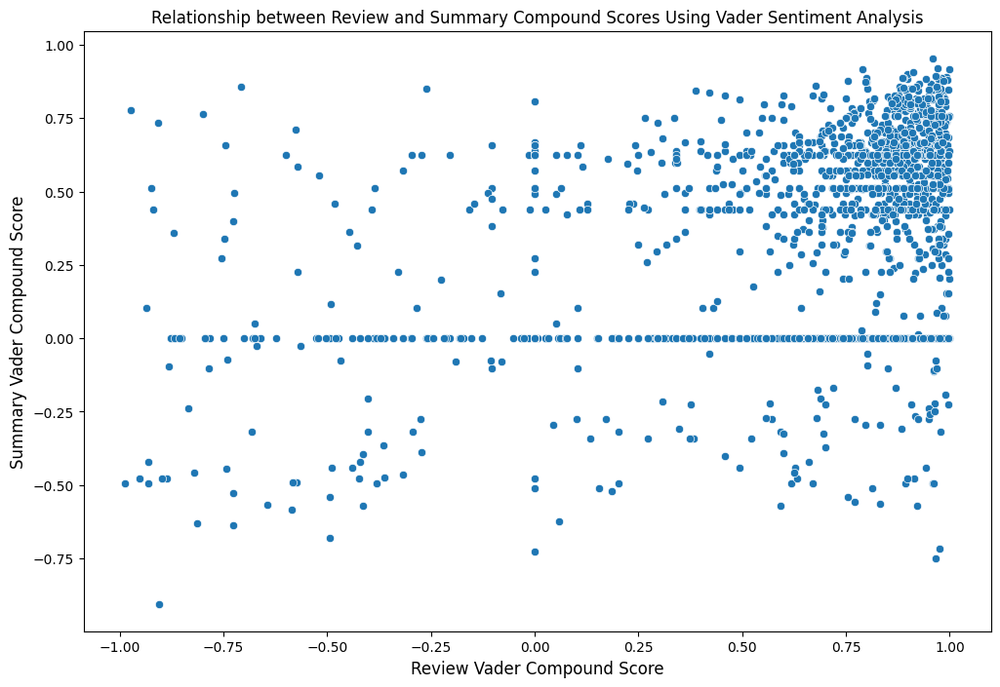

In [352]:
# Plot review and summary Vader compound scores.
plt.figure(figsize=(12,8))
sns.scatterplot(data=df_vader, x='review_compound', y='summary_compound')

# Set the labels.
plt.xlabel('Review Vader Compound Score', fontsize=12)
plt.ylabel('Summary Vader Compound Score', fontsize=12)
plt.title("Relationship between Review and Summary Compound Scores Using Vader Sentiment Analysis", fontsize=12);

# Save fig
plt.savefig('vader_compound_scatter.png')

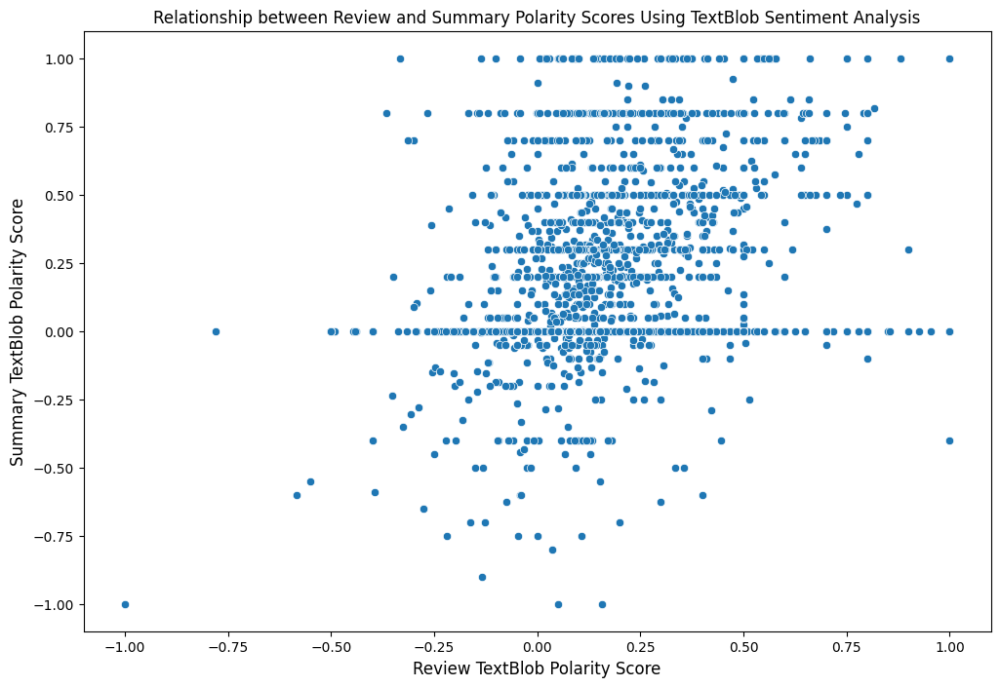

In [353]:
# Plot review and summary TextBlob compound scores.
plt.figure(figsize=(12,8))
sns.scatterplot(data=df_sentiment, x='review_polarity', y='summary_polarity')

# Set the labels.
plt.xlabel('Review TextBlob Polarity Score', fontsize=12)
plt.ylabel('Summary TextBlob Polarity Score', fontsize=12)
plt.title("Relationship between Review and Summary Polarity Scores Using TextBlob Sentiment Analysis", fontsize=12);

# Save fig
plt.savefig('TextBlob_polarity_scatter.png')

* The limitations of the sentiment analysis become apparent when examining scatter plots comparing reviews and summaries for both Vader and TextBlob. If sentiments were accurately assigned, a strong positive correlation would be expected, but this is not the case.
* The relationship between the two variables is more noticeable in the TextBlob analysis.

## 6. Identify top 20 positive and negative reviews and summaries respectively

In [356]:
# Top 20 negative reviews.
negative_reviews = df_vader.nsmallest(20, 'review_compound')

# View output.
# Set column width to display longer text
pd.set_option('display.max_colwidth', None)
negative_reviews[['review']]

review
1119  Here is my review, cross-posted from boardgamegeek.com:\n\nI have fond memories of D&D from my youth, that I occasionally attempt to recapture. I remember the sense of vague foreboding conjured by RPG-like board games such as Runequest and Spacehulk. I had read some favorable reviews of the new "RPG-as-boardgame" series promoted by Wizards on the Coast, and I was excited to try this. I splunked down my hard-earned cash and amazon duly delivered a hefty box of dreams to my doorstep.\n\nWrath of Ashardalon and I had some good times initially. My friends and I gamely punched all the cardboard pieces out of the sprues. We love punching pieces out of sprues! It inspires a sense of childlike wonder and anticipation in us! This tile has a Horrid Chamber on it! That dungeon tile has dead bodies! Ooh, I wonder what a flaming sphere does? These cards all have various powers and spells on them! Look, you can play a dragon character! And the plastic figurines were enjoyable, similar to those plastic dinosaurs we all had as kids. Whee!\n\nSadly, that was the best part of the game. Everything went downhill when we actually started to play.\n\nThe game itself is a reductionist vision of a dungeon crawl. It is, unfortunately, so reductionist that is effectively a game of Munchkin, but without a sense of humor. I think the game designers must have sensed this, and to try to add a sense of danger and urgency to the game, they created a deck of sadistic Encounter cards to punish us for playing. (But more about those later.)\n\nThe players progress through the dungeon together. At every unexplored edge, they "kick down the door" and grow the dungeon by one (1) new dungeon tile, guaranteed to contain exactly one (1) new monster, and possible an Encounter card (which is invariably unpleasant). This game might have been interesting if every new corner of the dungeon had produced a novel challenge for the players to make strategic decisions about together. Instead, the players typically have one power which is the min-max best option for any given monster, and they use it, over and over again. The twenty-sided die is rolled. The monster advances. It does a hit point of damage to the wizard! And then it dies. And drops a treasure.\n\nIt's difficult to be heroic in this game. The characters are punished for pushing forward into the darkness. They are also punished for standing still. They are punished for gathering together on one tile, and they are punished for spreading out. There are precious few strategic decisions to be made in this game.\n\nAll of this is incredibly tedious and dull. I magic missile the darkness.\n\nThe power cards feel poorly thought out, poorly worded, and disappointing. The "Hypnosis" card, seems promising: it can cause one monster to attack another! My goodness, a card that allows the players to turn the dungeon against itself! Strategy! But no. Unlike the Scroll of Monster Control item, which replaces a monster's attack on the players, Hypnosis simply supplements the monster's action with it's "hypnotized" attack. But can the power at least let the players turn the Cave Bear's awesome Claws attack against the Kobold horde? No, not really. The monster's attack is reduced to a standardized "Attack +9, Damage 1," as printed on the card. Really, this card is a +9, 1 damage attack that only works if two monsters are in the same room. Is this what the game designers intended? Who knows! But hey, that's what it says on the card.\n\nIf the player's powers are boring, at least the game designers also gave us Encounter cards. We scrubbed through the rules multiple times, certain we were misinterpreting them. But no: every player will typically draw at least one encounter card every turn. Thus, a four-player band of characters fighting a monster will typically draw four encounter cards every round of combat. Sadly, the encounter cards aren't terribly creative. They all seem to be variants of "Random thing happens! And ever

* A consistent part of top negative reviews are false negatives (For ex rows 459, 1797, 852) 

In [358]:
negative_reviews.head()

review  \
1119  Here is my review, cross-posted from boardgamegeek.com:\n\nI have fond memories of D&D from my youth, that I occasionally attempt to recapture. I remember the sense of vague foreboding conjured by RPG-like board games such as Runequest and Spacehulk. I had read some favorable reviews of the new "RPG-as-boardgame" series promoted by Wizards on the Coast, and I was excited to try this. I splunked down my hard-earned cash and amazon duly delivered a hefty box of dreams to my doorstep.\n\nWrath of Ashardalon and I had some good times initially. My friends and I gamely punched all the cardboard pieces out of the sprues. We love punching pieces out of sprues! It inspires a sense of childlike wonder and anticipation in us! This tile has a Horrid Chamber on it! That dungeon tile has dead bodies! Ooh, I wonder what a flaming sphere does? These cards all have various powers and spells on them! Look, you can play a dragon character! And the plastic figurines were enjoyable, similar to those plastic dinosaurs we all had as kids. Whee!\n\nSadly, that was the best part of the game. Everything went downhill when we actually started to play.\n\nThe game itself is a reductionist vision of a dungeon crawl. It is, unfortunately, so reductionist that is effectively a game of Munchkin, but without a sense of humor. I think the game designers must have sensed this, and to try to add a sense of danger and urgency to the game, they created a deck of sadistic Encounter cards to punish us for playing. (But more about those later.)\n\nThe players progress through the dungeon together. At every unexplored edge, they "kick down the door" and grow the dungeon by one (1) new dungeon tile, guaranteed to contain exactly one (1) new monster, and possible an Encounter card (which is invariably unpleasant). This game might have been interesting if every new corner of the dungeon had produced a novel challenge for the players to make strategic decisions about together. Instead, the players typically have one power which is the min-max best option for any given monster, and they use it, over and over again. The twenty-sided die is rolled. The monster advances. It does a hit point of damage to the wizard! And then it dies. And drops a treasure.\n\nIt's difficult to be heroic in this game. The characters are punished for pushing forward into the darkness. They are also punished for standing still. They are punished for gathering together on one tile, and they are punished for spreading out. There are precious few strategic decisions to be made in this game.\n\nAll of this is incredibly tedious and dull. I magic missile the darkness.\n\nThe power cards feel poorly thought out, poorly worded, and disappointing. The "Hypnosis" card, seems promising: it can cause one monster to attack another! My goodness, a card that allows the players to turn the dungeon against itself! Strategy! But no. Unlike the Scroll of Monster Control item, which replaces a monster's attack on the players, Hypnosis simply supplements the monster's action with it's "hypnotized" attack. But can the power at least let the players turn the Cave Bear's awesome Claws attack against the Kobold horde? No, not really. The monster's attack is reduced to a standardized "Attack +9, Damage 1," as printed on the card. Really, this card is a +9, 1 damage attack that only works if two monsters are in the same room. Is this what the game designers intended? Who knows! But hey, that's what it says on the card.\n\nIf the player's powers are boring, at least the game designers also gave us Encounter cards. We scrubbed through the rules multiple times, certain we were misinterpreting them. But no: every player will typically draw at least one encounter card every turn. Thus, a four-player band of characters fighting a monster will typically draw four encounter cards every round of combat. Sadly, the encounter cards aren't terribly creative. They all seem to be variants of "Random thing happens! And e

In [359]:
# Top 20 negative summaries.
negative_summary = df_vader.nsmallest(20, 'summary_compound')

# View output.
# Set column width to display longer text
pd.set_option('display.max_colwidth', None)
negative_summary[['summary']]

,summary
882,"A crappy cardboard ghost of the original. Hard to believe they did this, but they did. Shame on Hasbro. Disgusting."
1565,"The TARDIS, The Doctor, River Song, Amy, Rory Fight Every Enemy - In Cards!"
947,No 20 sided die
328,Defective- poor QC
1003,Then you will find this board game to be dumb and boring
1166,before this I hated running any RPG campaign dealing with towns because it ...
426,but it gets repetitive and the students start to get bored after about half a round
847,Worst quality adult board game I've even seen
173,Horrible! Nothing more to say Would give zero stars ...
364,Anger Control game


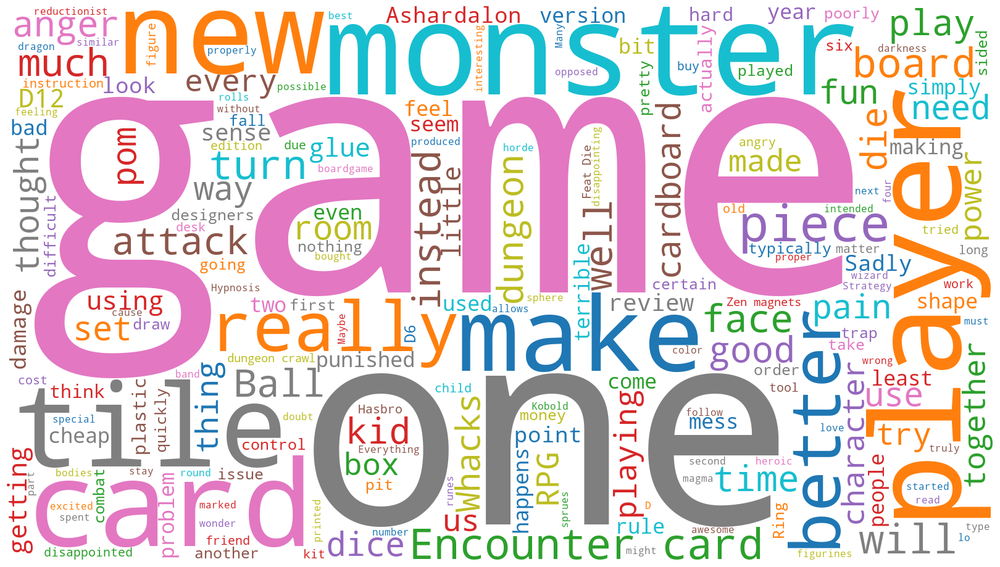

In [360]:
# Create Wordcloud 

text = ' '.join([word for word in negative_reviews['review']])

generate_wordcloud(text, 'negative_wordcloud.png')

* Our analysis shows that many negative reviews center around board games, cards, product quality and usefulness. While word cloud analysis helps highlight key discussion topics, it does not reveal which specific products are being criticized.

##### Identify negative reviews in proportion to total review per product

In [363]:
df_sentiment_updated = pd.read_csv('reviews.csv')

In [364]:
df_sentiment_updated['review_polarity'] = df_sentiment_updated['review'].apply(generate_polarity)
df_sentiment_updated['sentiment_labels_blob']= df_sentiment_updated['review_polarity'].apply(get_blob_sentiment)

In [365]:
# Append predicted clusters on review data
df_sentiment_updated['label']= df3["K-Means Predicted"]

# Create a new column with descriptive names, replace label values with map function 
df_sentiment_updated['marketing_labels'] = df_sentiment_updated.label.map(marketing_labels)

In [366]:
df_sentiment_updated.head()

,gender,age,income,spending_score,loyalty_points,education,product,review,summary,review_polarity,sentiment_labels_blob,label,marketing_labels
0,Male,18,12.30,39,210,graduate,453,"When it comes to a DM's screen, the space on the screen itself is at an absolute premium. The fact that 50% of this space is wasted on art (and not terribly informative or needed art as well) makes it completely useless. The only reason that I gave it 2 stars and not 1 was that, technically speaking, it can at least still stand up to block your notes and dice rolls. Other than that, it drops the ball completely.",The fact that 50% of this space is wasted on art (and not terribly informative or needed art ...,-0.036111,Negative,4,Low Income - Low Spending
1,Male,23,12.30,81,524,graduate,466,"An Open Letter to GaleForce9*:\n\nYour unpainted miniatures are very not bad. Your spell cards are great. Your board games are ""meh"". Your DM screens, however, are freaking terrible. I'm still waiting for a single screen that isn't polluted with pointless artwork where useful, reference-able tables should be. Once again, you've created a single use screen that is only useful when running the ""Storm King's Thunder"" adventure. Even despite the fact that it's geared to that adventure path, it's usefulness negligible, at best. I massive swath of the inner panel is wasted on artwork and a bloated overland map, which could have been easily reduced to a single panel in size. And the few table you have are nigh-useless themselves.\n\nIn short, stop making crap DM screens.",Another worthless Dungeon Master's screen from GaleForce9,0.035952,Positive,3,Low Income - High Spending
2,Female,22,13.12,6,40,graduate,254,"Nice art, nice printing. Why two panels are filled with a general Forgotten Realms map is beyond me. Most of one of them is all blue ocean. Such a waste.\n\nI don't understand why they can't make these DM Screens more useful for these ""kinds of adventures"" rather than solely the specific adventure. You're supposed to be able to transpose this adventure to other lands outside the Forgotten Realms. So even just a list of new monsters or NPCs would at least be useful than the map. Even more would just be stuff related to running the game but broad-use stuff related to giants.\n\nSame thing with Curse of Strahd. Why not make it useful for raven loft, undead or horror campaigns in general... instead a huge amount of screen space is solely mapping out Castle Ravenloft, which is only useful during a small fraction of the time even for the Curse of Strahd adventure, let alone various other Ravenloft adventuring.\n\nThey really kill the extended use of these screens by not thinking about their potential use, both for the adventure in question, as well as use in a broader sense.\n\nThe Rage of Demons screen is far more useful for broad under dark adventuring - covering a lot of rules for the various conditions you may suffer... and the map is only one panel.\n\nThis Storm Giants one is decent for a few tables it includes - but really misses the mark. Maybe they should ask a few DMs what they would use?","pretty, but also pretty useless",0.116640,Positive,4,Low Income - Low Spending
3,Female,25,13.12,77,562,graduate,263,Amazing buy! Bought it as a gift for our new dm and it's perfect!,Five Stars,0.628788,Positive,3,Low Income - High Spending
4,Female,33,13.94,40,366,graduate,291,"As my review of GF9's previous screens these were completely unnecessary and nearly useless. Skip them, this is the definition of a waste of money.",Money trap,-0.316667,Negative,4,Low Income - Low Spending


In [367]:
# Count of reviews per product
reviews_by_product = df_sentiment_updated.groupby('product').size().reset_index(name='total_review_count')

# Group negative reviews by products
neg_rev_by_product = df_sentiment_updated[df_sentiment_updated['sentiment_labels_blob'] == 'Negative']\
.groupby('product').size().reset_index(name='negative_review_count')

# Merge negative reviews and reviews count (left join)
reviews_by_product = pd.merge(neg_rev_by_product, reviews_by_product, on='product')

# Calculate the proportion of negative reviews
reviews_by_product['negative_review_proportion'] = reviews_by_product['negative_review_count'] / reviews_by_product['total_review_count']

# Sort the result by 'negative_review_proportion' in descending order
reviews_by_product.sort_values(by='negative_review_proportion', ascending=False).head(10)

,product,negative_review_count,total_review_count,negative_review_proportion
116,6431,5,10,0.5
90,4399,5,10,0.5
145,9597,5,10,0.5
106,5512,5,10,0.5
53,2387,5,10,0.5
10,486,4,10,0.4
3,231,4,10,0.4
58,2795,4,10,0.4
64,2870,4,10,0.4
72,3436,4,10,0.4


* Because there might be false negatives in the reviews I am going to check 2 random products to see if this approach is leading somewhere

In [369]:
# Check reviews for product 4399
prod_4399 = df_sentiment_updated[df_sentiment_updated['product'] == 4399][['product', 'review']]
prod_4399.style.set_properties(subset=['review'], **{'width': '1200px'})

,product,review
186,4399,Hard to put together.
385,4399,Great game to play for children and any other people that has anger issues.
585,4399,"I am so excited to have found the Easter Story Egg! I was looking for a Christ centered tradition to help my boys understand the true meaning of the Easter holiday when I came across the Easter Story Egg. We are all looking forward to reading each of the seven stories, opening the corresponding eggs and explaining the significance this Easter. The hardbound book and wooden eggs are high quality, and I look forward to many years of this meaningful tradition with my boys."
782,4399,Not as sturdy as the other versions but it works.
978,4399,"Worth the price for the wealth of plastic miniatures alone (see attached photograph). The box also includes some nice, thick punch-out dungeon map tiles that lock together like puzzle pieces. The 4e-based board game's a nice bonus feature as far as I'm concerned."
1173,4399,got this game and ordered another one right away. cant wait to collect and play them all. would recommend this vender.
1367,4399,"A must-have expansion set for LoW. But once you get this expansion, you'll most likely never go back to the original game set. It unlocks the potential of LoW and really makes it enjoyable. I couldn't imagine playing LoW without this expansion! You can't play this on its own; it can only be added to Lords of Waterdeep game for extra enjoyment. Highly recommended for families; we scoff at games like this in the past, but now our family & extended families are hooked and we play no matter where we visit! Lots of enjoyment!"
1560,4399,After the usual round of discussing the rules the game was under way. Shuffle really good or action takes a while.
1749,4399,not bad for couple days after that my kids lost interest now they lost some parts anyway it's ok for a week or two for kids every piece was functioning good i mean magnetic
1958,4399,you need some wild cards


In [370]:
# Check reviews for product 9597
prod_9597 = df_sentiment_updated[df_sentiment_updated['product'] == 9597][['product', 'review']]
prod_9597.style.set_properties(subset=['review'], **{'width': '1200px'})

,product,review
74,9597,"Although $1.99 isn't much, it was disappointing to see this small booklet (4 pages) of stickers. Should have read details more closely."
273,9597,Cute idea - horrible execution. If you want your child in tears then this is your book. My seven year old got very frustrated with this whole thing.
473,9597,I am a school social worker and use this game with 4th-8th graders.
670,9597,"Love these magnets, they are adorable! Just a little pricey and not a good assortment of the alphabet; came with one of every letter but gave doubles of not most commonly used letters. Had to come back and by more sets to have all the letters I needed. Would still recommend these."
866,9597,"If you have never played Acquire know that this negative review is not of the way the game is played. Acquire is hands down my favorite board game. With that being said... Spend a little more money on an older version of the game where the board and pieces are plastic. The cardboard pieces of this game will not hold up to use and will slide around the board easily. I was extremely disappointed when I received this and returned it immediately. Again, spend some money on even a used older version of this game by 3M or Avalon Hill."
1061,9597,"My 12 year was super surprise to open his gift for christmas. He enjoys playing with his brother 13yrs old. They both like the quality of the game board, the cards and the play pieces are crafted marvelous. They even play with his father."
1255,9597,"Pros: Durable, attractive, useful for almost any constructed dungeon (not caves), can be built into semi-3D structures by putting books under them etc. Great value! Box is two big tiles! Cons: Take longer to set up than drawing out a map on a Chessex battlemat. That's my only complaint."
1448,9597,"The Expansions (2 in this bundle), can be played individually or concurrently allowing players a wider range of options. The inclusion of corruption tokens on one expansion board increase agents advantage but reduce overall points means game scores can be a lot higher than with the base game. While the other is just a mix-up of standard board choices. Added buildings and lords add more variables to the game as well, and can bring new life into what might be getting to be a dull game if played too often. As with the base game, good strategy is needed to take most advantage of the added possibilities."
1637,9597,Great quality product My 2 year old loved assembling this puzzle and counting along. Highly recommended! I would order again for presents
1846,9597,Organization is different - alphabetical by word length so it takes some getting used to.


* On product 4399, there are 4 false negative, but 2 out of 10 reviews commented the product is not sturdy and hard to put together.
* On product 9597, there are 3 false negative, but 2 out of 10 reviews commented the product is to small and poorly executed
* These information can serve guide marketing strategies and product development.

In [372]:
# Top 20 positive reviews.
positive_reviews = df_vader.nlargest(20, 'review_compound')

# View output.
# Set column width to display longer text
pd.set_option('display.max_colwidth', None)
positive_reviews[['review']]

review
1121                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                      Disclaimer: Bought this from a local store. Paid list value, but supporting local game stores helps keep them in business, and it's a rough market to keep a gaming store running. Also, I do not own, nor have I played&nbsp;<a data-hook="product-link-linked" class="a-link-normal" href="/Dungeons-Dragons-Castle-Ravenloft-Board-Game/dp/0786955570/ref=cm_cr_arp_d_rvw_txt?ie=UTF8">Dungeons & Dragons: Castle Ravenloft Board Game</a>, the first D&D Adventures Board Game. Regardless...\n\nDungeons & Dragons: Wrath of Ashardalon Board Game (WoA) is a fantastic value at $65 (list). You get 42 (plastic, unpainted) minis (1" scale), you get a nice set of cardboard interlocking(!) dungeon tiles, and you get a fun, very random, board game playable either by yourself or with up to 4 friends.\n\nWhat it is:\nWoA is, in gamer terms, a roguelike in tabletop form. In layman's terms, WoA is a dungeon crawler. You start at the entrance, and have a specific goal (rescue the villagers, survive the dungeon, destroy the altar, slay the dragon). The adventures are built randomly based on shuffling the tiles, and they are played individually as you explore. You can go for a massive linear dungeon based on a little luck and careful planning, or you can attempt to condense yourself in a larger swarm interconnected tunnels.\n\nSome of the adventures feature "chambers", special larger rooms that are all placed at once and filled with enemies and a specific goal that the team must complete to win the adventure.\n\nIt's a great way to introduce someone into tabletop roleplaying gaming, it's the perfect medium between a board game and an actual pen and paper RPG.\n\nIt's a fun, quick* game to run a quick adventure for some friends taking anywhere between 20 minutes and an hour per adventure.\n\nWhat it isn't:\nA deeper rolepla

In [373]:
# Top 20 positive summaries.
positive_summary = df_vader.nlargest(20, 'summary_compound')

# View output.
# Set column width to display longer text
pd.set_option('display.max_colwidth', None)
positive_summary[['summary']]

,summary
1201,Wow! What a great set of tiles for such a great price. A great starter set.
1699,"Great for playing, great for creative workshops too!"
1121,Wrath of Ashardalon: great investment for an avid RPG fan who enjoys tabletop as well as CRPGs
1955,"Easy to learn, great fun to play!"
703,"Great quality, very cute and perfect for my toddler"
491,but the kids really like it and helps start good discussion
1845,"Fun, friendly, beautiful game!"
1029,"Great game, great value."
1189,Great game. Value for the price is great also
973,I wish all those who buy better luck. Fairly easy to understand and plenty of ...


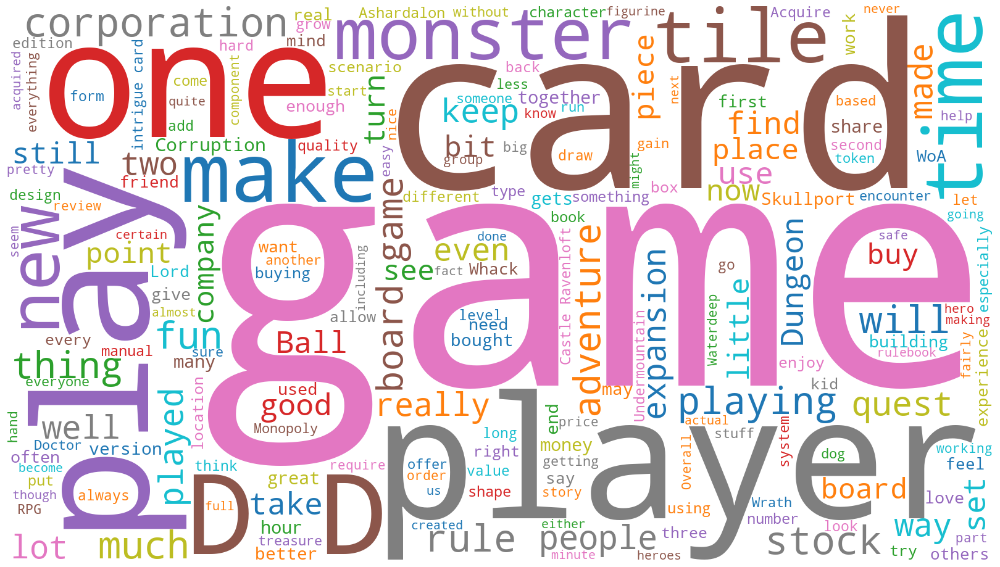

In [374]:
# Create Wordcloud 
text = ' '.join([word for word in positive_reviews['review']])

generate_wordcloud(text, 'positive_wordcloud.png')

* Our analysis shows that many positive reviews center around board games, cards, expansions and corporation. While word cloud analysis helps highlight key discussion topics, it does not reveal which specific products are being discussed. 

##### Identify positive reviews in proportion to total review per product

In [377]:
# Group positive reviews by products
pos_rev_by_product = df_sentiment_updated[df_sentiment_updated['sentiment_labels_blob'] == 'Positive']\
.groupby('product').size().reset_index(name='positive_review_count')

# Merge negative reviews and reviews count (left join)
reviews_by_product = pd.merge(pos_rev_by_product, reviews_by_product, on='product')

# Calculate the proportion of negative reviews
reviews_by_product['postive_review_proportion'] = reviews_by_product['positive_review_count'] / reviews_by_product['total_review_count']

# Sort the result by 'negative_review_proportion' in descending order
reviews_by_product.sort_values(by='postive_review_proportion', ascending=False).head(10)

,product,positive_review_count,negative_review_count,total_review_count,negative_review_proportion,postive_review_proportion
26,1012,12,1,13,0.076923,0.923077
16,629,9,1,10,0.100000,0.900000
19,815,9,1,10,0.100000,0.900000
18,811,9,1,10,0.100000,0.900000
117,6466,9,1,10,0.100000,0.900000
114,6310,9,1,10,0.100000,0.900000
103,5453,9,1,10,0.100000,0.900000
124,6715,9,1,10,0.100000,0.900000
135,7573,9,1,10,0.100000,0.900000
153,10270,9,1,10,0.100000,0.900000


In [378]:
# Check reviews for product 6715
prod_6715 = df_sentiment_updated[df_sentiment_updated['product'] == 6715][['product', 'review']]
prod_6715.style.set_properties(subset=['review'], **{'width': '1200px'})

,product,review
92,6715,This little book is so cute! My kids love it. The cover of the book is a slick surface so you can peel the stickers off and start over again. The inside of the back cover has a robot base you can use to build off of if you so choose.
291,6715,Agree with most of the reviewers. Lovely craft for adults or for children with the help of the adults:) Most children will not be able to make the puppies without the help. Love Klutz crafts. Always a lot of fun! the Yorkie was made by me and the white dog was made by my DD with my help. The head of both can turn :) Very Cute! (Sew the head and the eyes!) Update: Made another puppy- poodle. Used all of my own materials except the eyes. The thread was much thinner-resulting in a smaller puppy. Verdict-you can use thinner thread but I believe the results are not as nice-will try to find thicker thread next time. Used hot glue-easy and strong.
491,6715,"cards a little too big, but the kids really like it and helps start good discussion"
688,6715,Love them- Perfect for my 2 year old granddaughter!
884,6715,"Acquire is a truly brilliant and fun game. It requires strategy and planning and can be a lot of fun. I bought this game because so few people have heard of it and it's great to introduce people to. But this edition is terrible. Previous editions had raised plastic boards and 3D pieces that locked on the board and looked nice. This is all flat cardboard tiles that slide around the board and both look and feel cheap. The previous (1991) edition sells on eBay now for $130, way beyond any reasonable price range. If you love this game, this cheap cardboard version is your only realistic option until the makers finally decide to make a good quality edition again."
1079,6715,"This game is great! You don't have to have a dm or any experience to play. Quick and easy when you want to play D&D, without getting a bunch of people together or spend tons of money on a million game pieces! Totally worth it. Hell, even one person can play if they choose. Really fun!"
1273,6715,"If you want something other than a large battlemat, this set of tiles is a good starting spot for a DM. Problem is 80% of the pre-printed modules you have will not use the majority of the tiles in here, and you will need 2 for most dungeons of descent size. Still if you are looking for a way to laydown a map instead of drawing it, you can't go too wrong here."
1466,6715,Of the many board games I have played. This one is by far my favorite. This expansion adds a lot to the game.
1655,6715,"Thanks they were exactly what I wanted for my son,,"
1864,6715,Wonderful book ............great way to learn new words with the meanings of same.


* There are no fale positive reviews for this product.

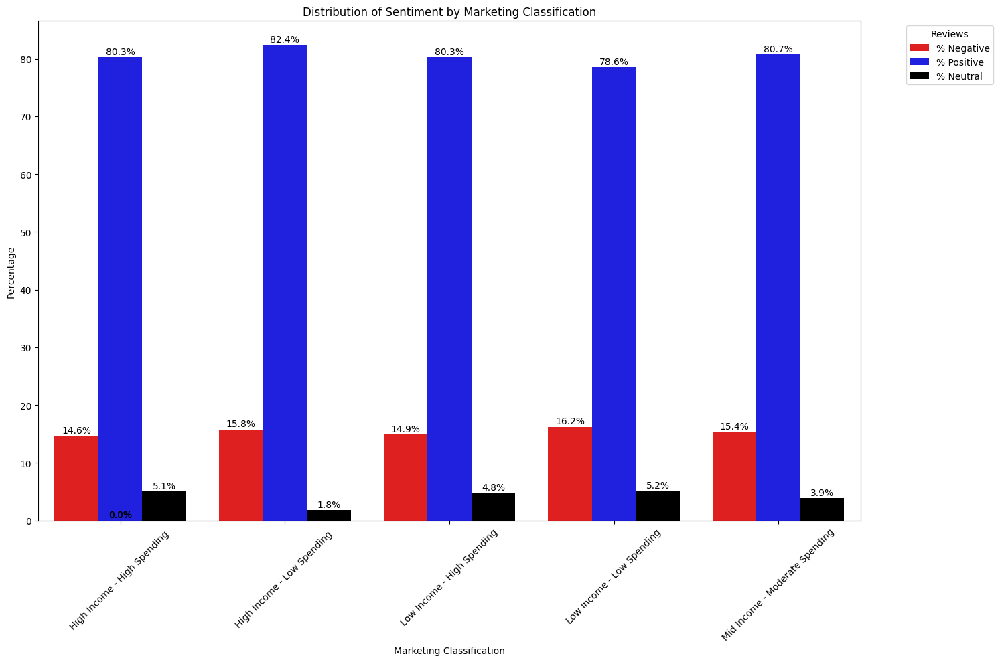

In [380]:
# Group by marketing_labels and sentiment_labels_blob, then calculate counts
marketing_sentiment = df_sentiment_updated.groupby(['marketing_labels', 'sentiment_labels_blob']).size().reset_index(name='count')

# Pivot to calculate total reviews by marketing class and to calculate percentages
marketing_sentiment_pivot = pd.pivot_table(marketing_sentiment, 
                                           values='count', 
                                           index='marketing_labels', 
                                           columns='sentiment_labels_blob', 
                                           aggfunc='sum', 
                                           fill_value=0)

#Get the total reviews by row 
marketing_sentiment_pivot['Total'] = marketing_sentiment_pivot.sum(axis=1)
# Calculate % 
marketing_sentiment_pivot['% Negative'] = (marketing_sentiment_pivot['Negative'] / marketing_sentiment_pivot['Total']) * 100
marketing_sentiment_pivot['% Positive'] = (marketing_sentiment_pivot['Positive'] / marketing_sentiment_pivot['Total']) * 100
marketing_sentiment_pivot['% Neutral'] = (marketing_sentiment_pivot['Neutral'] / marketing_sentiment_pivot['Total']) * 100

# Reset index to make 'marketing_labels' a column
marketing_sentiment_pivot.reset_index(inplace=True)

# Melt the DataFrame for plotting
melted_df = pd.melt(marketing_sentiment_pivot, 
                    id_vars='marketing_labels', 
                    value_vars=['% Negative', '% Positive', '% Neutral'], 
                    var_name='sentiment_labels_blob', 
                    value_name='percentage')

# Define colour palette 
palette_2 = {'% Negative': 'red', '% Positive': 'blue', '% Neutral': 'black'}

# Plotting
plt.figure(figsize=(15, 10))
ax = sns.barplot(data=melted_df, x='marketing_labels', y='percentage', hue='sentiment_labels_blob', palette=palette_2)

# Add percentages on top of the bars
for p in ax.patches:
    height = p.get_height()
    ax.text(
        p.get_x() + p.get_width() / 2.,
        height + 0.5,
        f'{height:.1f}%',
        ha='center')

# Place the legend outside the plot
plt.legend(title='Reviews', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45) 
plt.title('Distribution of Sentiment by Marketing Classification')
plt.xlabel('Marketing Classification')
plt.ylabel('Percentage')
plt.tight_layout()
plt.show()

* There is a high percentage of postive reviews across all groups.
* The group with high income but low spendings (conservative spenders) and mid income - moderate spenders (practical spenders) are the most satisfied.
* The mos dissatified custoemers are low income - low spenders (occasional shoppers) and high income - low spendings (conservative spenders). The last segment is probably more cristical and have higher expectations , so I think it is important to target them specifically and increase their satisfaction.

## 7. Discuss: Insights and observations

***Your observations here...***

* The sentiment analyses conducted using both TextBlob and Vader indicate that the majority of Turtle Game reviews and summaries are positive, providing valuable and reassuring feedback for Turtle Games.
* Vader struggled with this dataset due to lengthy reviews and mixed sentiments. To ensure comprehensive monitoring of potential negative sentiments, we opted to use TextBlob despite the risk of overrepresentation.
* Analyzing all summary reviews that received a score of 0 in the Vader analysis reveals that many statements were misclassified.
* A notable issue in both analyses was that the phrase "Five Stars," which appeared in 378 summary reviews, was classified as neutral, despite clearly conveying a positive sentiment.
* We can compile a list of products with the highest frequency of negative reviews and share it with the marketing and product development teams. This will help improve product quality in future campaigns and facilitate focus groups to identify key areas for enhancement.